# Machine Learning in Finance Group Project 2025
Group Members: Afonso Casanova 20240795 | Francisco Perestrello 20241560 | João Pardal 20240796 | Nuno Vieira 20241111

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, log_loss, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
import xgboost as xgb
from catboost import CatBoostClassifier
import lightgbm as lgb

In [2]:
#!pip install missingno
#!pip install xgboost
#!pip install catboost
#!pip install lightgbm

## Brief Overview of the data

In [3]:
# Load the CSV file into a DataFrame
data = pd.read_csv('project_data.csv')
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,MISSED,RECOVERED
0,330409,0.0,Cash loans,F,Y,Y,0,112500.0,1125000.0,33025.5,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-603.0,0,NaN
1,421359,0.0,Revolving loans,M,N,Y,1,162000.0,270000.0,13500.0,...,0.0168,NaN,No,1.0,0.0,1.0,0.0,-933.0,0,NaN
2,378826,0.0,Cash loans,F,N,Y,0,157500.0,580500.0,49824.0,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-211.0,0,NaN
3,305942,0.0,Cash loans,F,N,Y,1,121500.0,280170.0,30303.0,...,NaN,NaN,NaN,13.0,0.0,13.0,0.0,-1719.0,0,NaN
4,329908,0.0,Revolving loans,M,Y,Y,0,135000.0,135000.0,6750.0,...,NaN,NaN,NaN,1.0,1.0,1.0,1.0,-573.0,0,NaN


In [4]:
# Get a concise summary of the dataset
data.info()

# Get basic statistics of numerical columns
data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158791 entries, 0 to 158790
Data columns (total 95 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    158791 non-null  int64  
 1   TARGET                        158791 non-null  float64
 2   NAME_CONTRACT_TYPE            158791 non-null  object 
 3   CODE_GENDER                   158791 non-null  object 
 4   FLAG_OWN_CAR                  158791 non-null  object 
 5   FLAG_OWN_REALTY               158791 non-null  object 
 6   CNT_CHILDREN                  158791 non-null  int64  
 7   AMT_INCOME_TOTAL              158791 non-null  float64
 8   AMT_CREDIT                    158791 non-null  float64
 9   AMT_ANNUITY                   158786 non-null  float64
 10  AMT_GOODS_PRICE               158654 non-null  float64
 11  NAME_TYPE_SUITE               158135 non-null  object 
 12  NAME_INCOME_TYPE              158791 non-nul

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,MISSED,RECOVERED
count,158791.000000,158791.000000,158791.000000,1.587910e+05,1.587910e+05,158786.000000,1.586540e+05,158791.000000,158791.000000,158791.000000,...,48056.000000,70534.000000,81336.000000,158293.000000,158293.000000,158293.000000,158293.000000,158790.000000,158791.000000,23818.000000
mean,278453.240763,0.149996,0.423355,1.688902e+05,5.969608e+05,27110.032405,5.356876e+05,0.020743,-15941.488605,62208.494423,...,0.008343,0.028018,0.101721,1.427871,0.147871,1.410808,0.103005,-952.990459,1.123936,0.476529
std,102680.393364,0.357069,0.725924,3.108035e+05,3.990185e+05,14407.712389,3.660246e+05,0.013718,4363.442424,139877.508860,...,0.044359,0.069429,0.106423,2.470974,0.457571,2.448515,0.369943,823.770086,2.900722,0.245353
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1980.000000,4.500000e+04,0.000290,-25200.000000,-17583.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4173.000000,0.000000,0.050027
25%,189571.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16636.500000,2.385000e+05,0.010006,-19581.500000,-2717.000000,...,0.000000,0.000000,0.041000,0.000000,0.000000,0.000000,0.000000,-1556.000000,0.000000,0.263832
50%,278694.000000,0.000000,0.000000,1.440000e+05,5.147775e+05,24939.000000,4.500000e+05,0.018850,-15618.000000,-1198.000000,...,0.000000,0.003100,0.068500,0.000000,0.000000,0.000000,0.000000,-744.000000,0.000000,0.475489
75%,367188.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34587.000000,6.795000e+05,0.028663,-12299.000000,-299.000000,...,0.003900,0.026700,0.126100,2.000000,0.000000,2.000000,0.000000,-270.000000,0.000000,0.688102
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7673.000000,365243.000000,...,1.000000,1.000000,1.000000,348.000000,34.000000,344.000000,24.000000,0.000000,12.000000,0.899869


In [5]:
numerical_columns = data.select_dtypes(include=['int64','float64']).columns.tolist()
#numerical_columns

In [6]:
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
#categorical_columns

In [7]:
# check for null values in categorical columns
data_na_cat = data[categorical_columns].isnull().sum()[data.isnull().sum() > 0]
data_na_cat

NAME_TYPE_SUITE           656
OCCUPATION_TYPE         49052
FONDKAPREMONT_MODE     109141
HOUSETYPE_MODE          80411
WALLSMATERIAL_MODE      81443
EMERGENCYSTATE_MODE     76059
dtype: int64

In [8]:
# check for null values in numeric columns
data_na_num = data[numerical_columns].isnull().sum()[data.isnull().sum() > 0]
data_na_num

AMT_ANNUITY                          5
AMT_GOODS_PRICE                    137
OWN_CAR_AGE                     105289
APARTMENTS_AVG                   81306
BASEMENTAREA_AVG                 93563
YEARS_BEGINEXPLUATATION_AVG      78235
YEARS_BUILD_AVG                 106173
COMMONAREA_AVG                  111404
ELEVATORS_AVG                    85340
ENTRANCES_AVG                    80712
FLOORSMAX_AVG                    79767
FLOORSMIN_AVG                   108320
LANDAREA_AVG                     94831
LIVINGAPARTMENTS_AVG            109083
LIVINGAREA_AVG                   80457
NONLIVINGAPARTMENTS_AVG         110735
NONLIVINGAREA_AVG                88257
APARTMENTS_MODE                  81306
BASEMENTAREA_MODE                93563
YEARS_BEGINEXPLUATATION_MODE     78235
YEARS_BUILD_MODE                106173
COMMONAREA_MODE                 111404
ELEVATORS_MODE                   85340
ENTRANCES_MODE                   80712
FLOORSMAX_MODE                   79767
FLOORSMIN_MODE           

In [9]:
# Check correlation between missing data and the target variable
df_na_num = pd.concat([data[data_na_num.index], data['TARGET']], axis=1)
df_na_num.corr(numeric_only=True)['TARGET'].sort_values()

FLOORSMAX_AVG                  -0.058609
FLOORSMAX_MEDI                 -0.058207
FLOORSMAX_MODE                 -0.057427
AMT_GOODS_PRICE                -0.053614
ELEVATORS_AVG                  -0.046824
ELEVATORS_MEDI                 -0.046287
FLOORSMIN_AVG                  -0.045567
FLOORSMIN_MEDI                 -0.045336
FLOORSMIN_MODE                 -0.044672
LIVINGAREA_AVG                 -0.044604
LIVINGAREA_MEDI                -0.044168
ELEVATORS_MODE                 -0.043910
TOTALAREA_MODE                 -0.043859
LIVINGAREA_MODE                -0.041594
APARTMENTS_AVG                 -0.039796
APARTMENTS_MEDI                -0.039311
APARTMENTS_MODE                -0.036974
LIVINGAPARTMENTS_AVG           -0.033685
LIVINGAPARTMENTS_MEDI          -0.032985
YEARS_BUILD_MEDI               -0.031957
YEARS_BUILD_AVG                -0.031648
YEARS_BUILD_MODE               -0.031380
LIVINGAPARTMENTS_MODE          -0.030931
BASEMENTAREA_AVG               -0.030353
BASEMENTAREA_MED

# Exploratory Data Analysis

In [10]:
data.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,MISSED,RECOVERED
0,330409,0.0,Cash loans,F,Y,Y,0,112500.0,1125000.0,33025.5,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-603.0,0,NaN
1,421359,0.0,Revolving loans,M,N,Y,1,162000.0,270000.0,13500.0,...,0.0168,NaN,No,1.0,0.0,1.0,0.0,-933.0,0,NaN
2,378826,0.0,Cash loans,F,N,Y,0,157500.0,580500.0,49824.0,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-211.0,0,NaN
3,305942,0.0,Cash loans,F,N,Y,1,121500.0,280170.0,30303.0,...,NaN,NaN,NaN,13.0,0.0,13.0,0.0,-1719.0,0,NaN
4,329908,0.0,Revolving loans,M,Y,Y,0,135000.0,135000.0,6750.0,...,NaN,NaN,NaN,1.0,1.0,1.0,1.0,-573.0,0,NaN


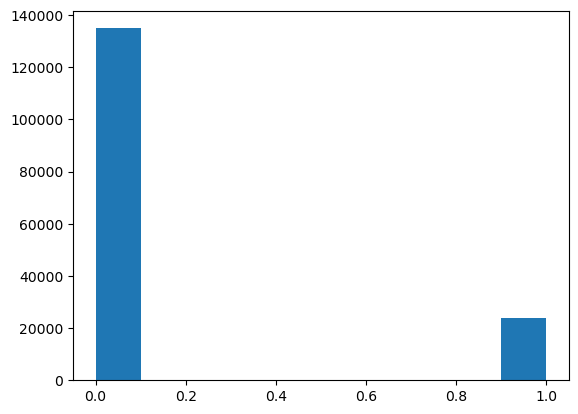

In [11]:
plt.hist(data['TARGET'])
plt.show()

Note that the Data is IMBALANCED

### ID Feature

SK_ID_CURR <- ID of loan in our sample. This will not contribute to a predicting model.

Decision: DROP

In [12]:
# Columns to be dropped
list_col_drop = ['SK_ID_CURR']

### Features related to Assets

Columns: FLAG_OWN_CAR | FLAG_OWN_REALTY

In [13]:
data[['FLAG_OWN_CAR','FLAG_OWN_REALTY']].head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY
0,Y,Y
1,N,Y
2,N,Y
3,N,Y
4,Y,Y


In [14]:
tempY=data[data.FLAG_OWN_CAR=='Y']
tempN=data[data.FLAG_OWN_CAR=='N']
tempY_targ1=tempY[tempY.TARGET==1]
tempN_targ1=tempN[tempN.TARGET==1]

print('Count of people who own a car:', len(tempY), '(', round(len(tempY)/len(data.index)*100,2), '%)')
print('Count of people who DO NOT own a car:', len(tempN), '(', round(len(tempN)/len(data.index)*100,2), '%)')
print('Percentage of people who defaulted having a car:', round(len(tempY_targ1)/len(tempY)*100,2), '%')
print('Percentage of people who defaulted NOT having a car:', round(len(tempN_targ1)/len(tempN)*100,2), '%')

Count of people who own a car: 53504 ( 33.69 %)
Count of people who DO NOT own a car: 105287 ( 66.31 %)
Percentage of people who defaulted having a car: 13.55 %
Percentage of people who defaulted NOT having a car: 15.74 %


In [15]:
tempY=data[data.FLAG_OWN_REALTY=='Y']
tempN=data[data.FLAG_OWN_REALTY=='N']
tempY_targ1=tempY[tempY.TARGET==1]
tempN_targ1=tempN[tempN.TARGET==1]

print('Count of people who own realty:', len(tempY), '(', round(len(tempY)/len(data.index)*100,2), '%)')
print('Count of people who DO NOT own realty:', len(tempN), '(', round(len(tempN)/len(data.index)*100,2), '%)')
print('Percentage of people who defaulted having realty:', round(len(tempY_targ1)/len(tempY)*100,2), '%')
print('Percentage of people who defaulted NOT having realty:', round(len(tempN_targ1)/len(tempN)*100,2), '%')

Count of people who own realty: 110020 ( 69.29 %)
Count of people who DO NOT own realty: 48771 ( 30.71 %)
Percentage of people who defaulted having realty: 14.8 %
Percentage of people who defaulted NOT having realty: 15.45 %


Observations:
- It appears as if people without assets default more than those with assets.

Decisions:
- TRANSFORM: FLAG_OWN_CAR, FLAG_OWN_REALTY. We can convert these two features into a new categorical feature with asset information.

In [16]:
# CREATE NEW COLUMN : 0 - none, 1 - has car without realty, 2 - has realty without car, 3 - has car and realty
list_col_new_asset = ['FLAG_OWN_CAR','FLAG_OWN_REALTY']

### Features related to the Loan

Columns: NAME_CONTRACT_TYPE | AMT_CREDIT | AMT_ANNUITY | AMT_GOODS_PRICE | AMT_INCOME_TOTAL

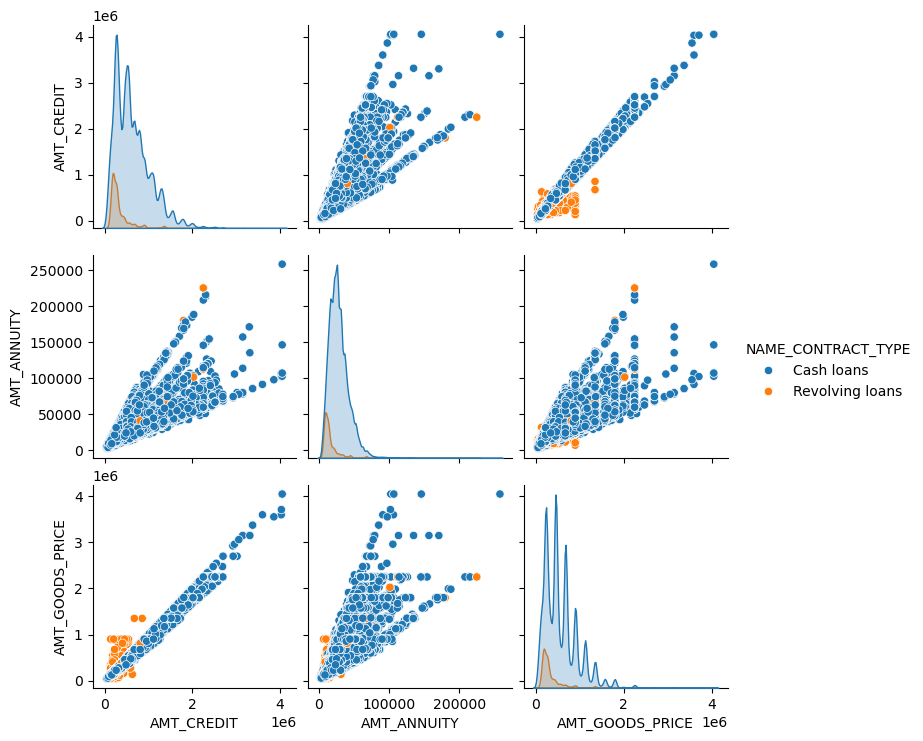

In [17]:
sns.pairplot(data[['NAME_CONTRACT_TYPE','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE']], hue='NAME_CONTRACT_TYPE')
plt.show()

In [18]:
corr1 = round(data.AMT_CREDIT.corr(data.AMT_GOODS_PRICE),2)
corr2 = round(data.AMT_ANNUITY.corr(data.AMT_CREDIT),2)
corr3 = round(data.AMT_ANNUITY.corr(data.AMT_GOODS_PRICE),2)

print('Correlation of Credit amount vs Price of goods:', corr1)
print('Correlation of Annuity amount vs Credit amount:', corr2)
print('Correlation of Annuity amount vs Price of goods:', corr3)

Correlation of Credit amount vs Price of goods: 0.99
Correlation of Annuity amount vs Credit amount: 0.77
Correlation of Annuity amount vs Price of goods: 0.77


Percentage of defaulted cash loan: 15.47 %
Percentage of defaulted revolving loan: 10.41 %


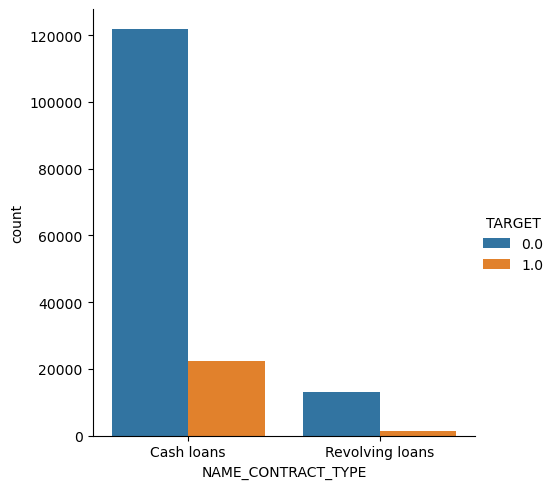

In [19]:
cash = data[data.NAME_CONTRACT_TYPE == 'Cash loans']
rev = data[data.NAME_CONTRACT_TYPE == 'Revolving loans']
def_cash = cash[cash.TARGET==1]
def_rev = rev[rev.TARGET==1]

print('Percentage of defaulted cash loan:',round(len(def_cash)/len(cash)*100,2,), '%')
print('Percentage of defaulted revolving loan:',round(len(def_rev)/len(rev)*100,2), '%')
sns.catplot(data=data, x='NAME_CONTRACT_TYPE', hue='TARGET', kind='count');

Observations:
 - AMT_ANNUITY, AMT_CREDIT and AMT_GOODS_PRICE are all highly correlated. This is expected as the credit amount must increase if the goods for which the loan are for are more expensive, and the loan annuity is dependant on the loan ammount.
 - NAME_CONTRACT_TYPE. Cash loans have a higher default rate than revolving loans, and are much more popular

Decisions:
 - DROP: AMT_GOODS_PRICE. This variable is well represented by AMT_CREDIT
 - KEEP: NAME_CONTRACT_TYPE
 - TRANSFORM: AMT_ANNUITY, AMT_CREDIT, AMT_INCOME_TOTAL. Represent annuity and credit in percentage of the person's total income.

In [20]:
# Columns to be dropped
list_col_drop.extend(['AMT_GOODS_PRICE'])

# Create new column: ANNUITY_PERCENT_INCOME
list_col_new_annuity = ['AMT_ANNUITY', 'AMT_INCOME_TOTAL']

# Create new column: CREDIT_PERCENT_INCOME
list_col_new_credit = ['AMT_CREDIT', 'AMT_INCOME_TOTAL']

### Features related to the household

Columns: CNT_CHILDREN | NAME_FAMILY_STATUS | CNT_FAM_MEMBERS

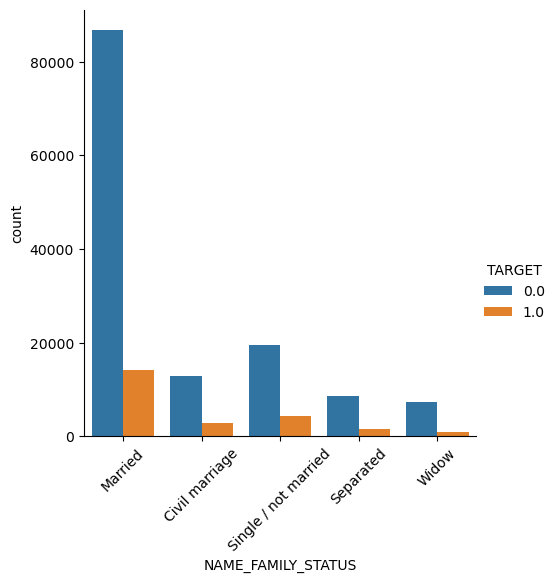

In [21]:
sns.catplot(data=data, x='NAME_FAMILY_STATUS', hue='TARGET', kind='count')
plt.xticks(rotation=45)
plt.show()

In [22]:
married = data[data.NAME_FAMILY_STATUS == 'Married']
civil = data[data.NAME_FAMILY_STATUS == 'Civil marriage']
single = data[data.NAME_FAMILY_STATUS == 'Single / not married']
separated = data[data.NAME_FAMILY_STATUS == 'Separated']
widow = data[data.NAME_FAMILY_STATUS == 'Widow']

def_married = married[married.TARGET==1]
def_civil = civil[civil.TARGET==1]
def_single = single[single.TARGET==1]
def_separated = separated[separated.TARGET==1]
def_widow = widow[widow.TARGET==1]

print('Percentage of defaulted married:', round(len(def_married)/len(married)*100,2,), '%')
print('Percentage of defaulted civil marriage:', round(len(def_civil)/len(civil)*100,2,), '%')
print('Percentage of defaulted single:', round(len(def_single)/len(single)*100,2,), '%')
print('Percentage of defaulted separated:', round(len(def_separated)/len(separated)*100,2,), '%')
print('Percentage of defaulted widow:', round(len(def_widow)/len(widow)*100,2,), '%')

Percentage of defaulted married: 14.09 %
Percentage of defaulted civil marriage: 18.12 %
Percentage of defaulted single: 18.0 %
Percentage of defaulted separated: 15.31 %
Percentage of defaulted widow: 11.09 %


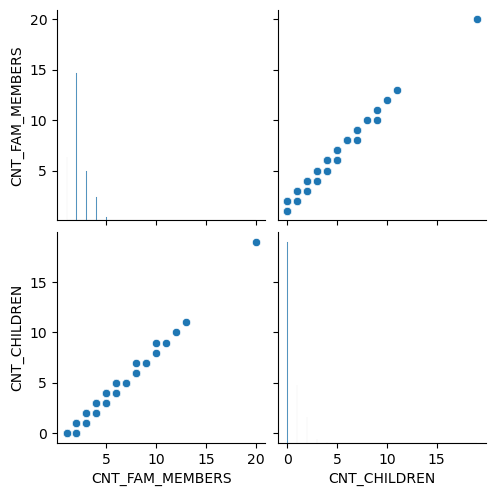

In [23]:
sns.pairplot(data[['CNT_FAM_MEMBERS', 'CNT_CHILDREN']])
plt.show()

Observations:
 - Most observations are married; Civil marriages and single individuals default the most, widows the least
 - As expected, the ammount of children is well represented by the total number of family members, which accounts for the customer itself, plus spouse (if any), plus number of children (if any)
 - Using household information as an approximation of expenditures, this variable becomes redundant

Decisions:
 - DROP: CNT_CHILDREN
 - KEEP: CNT_FAM_MEMBERS, NAME_FAMILY_STATUS

In [24]:
# Columns to be dropped
list_col_drop.extend(['CNT_CHILDREN'])

### Features related to Travel

Columns: FLAG_OWN_CAR | OWN_CAR_AGE | REG_REGION_NOT_WORK_REGION | REG_CITY_NOT_WORK_CITY

In [25]:
data[['FLAG_OWN_CAR','OWN_CAR_AGE']]

,FLAG_OWN_CAR,OWN_CAR_AGE
0,Y,8.0
1,N,NaN
2,N,NaN
3,N,NaN
4,Y,7.0
...,...,...
158786,N,NaN
158787,N,NaN
158788,Y,30.0
158789,N,NaN


In [26]:
no_car, yes_car = data.FLAG_OWN_CAR.value_counts()

print('How many customers own a car? :', yes_car)
print('How many customers do NOT own a car? :', no_car)
print('How many missing values on OWN_CAR_AGE? :', data.OWN_CAR_AGE.isnull().sum())

How many customers own a car? : 53504
How many customers do NOT own a car? : 105287
How many missing values on OWN_CAR_AGE? : 105289


In [28]:
diff = data[data.REG_REGION_NOT_WORK_REGION == 1]
same = data[data.REG_REGION_NOT_WORK_REGION == 0]
def_diff = diff[diff.TARGET==1]
def_same = same[same.TARGET==1]

print('Customers with different region address:', len(diff), '(', round(len(diff)/len(data)*100,2), '% )')
print('Customers with same region address:', len(same), '(', round(len(same)/len(data)*100,2), '% )')
print('\n')
print('Percentage of defaulted different region address:', round(len(def_diff)/len(diff)*100,2,), '%')
print('Percentage of defaulted same region address:', round(len(def_same)/len(same)*100,2), '%')

Customers with different region address: 8233 ( 5.18 % )
Customers with same region address: 150558 ( 94.82 % )


Percentage of defaulted different region address: 16.19 %
Percentage of defaulted same region address: 14.93 %


In [29]:
diff = data[data.REG_CITY_NOT_WORK_CITY == 1]
same = data[data.REG_CITY_NOT_WORK_CITY == 0]
def_diff = diff[diff.TARGET==1]
def_same = same[same.TARGET==1]

print('Customers with different city address:', len(diff), '(', round(len(diff)/len(data)*100,2), '% )')
print('Customers with same city address:', len(same), '(', round(len(same)/len(data)*100,2), '% )')
print('\n')
print('Percentage of defaulted different city address:', round(len(def_diff)/len(diff)*100,2,), '%')
print('Percentage of defaulted same city address:', round(len(def_same)/len(same)*100,2), '%')

Customers with different region address: 37446 ( 23.58 % )
Customers with same region address: 121345 ( 76.42 % )


Percentage of defaulted different city address: 19.24 %
Percentage of defaulted same city address: 13.69 %


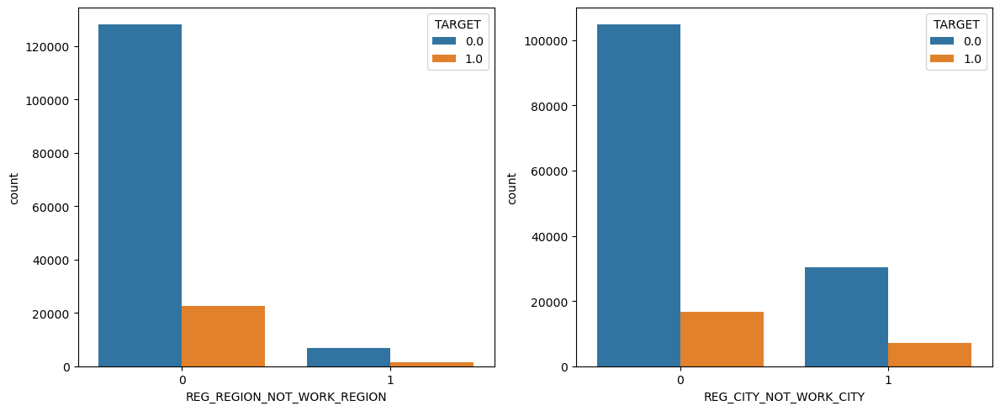

In [30]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
sns.countplot(data=data, x='REG_REGION_NOT_WORK_REGION', hue='TARGET', ax=ax1)
sns.countplot(data=data, x='REG_CITY_NOT_WORK_CITY', hue='TARGET', ax=ax2)
plt.tight_layout()

Observations:
 - The number of missing values in OWN_CAR_AGE is almost fully explained by customers that do not own a car, thereby causing these missing values;
 - REG_REGION_NOT_WORK_REGION Despite customers with different region addresses appearing to default more, the difference is negligible (<2%). The data is very imbalanced;
 - REG_CITY_NOT_WORK_CITY shows similar address information, though at a city level. However, this information is a lot more balanced, and the difference in default rates is higher than 5%.

Decisions:
 - DROP: REG_REGION_NOT_WORK_REGION
 - KEEP: REG_CITY_NOT_WORK_CITY
 - TRANSFORM: OWN_CAR_AGE. Substitute the NaNs with 0, for people who don't own a car. (FLAG_OWN_CAR was transformed above, in the Assets section)

In [31]:
# Transform the car age column
list_col_new_car = ['OWN_CAR_AGE']

# Columns to be dropped
list_col_drop.extend(['REG_REGION_NOT_WORK_REGION'])

### Features related to the Building

Columns: NAME_HOUSING_TYPE | _AVG | _MODE | _MEDI

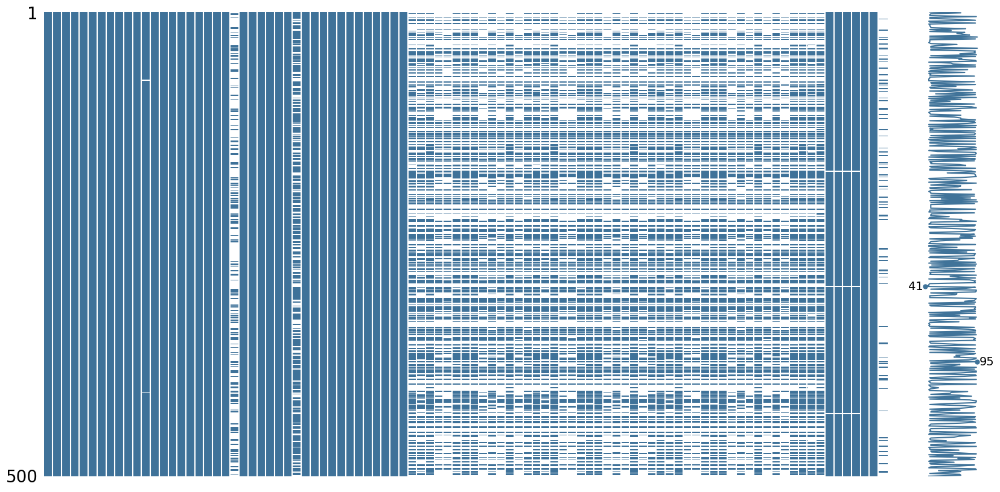

In [32]:
# Plotting a matrix of missing values on a 500 observation sample
msno.matrix(data.sample(500), sparkline=True, figsize=(20,10), sort=None, color=(0.25, 0.45, 0.6))
plt.show()

We see around half of the columns, represented by the x-axis, seem to have common missing values across the observations, represented by the left y-axis

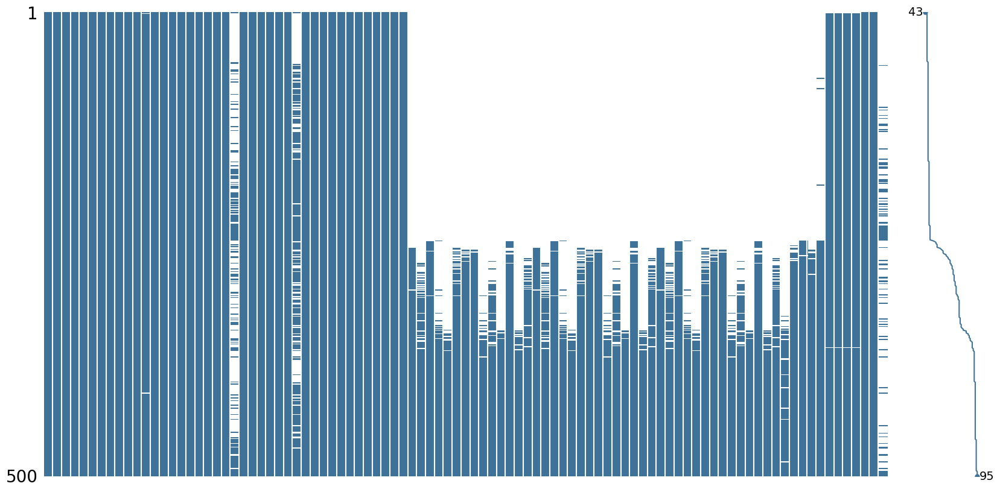

In [33]:
# Plot the same matrix sorted by density of completeness
msno.matrix(data.sample(500), sparkline=True, figsize=(20,10), sort='ascending', color=(0.25, 0.45, 0.6))
plt.show()

Sorted by density of completeness, represented by the y-axis on the right, it is notable around half our sample has missing values in around half of the dataset's columns.

Looking deeper, these are all the columns related to building information.

In [34]:
building_columns = data.columns[41:88]
building_columns

Index(['APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG',
       'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE',
       'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE',
       'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI',
       'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI',
       'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_M

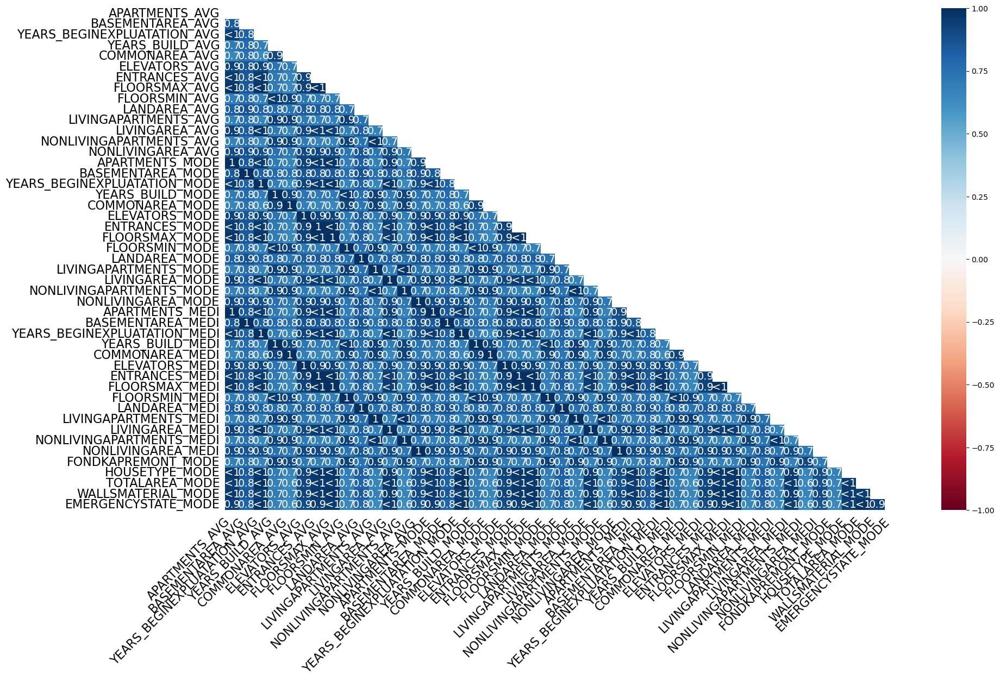

In [35]:
# Plotting the correlation of missing values matrix
msno.heatmap(data[building_columns])
plt.show()

In [36]:
len(building_columns)

47

47 building columns. 0 - no housing info (>45 NaN), 1 - some housing info (20<NaN<45), 2 - has housing info (<20 NaN)

In [37]:
data_copy = data.copy()
data_copy['HOUSING_INFO'] = 0 # no info
data_copy.loc[(data_copy[building_columns].isnull().sum(axis=1) > 20) & (data_copy[building_columns].isnull().sum(axis=1) < 45), 'HOUSING_INFO'] = 1 # some info
data_copy.loc[data_copy[building_columns].isnull().sum(axis=1) < 20, 'HOUSING_INFO'] = 2 # has info

In [38]:
mean_n = np.mean(data_copy.loc[data_copy['HOUSING_INFO'] == 0, 'TARGET'].values)
mean_s = np.mean(data_copy.loc[data_copy['HOUSING_INFO'] == 1, 'TARGET'].values)
mean_h = np.mean(data_copy.loc[data_copy['HOUSING_INFO'] == 2, 'TARGET'].values)
print('Default ratio for complete info: {:.1%} \nDefault ratio for some info: {:.1%} \nDefault ratio for no info: {:.1%}'.format(mean_h, mean_s, mean_n))

Default ratio for complete info: 12.9% 
Default ratio for some info: 14.3% 
Default ratio for no info: 16.9%


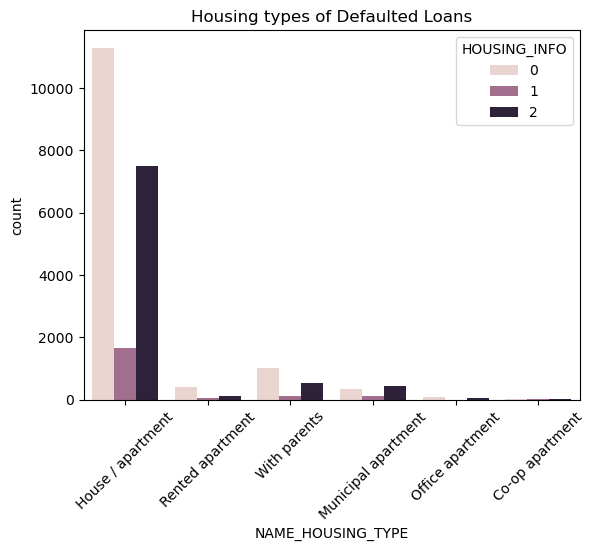

In [39]:
sns.countplot(data=data_copy[data_copy['TARGET']==1], x='NAME_HOUSING_TYPE', hue='HOUSING_INFO')
plt.title('Housing types of Defaulted Loans')
plt.xticks(rotation=45)
plt.show()

Observations:
 - We can clearly observe patterns in the missing data, with roughly half the population not having any housing information. This is confirmed in the heatmap of correlations of missing values - the correlation between missing values in any two building column is always at least 0.7;
 - There appears to be a difference in default rates among different ammounts of building information;
 - As such, the fact there is missing data is itself usefull information for our model;
 - Most missing building data comes from owned Houses or Apartments, followed by those who live With Parents. These make sense as the former might live in these houses for a long time or have inherited it (thus either forgetting information or not knowing it at all), while the latter usually do not know these informations about their parents' house.

Decisions:
 - KEEP: NAME_HOUSING_TYPE
 - TRANSFORM: All building columns. HOUSING_INFO: 0 - no info, 1 - some info, 2 - has info

In [40]:
# Create new column: HOUSING_INFO
list_col_new_house = building_columns
list_col_new_house

Index(['APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG',
       'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE',
       'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE',
       'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI',
       'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI',
       'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_M

### Features related to Time

Columns: WEEKDAY_APPR_PROCESS_START | HOUR_APPR_PROCESS_START

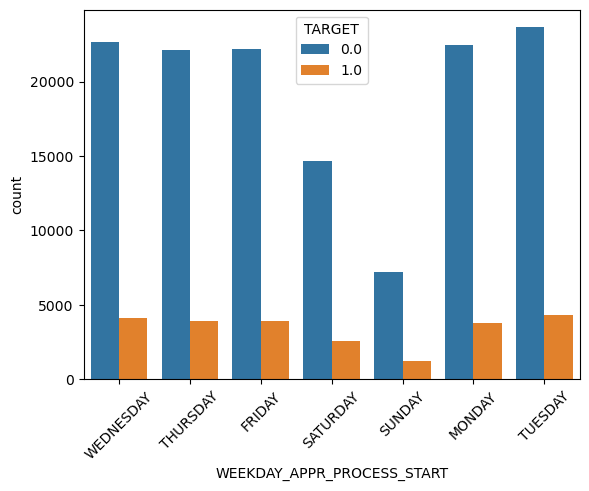

In [41]:
sns.countplot(data=data, x='WEEKDAY_APPR_PROCESS_START', hue='TARGET', order=['WEDNESDAY', 'THURSDAY', 'FRIDAY', 'SATURDAY', 'SUNDAY', 'MONDAY', 'TUESDAY'])
plt.xticks(rotation=45)
plt.show()

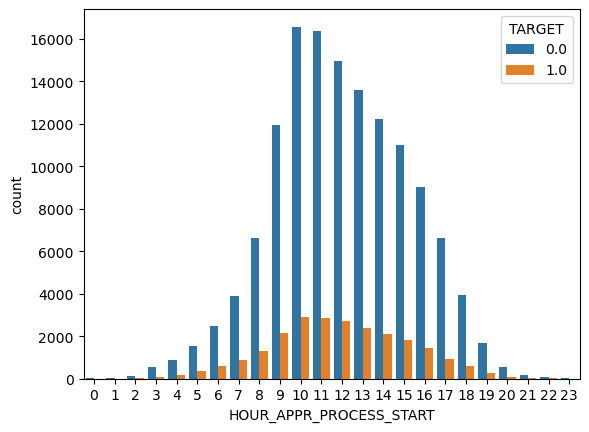

In [42]:
sns.countplot(data=data, x='HOUR_APPR_PROCESS_START', hue='TARGET')
plt.show()

Observations:
 - Both the day of the week the clients applied for the loan as well as the hours at which they did it follow the patterns we would expect;
 - Most loan applications are concentrated around the middle of the day, with them gradually decreasing the further we go from there. Regarding weekdays, the amount of loan applications is similar for every day of the work week, following a large drop on Saturdays, and a similar drop on Sundays;
 - The default rates on these loans follow similar patterns in both cases, suggesting this information might not very useful in predicting if clients will default, as expected.

Decisions:
 - DROP: WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START

In [43]:
# Columns to be dropped
list_col_drop.extend(['WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START'])

### Features related to Employment

Columns: AMT_INCOME_TOTAL | NAME_INCOME_TYPE | DAYS_EMPLOYED | OCCUPATION_TYPE | ORGANIZATION_TYPE

In [44]:
data[['AMT_INCOME_TOTAL','NAME_INCOME_TYPE','DAYS_EMPLOYED','OCCUPATION_TYPE','ORGANIZATION_TYPE']].describe(include='all')

,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,DAYS_EMPLOYED,OCCUPATION_TYPE,ORGANIZATION_TYPE
count,1.587910e+05,158791,158791.000000,109739,158791
unique,NaN,8,NaN,18,58
top,NaN,Working,NaN,Laborers,Business Entity Type 3
freq,NaN,83051,NaN,29202,35643
mean,1.688902e+05,NaN,62208.494423,NaN,NaN
std,3.108035e+05,NaN,139877.508860,NaN,NaN
min,2.565000e+04,NaN,-17583.000000,NaN,NaN
25%,1.125000e+05,NaN,-2717.000000,NaN,NaN
50%,1.440000e+05,NaN,-1198.000000,NaN,NaN
75%,2.025000e+05,NaN,-299.000000,NaN,NaN


In [45]:
def get_thresh(df, field):
    """ Outliers are usually > 3 standard deviations away from the mean. """
    avg = np.mean(df[field])
    sd = np.std(df[field])
    threshold = round(avg+(3*sd),2)
    print('Threshold for', field, ':', threshold)
    return threshold

In [46]:
thresh_income = get_thresh(data, 'AMT_INCOME_TOTAL') # Get threshold for income
anomaly_days_employed = int(data['DAYS_EMPLOYED'][data['DAYS_EMPLOYED']>0].unique()[0]) # Find the days employed anomaly

temp_original = data[['AMT_INCOME_TOTAL','DAYS_EMPLOYED']]
temp_no_outliers = data[['AMT_INCOME_TOTAL','DAYS_EMPLOYED']][(data['AMT_INCOME_TOTAL'] < thresh_income) & (data['DAYS_EMPLOYED'] <= 0)]

print('Anomalous data for DAYS_EMPLOYED :', anomaly_days_employed)

Threshold for AMT_INCOME_TOTAL : 1101297.83
Anomalous data for DAYS_EMPLOYED : 365243


In [47]:
# Function to plot boxplots of two columns
def plotdist(df, f1, f2):
    fig, ax = plt.subplots(1,2, figsize=(10,3))
    sns.boxplot(data=df[f1], ax=ax[0])
    sns.boxplot(data=df[f2], ax=ax[1])
    plt.tight_layout()

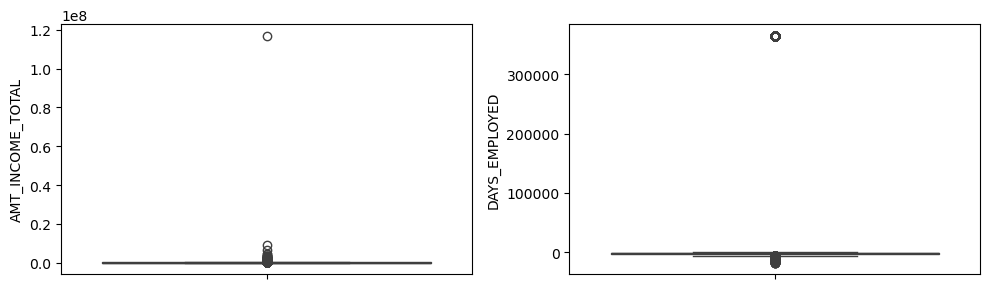

In [48]:
plotdist(temp_original,'AMT_INCOME_TOTAL','DAYS_EMPLOYED')

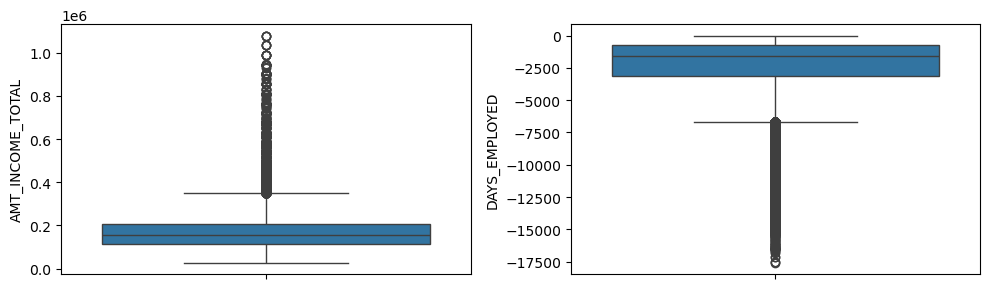

In [49]:
plotdist(temp_no_outliers,'AMT_INCOME_TOTAL','DAYS_EMPLOYED')

C:\Users\afcas\AppData\Local\Temp\ipykernel_17048\685904165.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=unpaid, x='NAME_INCOME_TYPE', palette='husl')


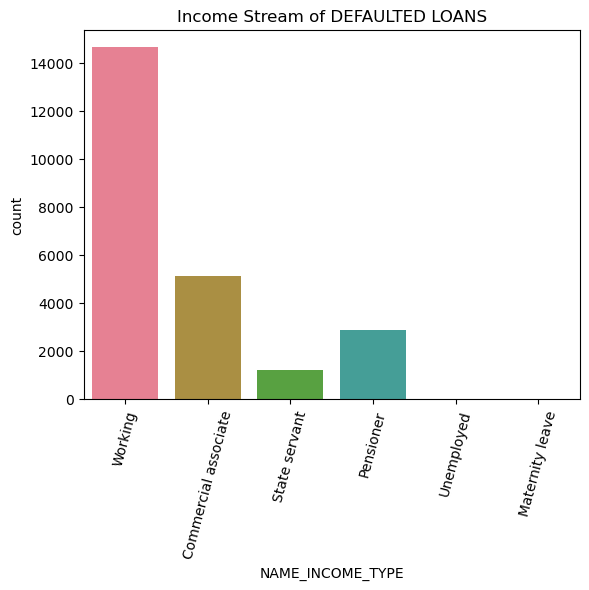

In [50]:
unpaid = data[data['TARGET'] == 1]
sns.countplot(data=unpaid, x='NAME_INCOME_TYPE', palette='husl')
plt.xticks(rotation=75)
plt.title('Income Stream of DEFAULTED LOANS')
plt.show()

C:\Users\afcas\AppData\Local\Temp\ipykernel_17048\2435055224.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=unpaid, x='ORGANIZATION_TYPE', ax=ax, palette='husl')


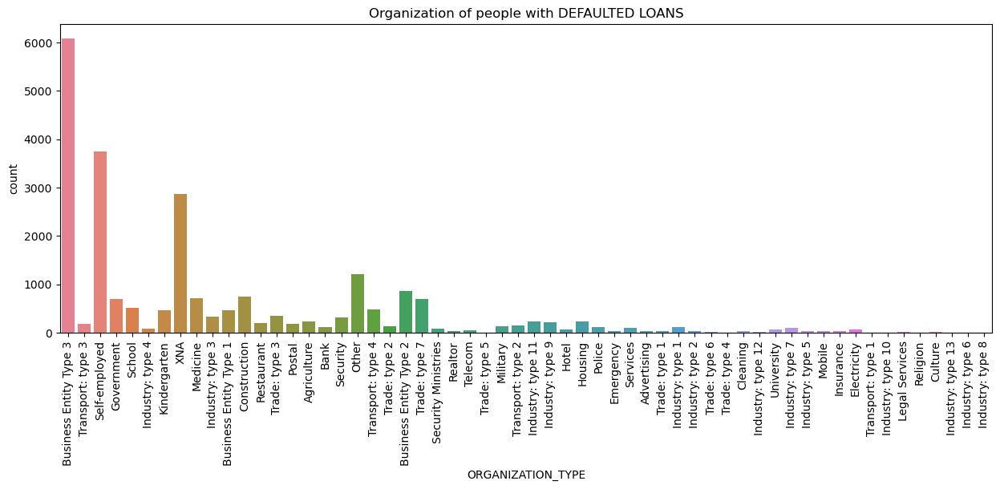

In [51]:
fig,ax = plt.subplots(figsize=(15,5))
sns.countplot(data=unpaid, x='ORGANIZATION_TYPE', ax=ax, palette='husl')
plt.xticks(rotation=90)
plt.title('Organization of people with DEFAULTED LOANS')
plt.show()

In [52]:
print('Number of individuals having the days employed anomaly:', len(data[data['DAYS_EMPLOYED']==anomaly_days_employed]))

Number of individuals having the days employed anomaly: 27885


In [53]:
temp = data[data['OCCUPATION_TYPE'].isnull()]
print('Individuals that left OCCUPATION_TYPE field blank:')
print(temp['NAME_INCOME_TYPE'].value_counts())

Individuals that left OCCUPATION_TYPE field blank:
NAME_INCOME_TYPE
Pensioner               27874
Working                 12942
Commercial associate     6322
State servant            1898
Unemployed                 13
Student                     2
Maternity leave             1
Name: count, dtype: int64


In [54]:
print('Individuals that left OCCUPATION_TYPE field blank (Top 10):')
print(temp['ORGANIZATION_TYPE'].value_counts().head(10))

Individuals that left OCCUPATION_TYPE field blank (Top 10):
ORGANIZATION_TYPE
XNA                       27884
Business Entity Type 3     7431
Other                      2602
Self-employed              1850
Business Entity Type 2     1208
Government                 1100
School                      752
Business Entity Type 1      675
Medicine                    525
Transport: type 4           489
Name: count, dtype: int64


In [55]:
def plotstrip(df, xval, yval, hueval, yfig):
    fig,ax = plt.subplots(figsize=(12, yfig))
    sns.stripplot(x=xval, y=yval, hue=hueval, data=df, alpha=0.5, jitter=0.8, dodge=True, ax=ax)
    plt.title('Income Distribution per ' + yval)
    plt.legend()
    plt.show()

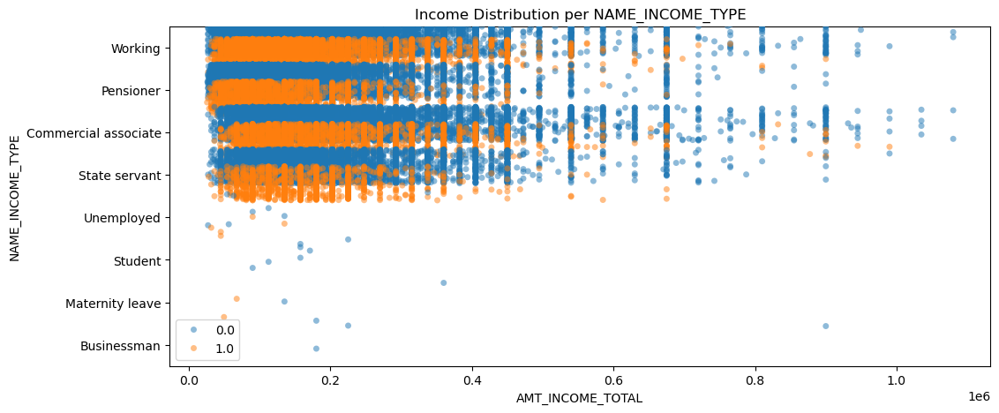

In [56]:
plotstrip(data[data['AMT_INCOME_TOTAL'] < thresh_income], 'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'TARGET', 5)

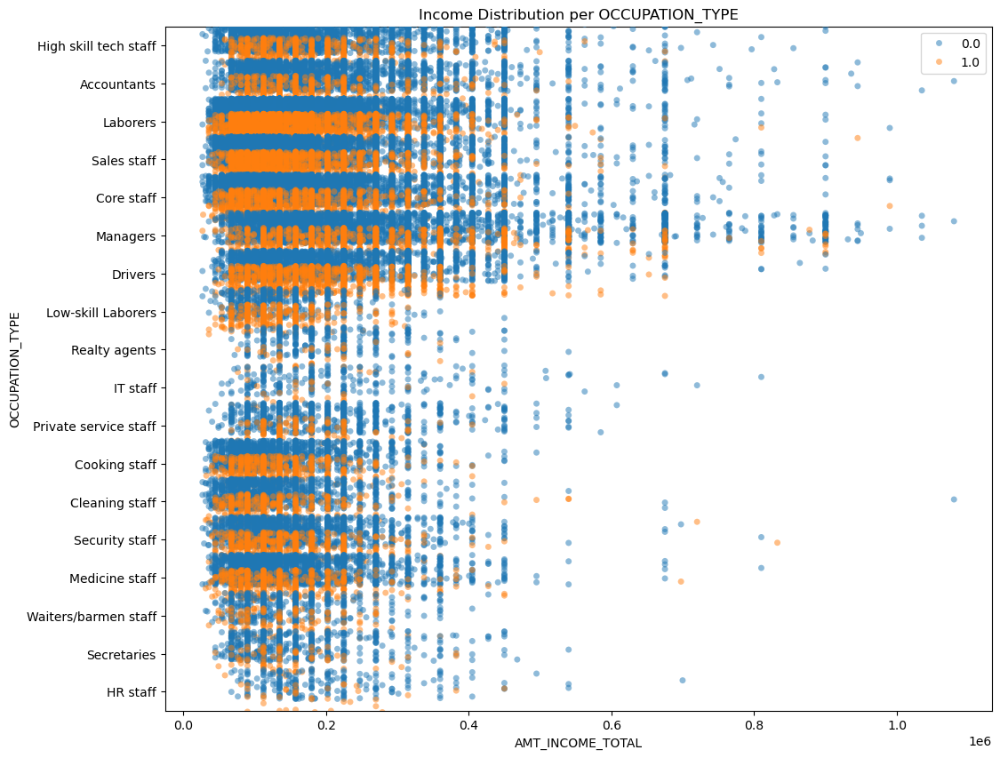

In [57]:
plotstrip(data[data['AMT_INCOME_TOTAL'] < thresh_income], 'AMT_INCOME_TOTAL', 'OCCUPATION_TYPE', 'TARGET', 10)

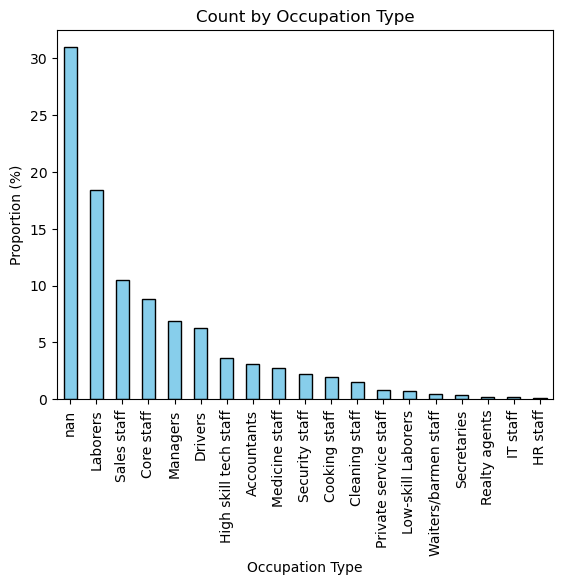

In [58]:
# Count the occurrences of each category
category_counts = data['OCCUPATION_TYPE'].value_counts(normalize=True, dropna=False) * 100

# Plot the counts
category_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Count by Occupation Type')
plt.xlabel('Occupation Type')
plt.ylabel('Proportion (%)')
plt.xticks(rotation=90)
plt.show()

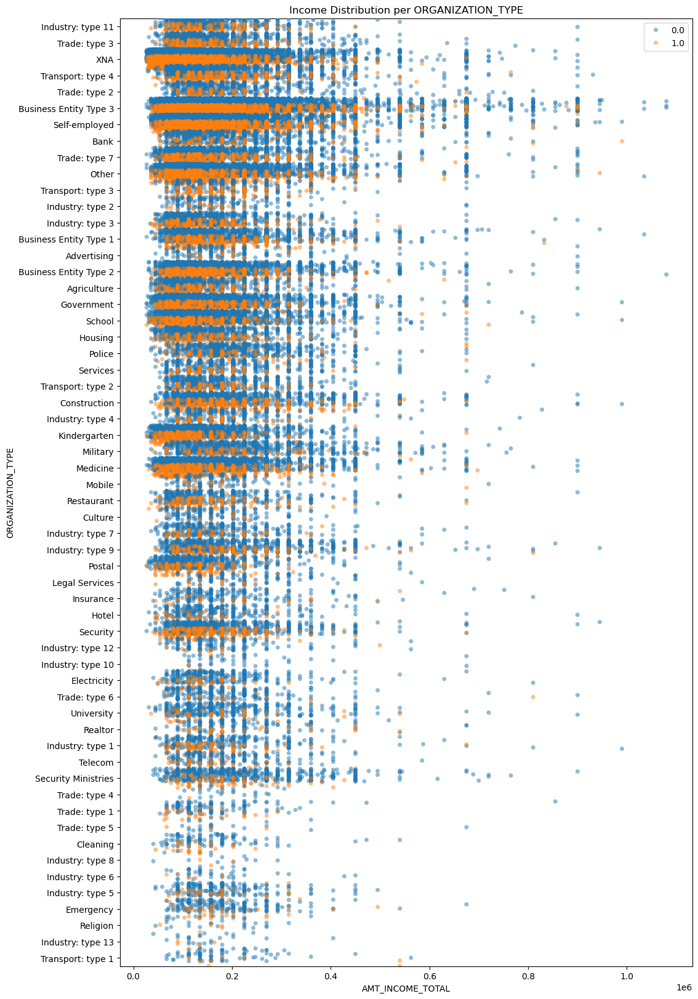

In [59]:
plotstrip(data[data['AMT_INCOME_TOTAL'] < thresh_income], 'AMT_INCOME_TOTAL', 'ORGANIZATION_TYPE', 'TARGET', 20)

Observations:
 - AMT_INCOME_TOTAL clearly has outliers, with its 75th percentile being 202,500, and its maximum 117,000,000;
 - DAYS_EMPLOYED shows an anomaly in the data, given it shows how many days relative to the application the person started their current employment, but its maximum value is 365243;
 - The number of individuals having the days employed anomaly practically matches the number of pensioners in the dataset that left OCCUPATION_TYPE blank;
 - This number also matches the number of individuals with an 'XNA' ORGANIZATION_TYPE, suggesting these participants are pensioners;
 - The 'working' category in NAME_INCOME_TYPE is the most dense in terms of low wage high default customers. We also have very few samples on 'unemployed', 'student', 'maternity leave' and 'businessman';
 - OCCUPATION_TYPE has more than 30% missing values;
 - ORGANIZATION_TYPE is pretty diverse but Business Entity Type 3, self-employed, and XNA are the categories where the defaulting individuals are most dominant;

Decisions:
 - DROP: OCCUPATION_TYPE - Has a high percentage of missing values and its information can be approximated by ORGANIZATION_TYPE. NAME_INCOME_TYPE - Again, this information can be obtained by other features as ORGANIZATION_TYPE and customer age
 - KEEP: ORGANIZATION_TYPE
 - TRANSFORM: AMT_INCOME_TOTAL - Create INCOME_BAND feature. DAYS_EMPLOYED - Convert the 365243 anomaly to -24,455 (67 yrs, the retirement age in Portugal), and convert to years for easier reading

In [60]:
# Transform the income column
list_col_new_income = ['AMT_INCOME_TOTAL']

# Transform the employment column
list_col_new_daysemp = ['DAYS_EMPLOYED']

# Columns to be dropped
list_col_drop.extend(['OCCUPATION_TYPE','NAME_INCOME_TYPE'])

### Features related to Trustworthiness

These are several columns of the dataset which did not really have a dominant category, and include information such as personal information, contact information, address information and social information

Columns: CODE_GENDER | NAME_TYPE_SUITE | NAME_EDUCATION_TYPE | DAYS_REGISTRATION | DAYS_ID_PUBLISH | FLAG_MOBIL | FLAG_EMP_PHONE | FLAG_WORK_PHONE | FLAG_CONT_MOBILE | FLAG_PHONE | FLAG_EMAIL | REGION_RATING_CLIENT | REGION_RATING_CLIENT_W_CITY | REG_REGION_NOT_LIVE_REGION | LIVE_REGION_NOT_WORK_REGION | REG_CITY_NOT_LIVE_CITY | LIVE_CITY_NOT_WORK_CITY | OBS_30_CNT_SOCIAL_CIRCLE | DEF_30_CNT_SOCIAL_CIRCLE | OBS_60_CNT_SOCIAL_CIRCLE | DEF_60_CNT_SOCIAL_CIRCLE | DAYS_LAST_PHONE_CHANGE

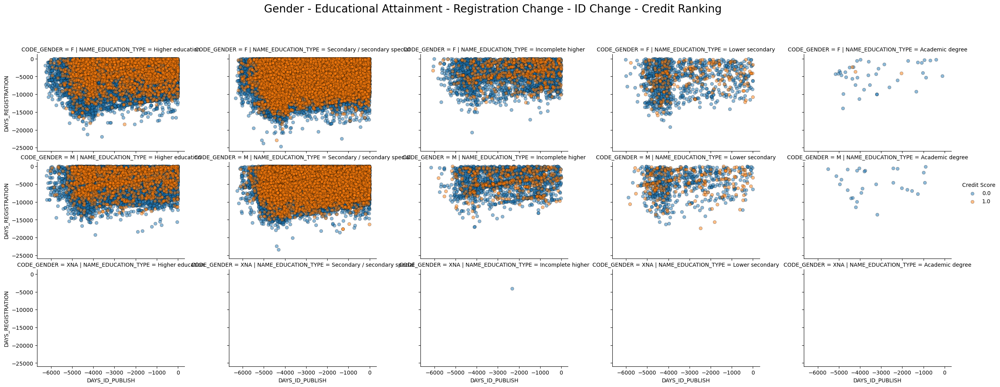

In [61]:
g = sns.FacetGrid(data,row='CODE_GENDER',col='NAME_EDUCATION_TYPE',hue='TARGET',height=4) # nominal
g.map(plt.scatter,'DAYS_ID_PUBLISH','DAYS_REGISTRATION',alpha=0.5,edgecolor='k',linewidth=0.5) # continuous

fig = g.fig
fig.set_size_inches(25,10)
fig.subplots_adjust(top=0.85,wspace=0.3)
fig.suptitle('Gender - Educational Attainment - Registration Change - ID Change - Credit Ranking',fontsize=20)

l = g.add_legend(title='Credit Score')

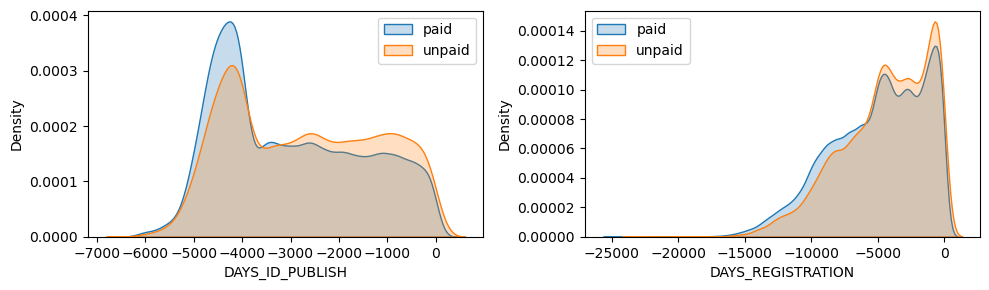

In [62]:
paid = data[data.TARGET==0]
unpaid = data[data.TARGET==1]

f,axes = plt.subplots(1,2,figsize=(10,3))
sns.kdeplot(paid['DAYS_ID_PUBLISH'],cmap="Blues",fill=True,ax=axes[0], label='paid')
sns.kdeplot(unpaid['DAYS_ID_PUBLISH'],cmap="Reds",fill=True,ax=axes[0], label='unpaid')
sns.kdeplot(paid['DAYS_REGISTRATION'],cmap="Blues",fill=True,ax=axes[1], label='paid')
sns.kdeplot(unpaid['DAYS_REGISTRATION'],cmap="Reds",fill=True,ax=axes[1], label='unpaid')
axes[0].legend()
axes[1].legend(loc='upper left')
plt.tight_layout()

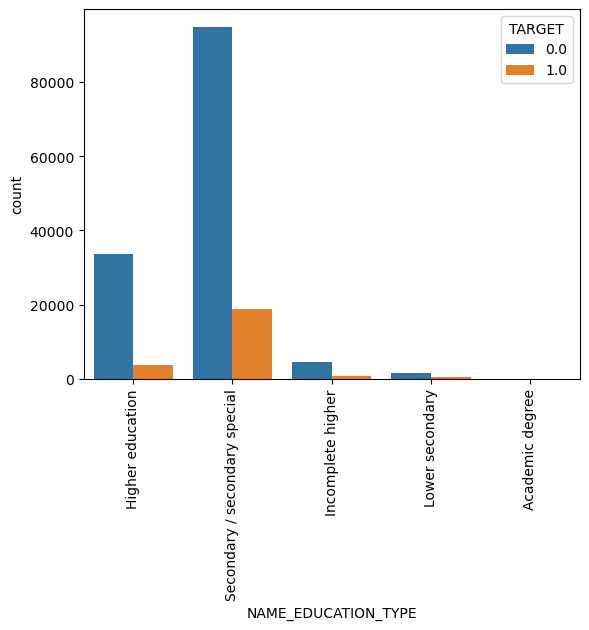

In [63]:
sns.countplot(data=data, x='NAME_EDUCATION_TYPE', hue='TARGET')
plt.xticks(rotation=90)
plt.show()

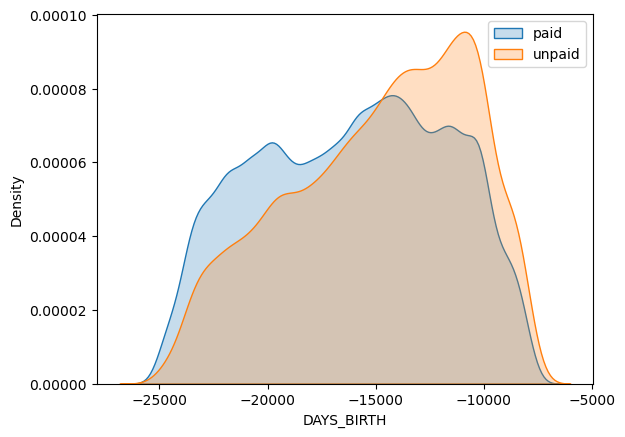

In [64]:
sns.kdeplot(paid['DAYS_BIRTH'],cmap="Blues",fill=True, label='paid')
sns.kdeplot(unpaid['DAYS_BIRTH'],cmap="Reds",fill=True, label='unpaid')
plt.legend()
plt.show()

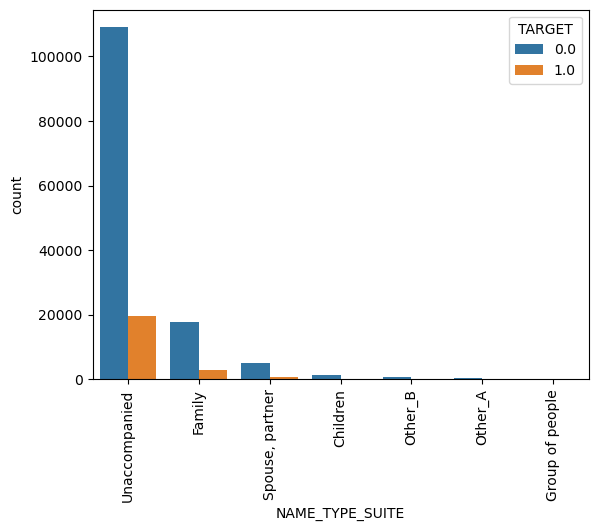

In [65]:
sns.countplot(data=data, x='NAME_TYPE_SUITE', hue='TARGET')
plt.xticks(rotation=90)
plt.show()

Observations:
 - Male and Female customers show similar trends across all education levels
 - Most customers have secondary education and this is where defaults are most dense. Though few, those with academic degrees got the least number of defaults
 - Both the number of days before the application a customer changed their registration or identity document show the same pattern across gender and education type, as well as in density across paid and unpaid loans
 - The age of the customers follows expectations, with young people defaulting more
 - The great majority of customers went unnacompained to the ask for the loan

Decisions:
 - DROP: DAYS_REGISTRATION, DAYS_ID_PUBLISH, NAME_TYPE_SUITE
 - KEEP: CODE_GENDER, NAME_EDUCATION_TYPE
 - TRANSFORM: DAYS_BIRTH - Convert to years for easier reading

In [66]:
# Transform the age column
list_col_new_age = ['DAYS_BIRTH']

# Columns to be dropped
list_col_drop.extend(['DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'NAME_TYPE_SUITE'])

In [67]:
temp=['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL']

In [68]:
def featsum(cols,newcol):
    """ Sums up items per row across all columns.
        Returns df with new sum column and catplot.
    """
    sample_count=data[cols].sum(axis=1)
    sample = data.copy()
    sample[newcol]=sample_count
    sns.catplot(data=sample,x=newcol,hue='TARGET',kind='count')

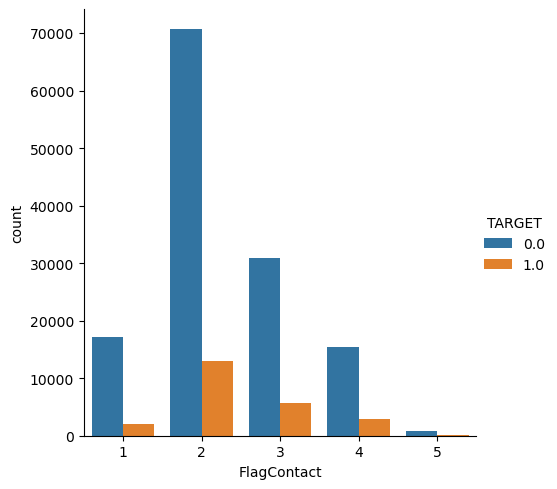

In [69]:
featsum(temp,'FlagContact')

Observations:
 - All these features relate to the contact with the customer. Most customers provided two contact forms.

Decisions:
 - TRANSFORM: 'FLAG-' - Sum to account for the contact availability provided by the client

In [70]:
# Create new column : FLAG_CONTACTS
list_col_new_flagCont = [
    'FLAG_MOBIL',
    'FLAG_EMP_PHONE',
    'FLAG_WORK_PHONE',
    'FLAG_PHONE',
    'FLAG_EMAIL']

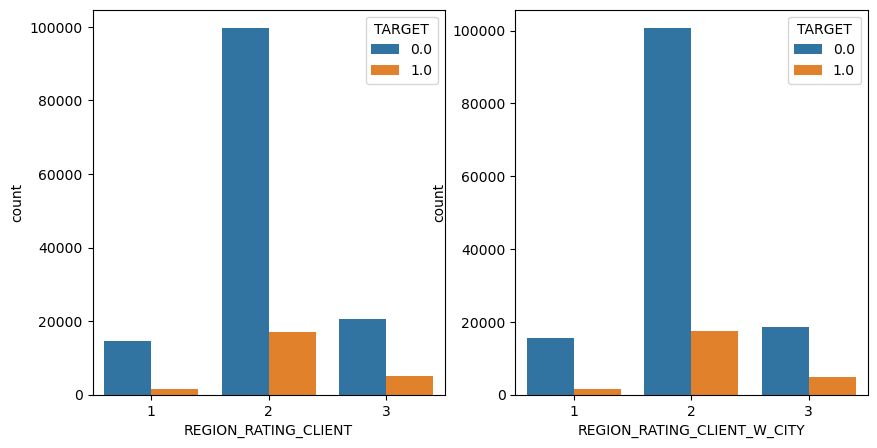

Correlation: 0.95


In [71]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.countplot(data=data, x='REGION_RATING_CLIENT', hue='TARGET', ax=ax[0])
sns.countplot(data=data, x='REGION_RATING_CLIENT_W_CITY', hue='TARGET', ax=ax[1])
plt.xticks()
plt.show()

print('Correlation:',round(data['REGION_RATING_CLIENT_W_CITY'].corr(data['REGION_RATING_CLIENT']),2))

In [72]:
temp=['REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','LIVE_CITY_NOT_WORK_CITY']

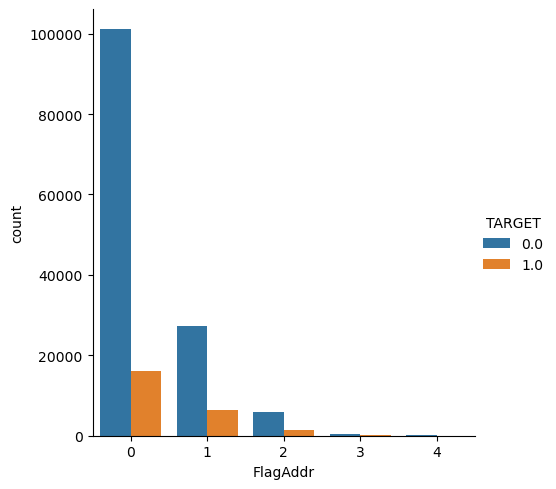

In [73]:
featsum(temp,'FlagAddr')

Observations:
 - REGION_RATING_CLIENT and REGION_RATING_CLIENT_W_CITY are very correlated, and most observations are rated 2
 - Concerning matching addresses, most customers registered their addresses accurately, summing up to 0 flags.

Decisions:
 - KEEP: REGION_RATING_CLIENT
 - DROP: REGION_RATING_CLIENT_W_CITY
 - TRANSFORM: 'REG-' and 'LIVE-' - Sum to account for the address matching provided by the client

In [74]:
# Create new column: FLAG_ADDR
list_col_new_flagAddr = ['REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','LIVE_CITY_NOT_WORK_CITY']

# Columns to be dropped
list_col_drop.extend(['REGION_RATING_CLIENT_W_CITY'])

In [75]:
data[['REGION_POPULATION_RELATIVE']].describe()

,REGION_POPULATION_RELATIVE
count,158791.000000
mean,0.020743
std,0.013718
min,0.000290
25%,0.010006
50%,0.018850
75%,0.028663
max,0.072508


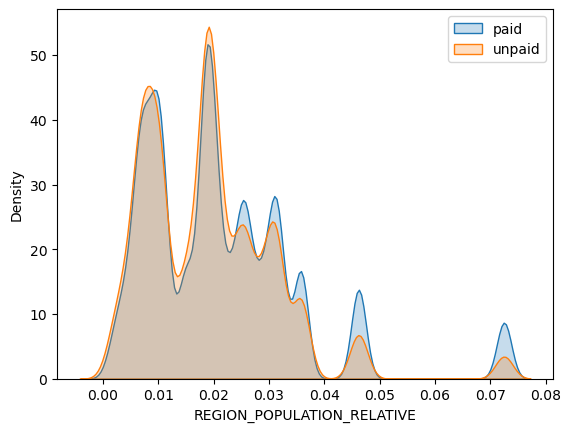

In [76]:
sns.kdeplot(paid['REGION_POPULATION_RELATIVE'],cmap="Blues",fill=True, label='paid')
sns.kdeplot(unpaid['REGION_POPULATION_RELATIVE'],cmap="Reds",fill=True, label='unpaid')
plt.legend()
plt.show()

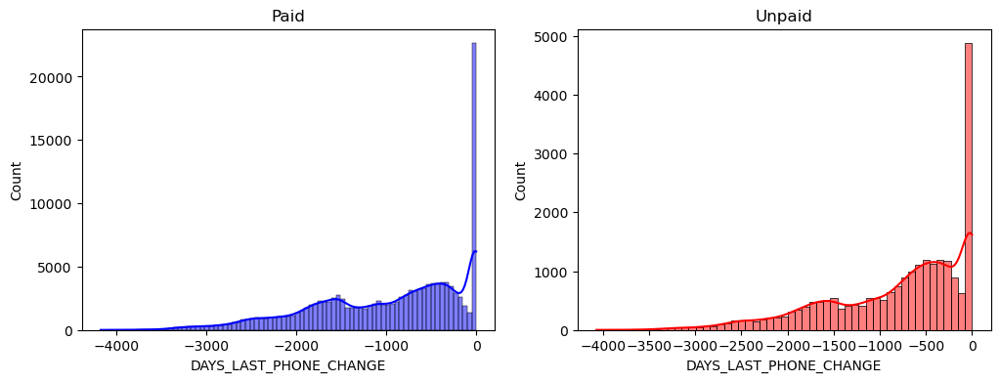

In [77]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
sns.histplot(data=paid['DAYS_LAST_PHONE_CHANGE'], kde=True, color='blue', ax=ax[0])
ax[0].set_title('Paid')
sns.histplot(data=unpaid['DAYS_LAST_PHONE_CHANGE'], kde=True, color='red', ax=ax[1])
ax[1].set_title('Unpaid')
plt.show()

In [78]:
data[['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']].describe()

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE
count,158293.000000,158293.000000,158293.000000,158293.000000
mean,1.427871,0.147871,1.410808,0.103005
std,2.470974,0.457571,2.448515,0.369943
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,2.000000,0.000000,2.000000,0.000000
max,348.000000,34.000000,344.000000,24.000000


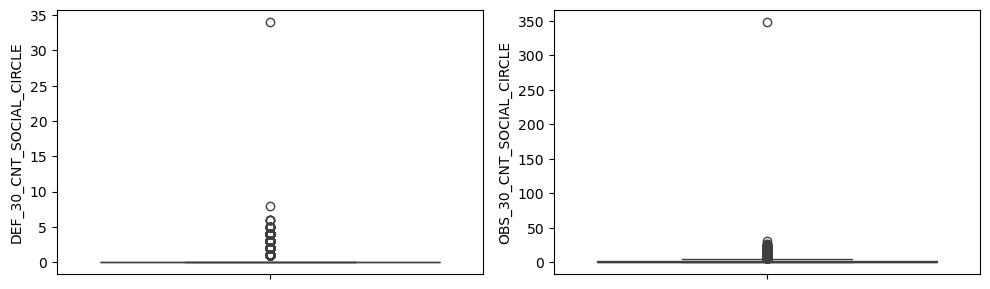

In [79]:
plotdist(data, 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE')

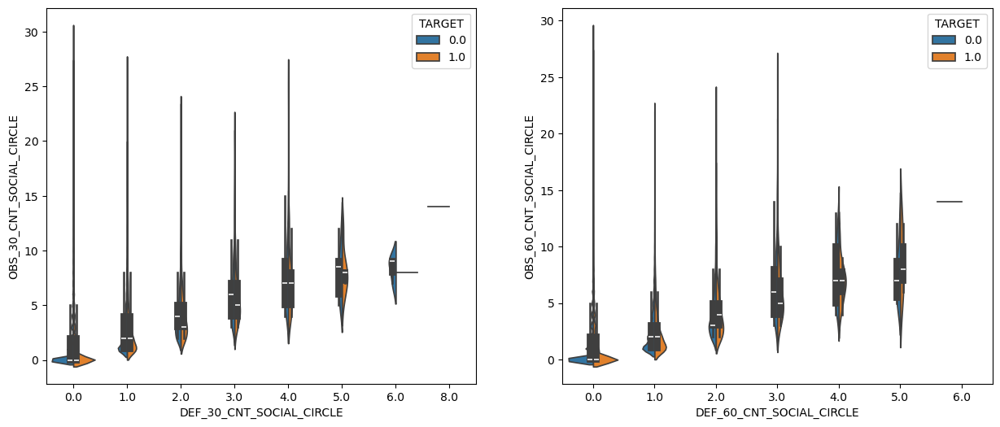

In [80]:
fig, ax = plt.subplots(1,2, figsize=(15,6))
sns.violinplot(data=data[(data.OBS_30_CNT_SOCIAL_CIRCLE<348)&(data.OBS_60_CNT_SOCIAL_CIRCLE<344)], x="DEF_30_CNT_SOCIAL_CIRCLE", y="OBS_30_CNT_SOCIAL_CIRCLE", hue="TARGET", split=True, ax=ax[0])
sns.violinplot(data=data[(data.OBS_30_CNT_SOCIAL_CIRCLE<348)&(data.OBS_60_CNT_SOCIAL_CIRCLE<344)], x="DEF_60_CNT_SOCIAL_CIRCLE", y="OBS_60_CNT_SOCIAL_CIRCLE", hue="TARGET", split=True, ax=ax[1])
plt.show()

Observations:
 - The density plot of REGION_POPULATION_RELATIVE shows a similar probability distribution in less populated regions, with the probability of encountering people who paid their loans growing, relative to those who defaulted, as the population increases;
 - The days since last phone change show the expected behaviour, with most customers changing their phone every 2-3 years. Most importantly, the pattern is similar between both paid and defaulted loans;
 - The violin plots show us the distribution is pretty similar for both paid and defaulted loans concerning the client's social surroudings defaulting or missing payments either on 30 or 60 days past due.

Decisions:
 - KEEP: REGION_POPULATION_RELATIVE
 - DROP: OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE ,OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE

In [81]:
# Columns to be dropped
list_col_drop.extend(['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE'])

### Leakage Features

FLAG_CONT_MOBILE - Was mobile phone reachable (1=YES, 0=NO)

MISSED - Over the loan how many times the client missed a payment

RECOVERED - Proportion of loan recovered in the case that a default occurred

In [82]:
# Columns to be dropped
list_col_drop.extend(['FLAG_CONT_MOBILE','MISSED','RECOVERED'])

In [83]:
list_col_drop

['SK_ID_CURR',
 'AMT_GOODS_PRICE',
 'CNT_CHILDREN',
 'REG_REGION_NOT_WORK_REGION',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'OCCUPATION_TYPE',
 'NAME_INCOME_TYPE',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'NAME_TYPE_SUITE',
 'REGION_RATING_CLIENT_W_CITY',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_CONT_MOBILE',
 'MISSED',
 'RECOVERED']

# Feature Engineering

TRANSFORM:
- list_col_new_asset # Create new column: ASSETS
- list_col_new_annuity # Create new column: ANNUITY_PERCENT_INCOME
- list_col_new_credit # Create new column: CREDIT_PERCENT_INCOME
- list_col_new_car # Substitute the NaNs with 0, for people who don't own a car
- list_col_new_house # Create new column: HOUSING_INFO 0 - no info, 1 - some info, 2 - has info
- list_col_new_income # Transform the income column for income bands
- list_col_new_daysemp # Transform the employment column (convert anomaly + convert to years)
- list_col_new_age # Transform the age column (convert to years)
- list_col_new_flagCont # Create new column : FLAG_CONTACTS (sum)
- list_col_new_flagAddr # Create new column: FLAG_ADDR (sum)

CATEGORICAL:
- NAME_CONTRACT_TYPE
- NAME_FAMILY_STATUS
- NAME_HOUSING_TYPE
- ORGANIZATION_TYPE
- CODE_GENDER
- NAME_EDUCATION_TYPE

## Transformations

In [84]:
# CREATE NEW COLUMN : 0 - none, 1 - with car no realty, 2 - no car with realty, 3 - with car with realty
list_col_new_asset

['FLAG_OWN_CAR', 'FLAG_OWN_REALTY']

In [85]:
def create_asset(data):
    data['FLAG_ASSET'] = np.nan
    filter_0 = (data.FLAG_OWN_CAR=='N')&(data.FLAG_OWN_REALTY=='N')
    filter_1 = (data.FLAG_OWN_CAR=='Y')&(data.FLAG_OWN_REALTY=='N')
    filter_2 = (data.FLAG_OWN_CAR=='N')&(data.FLAG_OWN_REALTY=='Y')
    filter_3 = (data.FLAG_OWN_CAR=='Y')&(data.FLAG_OWN_REALTY=='Y')

    data.loc[filter_0, 'FLAG_ASSET'] = 0
    data.loc[filter_1, 'FLAG_ASSET'] = 1
    data.loc[filter_2, 'FLAG_ASSET'] = 2
    data.loc[filter_3, 'FLAG_ASSET'] = 3

    return data

create_asset(data)
data[['FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_ASSET']].head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_ASSET
0,Y,Y,3.0
1,N,Y,2.0
2,N,Y,2.0
3,N,Y,2.0
4,Y,Y,3.0


In [86]:
data['FLAG_ASSET'].unique()

array([3., 2., 0., 1.])

In [87]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_asset)

In [88]:
# Create new column : ANNUITY_PERCENT_INCOME
list_col_new_annuity

['AMT_ANNUITY', 'AMT_INCOME_TOTAL']

In [89]:
def create_percentage(df, col1, col2, newcol):
    df[newcol] = round((df[col1]/df[col2])*100,2)
    df[newcol] = df[newcol].fillna(0)
    return df

create_percentage(data,'AMT_ANNUITY','AMT_INCOME_TOTAL','ANNUITY_PERCENT_INCOME')
data[['AMT_INCOME_TOTAL','AMT_ANNUITY','ANNUITY_PERCENT_INCOME']].head()

,AMT_INCOME_TOTAL,AMT_ANNUITY,ANNUITY_PERCENT_INCOME
0,112500.0,33025.5,29.36
1,162000.0,13500.0,8.33
2,157500.0,49824.0,31.63
3,121500.0,30303.0,24.94
4,135000.0,6750.0,5.00


In [90]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(['AMT_ANNUITY'])

In [91]:
# Create new column : CREDIT_PERCENT_INCOME
list_col_new_credit

['AMT_CREDIT', 'AMT_INCOME_TOTAL']

In [92]:
create_percentage(data,'AMT_CREDIT','AMT_INCOME_TOTAL','CREDIT_PERCENT_INCOME')
data[['AMT_INCOME_TOTAL','AMT_CREDIT','CREDIT_PERCENT_INCOME']].head()

,AMT_INCOME_TOTAL,AMT_CREDIT,CREDIT_PERCENT_INCOME
0,112500.0,1125000.0,1000.00
1,162000.0,270000.0,166.67
2,157500.0,580500.0,368.57
3,121500.0,280170.0,230.59
4,135000.0,135000.0,100.00


In [93]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(['AMT_CREDIT'])

In [94]:
# Substitute the NaNs with 0, for people who don't own a car
list_col_new_car

['OWN_CAR_AGE']

In [95]:
data[list_col_new_car] = data[list_col_new_car].fillna(0)
data[list_col_new_car].head()

,OWN_CAR_AGE
0,8.0
1,0.0
2,0.0
3,0.0
4,7.0


In [96]:
data['OWN_CAR_AGE'].isnull().sum()

0

In [97]:
# Create new column: HOUSING_INFO 0 - no info, 1 - some info, 2 - has info
list_col_new_house

Index(['APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG',
       'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE',
       'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE',
       'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI',
       'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI',
       'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_M

In [98]:
data['HOUSING_INFO'] = 0 # no info
data.loc[(data[building_columns].isnull().sum(axis=1) > 20) & (data[building_columns].isnull().sum(axis=1) < 45), 'HOUSING_INFO'] = 1 # some info
data.loc[data[building_columns].isnull().sum(axis=1) < 20, 'HOUSING_INFO'] = 2 # has info
data[['HOUSING_INFO']].head()

,HOUSING_INFO
0,0
1,1
2,0
3,0
4,0


In [99]:
data['HOUSING_INFO'].unique()

array([0, 1, 2], dtype=int64)

In [100]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(building_columns)

In [101]:
# Transform the income column - create income bands
list_col_new_income

['AMT_INCOME_TOTAL']

In [102]:
def create_income_band(data):
    data.loc[(data.AMT_INCOME_TOTAL < 30000),'INCOME_BAND'] = 1
    data.loc[(data.AMT_INCOME_TOTAL >= 30000)&(data.AMT_INCOME_TOTAL < 65000),'INCOME_BAND'] = 2
    data.loc[(data.AMT_INCOME_TOTAL >= 65000)&(data.AMT_INCOME_TOTAL < 95000),'INCOME_BAND'] = 3
    data.loc[(data.AMT_INCOME_TOTAL >= 95000)&(data.AMT_INCOME_TOTAL < 130000),'INCOME_BAND'] = 4
    data.loc[(data.AMT_INCOME_TOTAL >= 130000)&(data.AMT_INCOME_TOTAL < 160000),'INCOME_BAND'] = 5
    data.loc[(data.AMT_INCOME_TOTAL >= 160000)&(data.AMT_INCOME_TOTAL < 190000),'INCOME_BAND'] = 6
    data.loc[(data.AMT_INCOME_TOTAL >= 190000)&(data.AMT_INCOME_TOTAL < 220000),'INCOME_BAND'] = 7
    data.loc[(data.AMT_INCOME_TOTAL >= 220000)&(data.AMT_INCOME_TOTAL < 275000),'INCOME_BAND'] = 8
    data.loc[(data.AMT_INCOME_TOTAL >= 275000)&(data.AMT_INCOME_TOTAL < 325000),'INCOME_BAND'] = 9
    data.loc[(data.AMT_INCOME_TOTAL >= 325000),'INCOME_BAND'] = 10
    return data

create_income_band(data)
data[['INCOME_BAND']].head()

,INCOME_BAND
0,4.0
1,6.0
2,5.0
3,4.0
4,5.0


In [103]:
data['INCOME_BAND'].unique()

array([ 4.,  6.,  5.,  3.,  9.,  8., 10.,  2.,  7.,  1.])

In [104]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_income)

In [105]:
# Transform the employment column
list_col_new_daysemp

['DAYS_EMPLOYED']

In [106]:
# Before conversion
print('Train set :',len(data[data['DAYS_EMPLOYED']==365243]))

Train set : 27885


Before conversion, there were 27885 observations with the days employed anomaly

In [107]:
data[list_col_new_daysemp] = data[list_col_new_daysemp].replace(365243, -24455)

# After conversion
print('Train set :',len(data[data['DAYS_EMPLOYED']==365243]))

Train set : 0


In [108]:
data['YEARS_EMPLOYED'] = round(np.abs(data[list_col_new_daysemp]/365))
data[['YEARS_EMPLOYED']].head()

,YEARS_EMPLOYED
0,2.0
1,2.0
2,67.0
3,5.0
4,2.0


In [109]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_daysemp)

In [110]:
# Transform the age column
list_col_new_age

['DAYS_BIRTH']

In [111]:
data['AGE'] = round(np.abs(data[list_col_new_age]/365))
data[['AGE']].head()

,AGE
0,40.0
1,23.0
2,65.0
3,26.0
4,22.0


In [112]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_age)

In [113]:
# Create new column : FLAG_CONTACTS (sum)
list_col_new_flagCont

['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL']

In [114]:
def create_sum_cols(df, cols, newcol):
    df[newcol] = np.nan
    sum_value = df[cols].sum(axis=1)
    df[newcol] = sum_value
    return df

create_sum_cols(data, list_col_new_flagCont, 'FLAG_CONTACTS')
data[['FLAG_CONTACTS']].head()

,FLAG_CONTACTS
0,2
1,2
2,1
3,2
4,3


In [115]:
data['FLAG_CONTACTS'].unique()

array([2, 1, 3, 4, 5], dtype=int64)

In [116]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_flagCont)

In [117]:
# Create new column: FLAG_ADDR (sum)
list_col_new_flagAddr

['REG_REGION_NOT_LIVE_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'LIVE_CITY_NOT_WORK_CITY']

In [118]:
create_sum_cols(data, list_col_new_flagAddr, 'FLAG_ADDRESS')
data[['FLAG_ADDRESS']].head()

,FLAG_ADDRESS
0,0
1,1
2,0
3,1
4,0


In [119]:
data['FLAG_ADDRESS'].unique()

array([0, 1, 2, 4, 3], dtype=int64)

In [120]:
# Since we have our feature, we can remove the columns used to construct it
list_col_drop.extend(list_col_new_flagAddr)

In [121]:
list_col_drop

['SK_ID_CURR',
 'AMT_GOODS_PRICE',
 'CNT_CHILDREN',
 'REG_REGION_NOT_WORK_REGION',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'OCCUPATION_TYPE',
 'NAME_INCOME_TYPE',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'NAME_TYPE_SUITE',
 'REGION_RATING_CLIENT_W_CITY',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_CONT_MOBILE',
 'MISSED',
 'RECOVERED',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'AMT_ANNUITY',
 'AMT_CREDIT',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',

In [122]:
# Updated Data
data.drop(list_col_drop, axis=1, inplace=True)

data

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,...,ORGANIZATION_TYPE,FLAG_ASSET,ANNUITY_PERCENT_INCOME,CREDIT_PERCENT_INCOME,HOUSING_INFO,INCOME_BAND,YEARS_EMPLOYED,AGE,FLAG_CONTACTS,FLAG_ADDRESS
0,0.0,Cash loans,F,Higher education,Married,House / apartment,0.014520,8.0,2.0,2,...,Industry: type 11,3.0,29.36,1000.00,0,4.0,2.0,40.0,2,0
1,0.0,Revolving loans,M,Higher education,Married,House / apartment,0.035792,0.0,3.0,2,...,Trade: type 3,2.0,8.33,166.67,1,6.0,2.0,23.0,2,1
2,0.0,Cash loans,F,Secondary / secondary special,Married,House / apartment,0.018801,0.0,2.0,2,...,XNA,2.0,31.63,368.57,0,5.0,67.0,65.0,1,0
3,0.0,Cash loans,F,Incomplete higher,Married,House / apartment,0.009334,0.0,3.0,2,...,Transport: type 4,2.0,24.94,230.59,0,4.0,5.0,26.0,2,1
4,0.0,Revolving loans,M,Secondary / secondary special,Civil marriage,House / apartment,0.010006,7.0,2.0,2,...,Trade: type 2,3.0,5.00,100.00,0,5.0,2.0,22.0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158786,0.0,Cash loans,F,Higher education,Widow,Municipal apartment,0.018634,0.0,1.0,2,...,XNA,0.0,8.77,298.00,2,8.0,67.0,59.0,2,0
158787,0.0,Cash loans,F,Higher education,Married,House / apartment,0.010276,0.0,2.0,2,...,XNA,2.0,27.61,231.68,2,4.0,67.0,66.0,1,0
158788,0.0,Cash loans,F,Secondary / secondary special,Married,House / apartment,0.018029,30.0,2.0,3,...,School,3.0,12.49,293.39,0,7.0,1.0,47.0,3,0
158789,1.0,Cash loans,F,Higher education,Civil marriage,With parents,0.025164,0.0,2.0,2,...,Self-employed,0.0,13.91,284.48,2,6.0,2.0,24.0,2,0


## Categorical Features

In [123]:
numerical_features = data.select_dtypes(include=['int64','float64']).columns.tolist()

categorical_features = ['NAME_CONTRACT_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'CODE_GENDER', 'NAME_EDUCATION_TYPE']
                        #     2 types                5 types              6 types           3 types            5 types
categorical_features_v2 = ['ORGANIZATION_TYPE'] # Use infrequent grouping for reduced dimensionality increase
                               # 59 types
# Initialize the one-hot encoders
encoder = OneHotEncoder(handle_unknown='infrequent_if_exist', sparse_output=False, drop = "first")
encoder_v2 = OneHotEncoder(min_frequency=0.025, handle_unknown='infrequent_if_exist', sparse_output=False, drop = "first")

# Fit and transform the categorical columns
encoded_array = encoder.fit_transform(data[categorical_features])
encoded_array_v2 = encoder_v2.fit_transform(data[categorical_features_v2])

# Create a DataFrame for the encoded columns
encoded_df = pd.DataFrame(encoded_array, columns=encoder.get_feature_names_out(categorical_features))
encoded_df_v2 = pd.DataFrame(encoded_array_v2, columns=encoder_v2.get_feature_names_out(categorical_features_v2))

# Concatenate the original DataFrame with the encoded columns
temp_df = pd.concat([data[numerical_features], encoded_df], axis=1)
final_df = pd.concat([temp_df, encoded_df_v2], axis=1)

final_df.head()

,TARGET,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REG_CITY_NOT_WORK_CITY,FLAG_ASSET,ANNUITY_PERCENT_INCOME,CREDIT_PERCENT_INCOME,HOUSING_INFO,...,NAME_EDUCATION_TYPE_Secondary / secondary special,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_XNA,ORGANIZATION_TYPE_infrequent_sklearn
0,0.0,0.014520,8.0,2.0,2,0,3.0,29.36,1000.00,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.035792,0.0,3.0,2,1,2.0,8.33,166.67,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.018801,0.0,2.0,2,0,2.0,31.63,368.57,0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.009334,0.0,3.0,2,1,2.0,24.94,230.59,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.010006,7.0,2.0,2,0,3.0,5.00,100.00,0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [124]:
# Get a concise summary of the dataset
final_df.info()

# Get basic statistics of numerical columns
final_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158791 entries, 0 to 158790
Data columns (total 40 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   TARGET                                             158791 non-null  float64
 1   REGION_POPULATION_RELATIVE                         158791 non-null  float64
 2   OWN_CAR_AGE                                        158791 non-null  float64
 3   CNT_FAM_MEMBERS                                    158791 non-null  float64
 4   REGION_RATING_CLIENT                               158791 non-null  int64  
 5   REG_CITY_NOT_WORK_CITY                             158791 non-null  int64  
 6   FLAG_ASSET                                         158791 non-null  float64
 7   ANNUITY_PERCENT_INCOME                             158791 non-null  float64
 8   CREDIT_PERCENT_INCOME                              158791 non-null  float6

,TARGET,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REG_CITY_NOT_WORK_CITY,FLAG_ASSET,ANNUITY_PERCENT_INCOME,CREDIT_PERCENT_INCOME,HOUSING_INFO,...,NAME_EDUCATION_TYPE_Secondary / secondary special,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_XNA,ORGANIZATION_TYPE_infrequent_sklearn
count,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,...,158791.00000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000,158791.000000
mean,0.149996,0.020743,4.098727,2.158227,2.060117,0.235819,1.722667,18.133047,395.290294,0.932836,...,0.71562,0.224465,0.033761,0.036022,0.054065,0.028434,0.126550,0.025889,0.175608,0.260789
std,0.357069,0.013718,9.013602,0.915387,0.510561,0.424511,1.037124,9.469029,267.961644,0.953800,...,0.45112,0.417231,0.180615,0.186346,0.226146,0.166209,0.332469,0.158806,0.380488,0.439067
min,0.000000,0.000290,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.480000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.010006,0.000000,2.000000,2.000000,0.000000,1.000000,11.520000,202.720000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.018850,0.000000,2.000000,2.000000,0.000000,2.000000,16.320000,326.920000,1.000000,...,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.028663,5.000000,3.000000,2.000000,0.000000,2.000000,22.930000,513.550000,2.000000,...,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,0.072508,91.000000,20.000000,3.000000,1.000000,3.000000,187.600000,8473.680000,2.000000,...,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Classification Models to Predict Payment Dificulties

## Splitting the Data

In [139]:
# Features (X) and Target (y) variables
X = final_df.drop('TARGET', axis=1)
y = final_df['TARGET']

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y) #By specifying stratify=y, where y is the target variable, train_test_split() will preserve the percentage of samples for each class in both the training and testing subsets

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((142911, 39), (15880, 39), (142911,), (15880,))

Cross validation is implemented inside the grid-searches, thus there is no need for manual validation splitting

### Sample Split

Might be useful for computational limitations on certain models

In [140]:
# Sample plit
_, X_sample, _, y_sample = train_test_split(X_train, y_train, test_size=0.1, random_state=42, stratify=y_train)

### Scale

Certain models work best with scaled data. It is important that the scaler is trained on the training data and then applied to both training and test data, avoiding leakage

In [141]:
# Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_train.columns)

## Model Application

We will be testing many classification models explored in class. For each model, the Grid Search method will be employed, directly fitting training data, and optimizing for a given set of parameters and a defined scoring function. From this, the best estimator of each model will be returned and evaluated on the test set. Every grid search will include a 5-Fold Cross Validation process that divides the training data into five different train and validation splits, and runs the model to compare results.

In [196]:
# Define function to assess model performance, showing classification report and ROC-AUC curve
def evaluate_classification_model(model, X_test, y_test, class_labels=['No Default Risk', 'Default Risk']):
    """
    Evaluate a classification model and display various metrics.

    Parameters:
    - model: The trained machine learning model
    - X_test: Test set features
    - y_test: True labels for the test set
    - class_labels: List of labels for the classification task

    Returns:
    None
    """
    # Predictions for the test set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=class_labels))

    # Log Loss
    log_loss_score = log_loss(y_test, y_pred_proba)
    print(f"Log Loss: {log_loss_score:.4f}")

    # Recall Score
    recall = recall_score(y_test, y_pred)
    print(f"Recall Score: {recall:.4f}")

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='best')
    plt.show()

    print(f"Area Under ROC (AUC): {roc_auc:.4f}")


## F1 Score

Let's first try to optimize each model regarding the F1 score - the measure of relative contribution of precision and recall

### Logistic Regression - Scaled

The Logistic Model serves the purpose of binary classification, estimating the probability that a given instance belongs to a particular category. In the context of home credit default, logistic regression creates a linear decision boundary, that serves to distinguish between borrowers who are likely to default on their home loans (one class) and those who are likely to repay their loans on time (the other class).

In essence, the code below sets up an exhaustive search for the best hyperparameters, aiming to find the configuration that best balances precision and recall.

The Logistic Regression is one of the models for which scaled data is recommended, avoiding features expressed in larger scale dominating over features in smaller scales

In [197]:
# Define the hyperparameter grid
param_grid_lr = [
    {'solver': ['lbfgs'],
     'penalty': ['l2'],
     'C': [0.1, 1, 10],
     'class_weight': ['balanced']},
    {'solver': ['lbfgs'],
     'penalty': [None],
     'class_weight': ['balanced']},
    {'solver': ['liblinear'],
     'penalty': ['l1', 'l2'],
     'C': [0.1, 1, 10],
     'class_weight': ['balanced']}]

grid_search_lr_f1 = GridSearchCV(LogisticRegression(random_state=42, max_iter=350),  
                            param_grid_lr,
                            scoring='f1',  
                            cv=5,  
                            verbose=1,  
                            n_jobs=-1)

grid_search_lr_f1.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=350, random_state=42),
             n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l2'], 'solver': ['lbfgs']},
                         {'class_weight': ['balanced'], 'penalty': [None],
                          'solver': ['lbfgs']},
                         {'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l1', 'l2'], 'solver': ['liblinear']}],
             scoring='f1', verbose=1)

In [222]:
grid_search_lr_f1.best_params_

{'C': 10, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'}

C: 10 Inverse regularization strength; higher value indicates less regularization which suggests the model benefits from fitting more closely to the training data without overfitting too much. This suggests that the features in the dataset are quite informative for distinguishing between defaulters and non-defaulters.

class_weight: 'balanced'; Automatically adjusts weights inversely proportional to class frequencies to handle class imbalance in credit default scenarios where defaults are less common. Since, defaults are typically less frequent than non-defaults, so this parameter helps in giving more weight to the minority class (defaults), aiming to reduce bias towards predicting the majority class.

penalty: 'l2' regularization; adds a penalty equal to the square of the magnitude of coefficients to control model complexity, effective here for preventing overfitting while maintaining all features. Choosing 'l2' (Ridge) penalty over 'l1' or no penalty suggests that all features in the dataset might be relevant to some degree for predicting default.

solver: 'lbfgs' Lbfgs algorithm; efficient for large datasets and works well with 'l2' penalty, suggesting good performance with the given dataset size and structure. The use of L2 regularization with a relatively high C value indicates a model that leverages the complexity of the dataset without overfitting.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.61      0.73     13498
   Default Risk       0.22      0.63      0.33      2382

       accuracy                           0.61     15880
      macro avg       0.56      0.62      0.53     15880
   weighted avg       0.80      0.61      0.67     15880

Log Loss: 0.6541
Recall Score: 0.6327


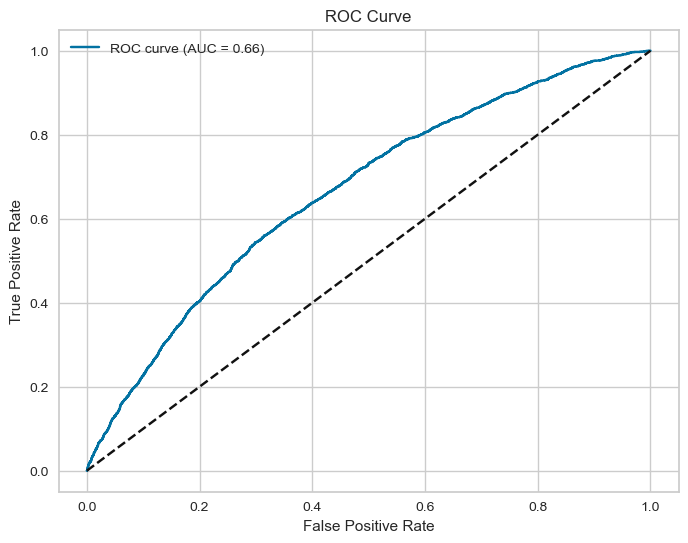

Area Under ROC (AUC): 0.6642


In [223]:
lr_model_f1_scaled = grid_search_lr_f1.best_estimator_

evaluate_classification_model(lr_model_f1_scaled, X_test_scaled, y_test)

No Default Risk: Precision is high indicating that when the model predicts no default, it's correct 90% of the time. However, recall is lower at 0.61, meaning it misses a significant portion of true non-defaults. The F1-score of 0.73 balances these two metrics.

Default Risk: Precision is much lower, suggesting many false positives (predicting default when there isn't one). However, recall is relatively better  at 0.63, indicating the model is slightly better at catching actual defaults. The F1-score is 0.33, showing room for improvement in precision-recall trade-off.

An ROC of 0.66 suggests we are able to distinguish between classes, but there's room to increase predictive accuracy.

### Logistic Regression - Not Scaled

Despite scaled data being expected to work best, let's run the model without it to see how it affects our results

In [224]:
grid_search_lr_f1.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=350, random_state=42),
             n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l2'], 'solver': ['lbfgs']},
                         {'class_weight': ['balanced'], 'penalty': [None],
                          'solver': ['lbfgs']},
                         {'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l1', 'l2'], 'solver': ['liblinear']}],
             scoring='f1', verbose=1)

In [225]:
grid_search_lr_f1.best_params_

{'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}

Solver: the choice of 'liblinear' for unscaled data reflects its robustness to feature scaling issues and efficiency with smaller datasets, while 'lbfgs' might be preferred for scaled data due to its efficiency with well-scaled features. This suggests that not all features are equally important for distinguishing between defaulters and non-defaulters.

Penalty: 'l1' is chosen for unscaled data to perform feature selection, dealing with the potential for some features to dominate due to scale differences. Conversely,'l2' is used for scaled data where uniform regularization across features is more appropriate.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.61      0.72     13498
   Default Risk       0.22      0.63      0.33      2382

       accuracy                           0.61     15880
      macro avg       0.56      0.62      0.53     15880
   weighted avg       0.80      0.61      0.66     15880

Log Loss: 0.6541
Recall Score: 0.6297


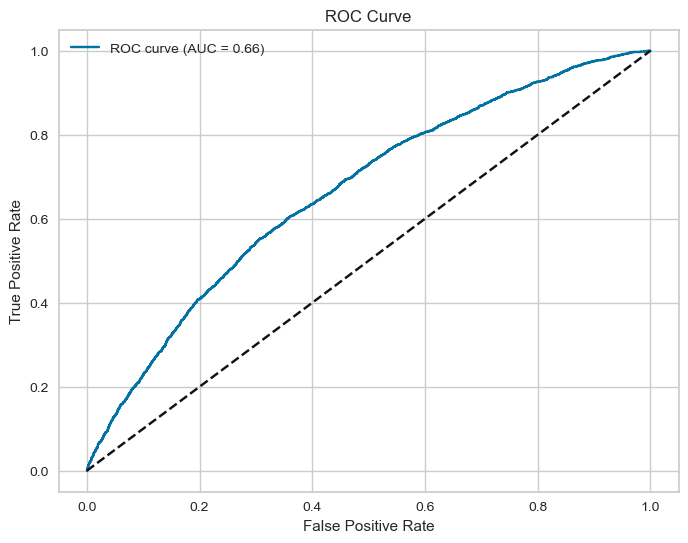

Area Under ROC (AUC): 0.6643


In [226]:
lr_model_f1_notscaled = grid_search_lr_f1.best_estimator_

evaluate_classification_model(lr_model_f1_notscaled, X_test, y_test)

No Default Risk: High precision indicates that when the model predicts 'No Default Risk', it's correct 90% of the time. The F1-score of 0.72 shows a reasonable performance for this class.

Default Risk: Very low precision means that when the model predicts 'Default Risk', only 22% of those predictions are correct, highlighting a high rate of false positives. The model identifies 63% of the actual defaulters, which is relatively good considering the class imbalance. The F1-score is low, indicating a poor balance between precision and recall for this class.

With an AUC score of 0.66, the model shows a similar ROC curve.

### Quadratic Discriminant Analysis

QDA is a classification technique that, unlike LDA, assumes each class has its own covariance matrix, being particularly useful when the classes have different variances or when the relationship between features and the class is non-linear.

QDA allows each class to have its unique covariance matrix. This flexibility can capture the different risk profiles associated with defaulters versus non-defaulters, which might not be linear. The creation of a quadratic decision boundary, can better fit the complex, non-linear patterns often found in financial data.

In [313]:
# Define the hyperparameter grid:
param_grid_qda = {
    'reg_param': [0.0, 0.001, 0.01, 0.1, 0.5, 1.0],
    'priors': [None, [0.85, 0.15], [0.75, 0.25], [0.65, 0.35]]
}

# Initialize GridSearchCV with QDA
grid_search_qda_f1 = GridSearchCV(QuadraticDiscriminantAnalysis(), 
                               param_grid_qda, 
                               scoring='f1',
                               cv=5, 
                               verbose=1, 
                               n_jobs=-1)

# Fit the model
grid_search_qda_f1.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


GridSearchCV(cv=5, estimator=QuadraticDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'priors': [None, [0.85, 0.15], [0.75, 0.25],
                                    [0.65, 0.35]],
                         'reg_param': [0.0, 0.001, 0.01, 0.1, 0.5, 1.0]},
             scoring='f1', verbose=1)

In [314]:
grid_search_qda_f1.best_params_

{'priors': [0.65, 0.35], 'reg_param': 0.5}

Priors [0.65 0.35]: the selected priors indicate that the model assumes there's a 65% probability of a borrower not defaulting and a 35% probability of defaulting. This adjustment from the default equal priors in the dataset reflects an attempt to balance the model's predictions towards a more desired distribution in our context. An acknowledgment of the need to give more weight to the minority class (defaulters) to improve predictions for defaults is critical in credit risk assessment to minimize financial losses from defaults.

Reg_param: 0.5 : a regularization parameter of 0.5 represents a moderate level of regularization. In models like QDA, this parameter helps in regularizing the estimation of the covariance matrix to prevent overfitting.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      0.98      0.91     13498
   Default Risk       0.14      0.01      0.03      2382

       accuracy                           0.84     15880
      macro avg       0.49      0.50      0.47     15880
   weighted avg       0.74      0.84      0.78     15880

Log Loss: 5.5023
Recall Score: 0.0143


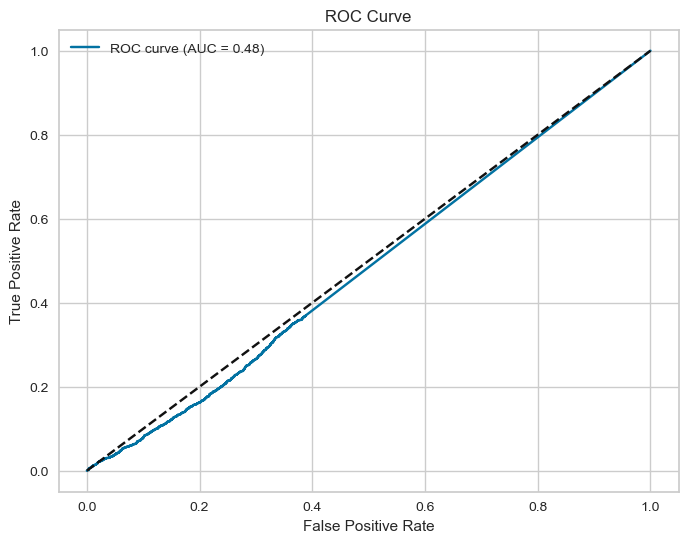

Area Under ROC (AUC): 0.4848


In [315]:
qda_model_f1 = grid_search_qda_f1.best_estimator_

evaluate_classification_model(qda_model_f1, X_test, y_test)

When the model predicts "Default Risk," it is correct only 14% of the time. Which indicates a significant issue with false positives for the minority class.

The model identifies only 1% of actual "Default Risk" cases. This extremely low recall suggests the model fails to detect most cases of the minority class.

F1 Score (0.03): The low "Default Risk" F1 score indicates the model struggles to balance precision and recall for the minority class, with both metrics being poor. The ROC curve lies very close to the diagonal (random guessing line), suggesting that the model does not effectively separate the two classes. The AUC score of 0.48 confirms that the model performs worse than chance. Meaning, it fails to provide meaningful discrimination between classes.

The model will be discared moving forward

### Multinomial Naive Bayes

Multinomial Naive Bayes (MNB) is a probabilistic algorithm that makes use of the Naive Bayes theorem, and is particularly useful for classification tasks involving discrete features. MNB could be used to classify loan applications into 'Default Risk' or 'No Default Risk' based on categorical features.

In [230]:
# Define the hyperparameter grid:
param_grid_mnb = {'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
              'class_prior': [None, [0.8, 0.2], [0.7, 0.3], [0.6, 0.4]]}

grid_search_mnb_f1 = GridSearchCV(MultinomialNB(), 
                              param_grid_mnb, 
                              scoring='f1',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_mnb_f1.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=MultinomialNB(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
                         'class_prior': [None, [0.8, 0.2], [0.7, 0.3],
                                         [0.6, 0.4]]},
             scoring='f1', verbose=1)

In [231]:
grid_search_mnb_f1.best_params_

{'alpha': 5.0, 'class_prior': [0.6, 0.4]}

alpha: 5.0 - smoothing parameter; a higher value like 5.0 indicates a stronger smoothing effect, which helps in reducing overfitting by treating unseen features as if they had been seen 'alpha' times. This choice suggests that the model benefits from a moderate level of smoothing to balance between capturing the nuances of the data.

class_prior: [0.6, 0.4] manually sets class priors; 0.6 for 'No Default Risk' and 0.4 for 'Default Risk'. This adjustment from the default class distribution in the dataset reflects the same attempt to balance the model's predictions towards a more desired distribution, compensating for class imbalance. By setting these priors, the model gives more weight to predicting defaults.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.41      0.57     13498
   Default Risk       0.18      0.72      0.29      2382

       accuracy                           0.46     15880
      macro avg       0.54      0.57      0.43     15880
   weighted avg       0.79      0.46      0.52     15880

Log Loss: 2.5656
Recall Score: 0.7238


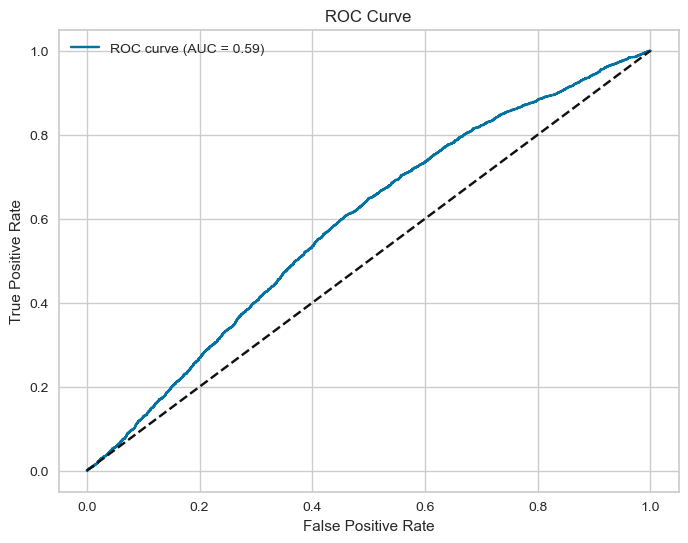

Area Under ROC (AUC): 0.5869


In [232]:
mnb_model_f1 = grid_search_mnb_f1.best_estimator_

evaluate_classification_model(mnb_model_f1, X_test, y_test)

Weighted Average F1-score: 0.52 - Indicates a slightly better performance when considering the imbalance. In the context of home credit default, an F1-score of this level indicates that the model might not be optimally balanced for both identifying defaults and approving non-defaulters correctly.

An AUC close to 0.6 (0.59) suggests the model has slightly better performance than random guessing, which is concerning for practical application in credit risk assessment. In summary, MNB's assumption of feature independence might not capture the complex relationships in credit risk data.

### Complement Naive Bayes

Complement Naive Bayes (CNB) is a variation of the Naive Bayes algorithm specifically designed to address some of the shortcomings of traditional Naive Bayes classifiers, particularly in the contexts where class imbalance is common.

It builds on Multinomial Naive Bayes but modifies the training process to focus on improving the classification of the minority class.

In [233]:
# Define the hyperparameter grid:
param_grid_cnb = {'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
              'class_prior':[None, [0.8, 0.2], [0.7, 0.3], [0.6, 0.4]]}

grid_search_cnb_f1 = GridSearchCV(ComplementNB(), 
                              param_grid_cnb, 
                              scoring='f1',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_cnb_f1.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=ComplementNB(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
                         'class_prior': [None, [0.8, 0.2], [0.7, 0.3],
                                         [0.6, 0.4]]},
             scoring='f1', verbose=1)

In [234]:
grid_search_cnb_f1.best_params_

{'alpha': 1.0, 'class_prior': None}

By looking at the best parameters, we see the model's natural capabilities of dealing with class imbalance, as the optimal class pior weights were set to None. The optimal regularization parameter alpha was set to 1.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.38      0.54     13498
   Default Risk       0.18      0.75      0.29      2382

       accuracy                           0.44     15880
      macro avg       0.54      0.57      0.41     15880
   weighted avg       0.79      0.44      0.50     15880

Log Loss: 2.7490
Recall Score: 0.7536


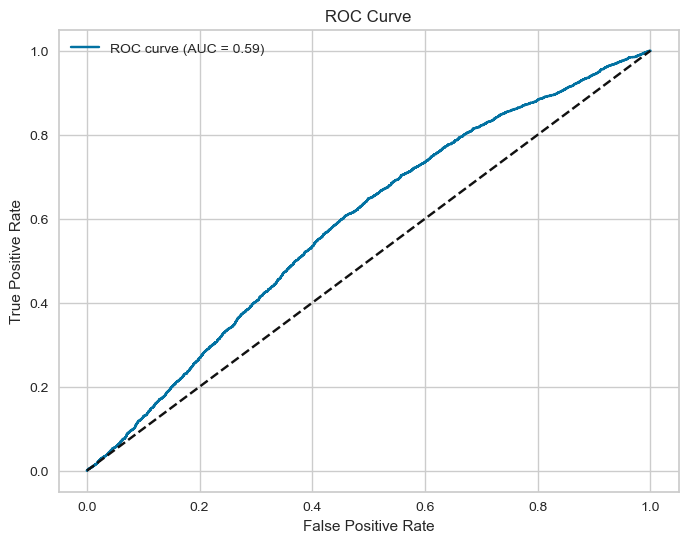

Area Under ROC (AUC): 0.5868


In [235]:
cnb_model_f1 = grid_search_cnb_f1.best_estimator_

evaluate_classification_model(cnb_model_f1, X_test, y_test)

Despite optimized for weighted f1, for which it scored 0.50, the model returned 0.75 recall on the test set. The lower values in other metrics indicate the model might not be appropriate for our problem.

The ROC curve shows a similar shape to previous models, and the AUC was 0.59

### Decision Tree

Widely used for classification tasks, decision trees create an upside-down tree structure, making predictions by recursively splitting the data based on feature values, thus being able to represent non-linearity. The process looks to find optimal splits that keep node purity, assessed by the gini index or entropy.

Given this is a single tree model, it is very prone to overfitting, especially as we go deeper into the tree. As such, we decided to include a pruning mechanism, controlled by 'ccp_alpha', as well as different split and node sizes into our grid search problem.

We also include a 'class_weight' argument to handle data imbalance.

In [236]:
# Define the hyperparameter grid
param_grid_dt = {'criterion': ['gini', 'entropy'],
              'splitter': ['best', 'random'],
              'max_depth': [10, 20, 30], 
              'min_samples_split': [2, 10, 50],
              'min_samples_leaf': [2, 10, 50],
              'class_weight': ['balanced'],
              'ccp_alpha': np.linspace(0, 0.05, 5)}

grid_search_dt_f1 = GridSearchCV(DecisionTreeClassifier(random_state=42), 
                              param_grid_dt, 
                              scoring='f1',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_dt_f1.fit(X_sample, y_sample)

Fitting 5 folds for each of 540 candidates, totalling 2700 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20, 30],
                         'min_samples_leaf': [2, 10, 50],
                         'min_samples_split': [2, 10, 50],
                         'splitter': ['best', 'random']},
             scoring='f1', verbose=1)

In [237]:
grid_search_dt_f1.best_params_

{'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'min_samples_split': 2,
 'splitter': 'random'}

When optimizing for F1-Score, Grid Search returns that the best arguments to reach the highest F1-Score in these settings are to use entropy to evaluate the quality of a split, use a maximum of 10 nodes in each tree, split a node on a minimum of 2 samples, not include a pruning mechanism, and randomly split at each node

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.59      0.71     13498
   Default Risk       0.20      0.57      0.30      2382

       accuracy                           0.59     15880
      macro avg       0.54      0.58      0.50     15880
   weighted avg       0.78      0.59      0.65     15880

Log Loss: 0.6741
Recall Score: 0.5722


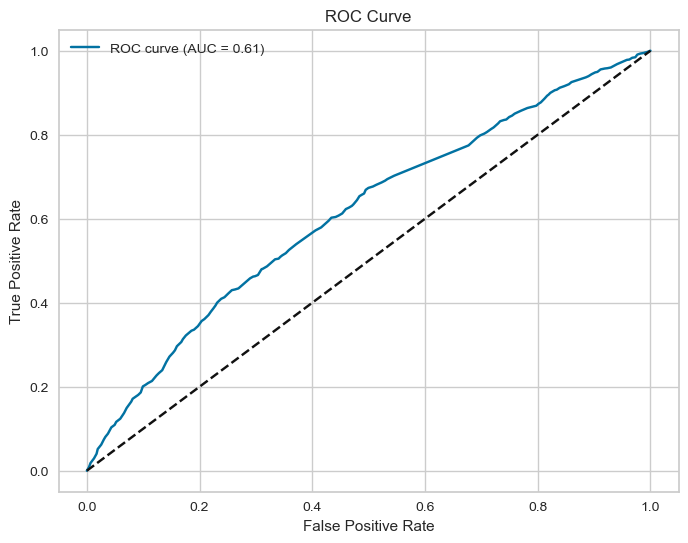

Area Under ROC (AUC): 0.6122


In [238]:
dt_model_f1 = grid_search_dt_f1.best_estimator_

evaluate_classification_model(dt_model_f1, X_test, y_test)

Optimizing for the F1-Score, the Decision Tree model achieved a weighted average F1-Score of 0.65. As for recall, we see both classes having similar results, capturing close to 60% of actual class instances in the test set. Nonetheless, we see a pretty poor performance in other metrics regarding Default predictions.

The ROC Curve, representing the trade-off between the True Positive Rate and False Positive Rate at different classification thresholds, returns an Area Under the Curve of 0.61, summarizing performance across all thresholds.

### Random Forest (Bagging Method)

To get past the Decision Tree limitations, bagging methods like Random Forste can be applied, where the model grows a pre-determined number of trees on distinct bootstrap samples (thus each tree learns slightly different information) and then combining the trees. This helps reduce variance and overfitting.

Given computational intensity, fewer arguments were passed for this grid search.

In [239]:
# Define the hyperparameter grid
param_grid_rf = {'n_estimators': [10, 20],
              'criterion': ['gini', 'entropy'],
              'max_depth': [5, 10],
              'min_samples_split': [2, 10],
              'min_samples_leaf': [2, 10],
              'class_weight': ['balanced', 'balanced_subsample'],
              'ccp_alpha': np.linspace(0, 0.05, 5)}

# Initialize GridSearchCV
grid_search_rf_f1 = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid_rf,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_rf_f1.fit(X_sample, y_sample)

Fitting 5 folds for each of 320 candidates, totalling 1600 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy'], 'max_depth': [5, 10],
                         'min_samples_leaf': [2, 10],
                         'min_samples_split': [2, 10],
                         'n_estimators': [10, 20]},
             scoring='f1', verbose=1)

In [240]:
grid_search_rf_f1.best_params_

{'ccp_alpha': 0.0,
 'class_weight': 'balanced_subsample',
 'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 2,
 'min_samples_split': 10,
 'n_estimators': 20}

In this setting, the model that offers the best F1-score has no pruning mechanism, uses a balanced subsample class weighting method, which offer the same ability to deal with imbalance but at a sample level, evaluates based on entropy, and has 20 trees.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.66      0.76     13498
   Default Risk       0.23      0.57      0.33      2382

       accuracy                           0.64     15880
      macro avg       0.56      0.62      0.54     15880
   weighted avg       0.80      0.64      0.69     15880

Log Loss: 0.6509
Recall Score: 0.5743


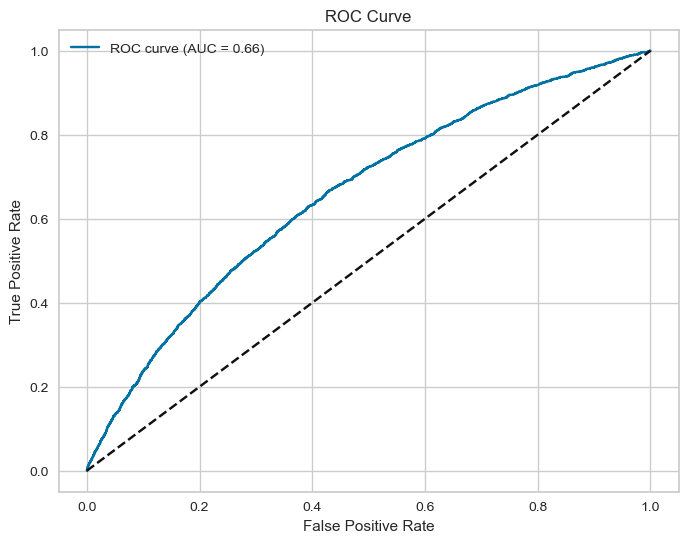

Area Under ROC (AUC): 0.6577


In [241]:
rf_model_f1 = grid_search_rf_f1.best_estimator_

evaluate_classification_model(rf_model_f1, X_test, y_test)

Using the Random Forest, we see a slight improvement in all metrics, reaching a 0.69 weighted f1 score and a recall of 0.57.

The ROC curve shows improvement as it shifted to the left, allowing for more True Positive Rate gain at a lower False Positive Rate Cost, should we want to move the threshold. The area under the curve improved to 0.66

### Gradient Boosting Classifier

Another way to address the Decision Tree's limitations are boosting models.

Gradient Boosting Classifiers are powerful ensemble methods that build a model sequentially by combining multiple decision trees, with each tree attempting to correct the errors made by the previous. These are especially good when seeking high accuracy.

These boosting methods can control overfitting by setting a learning rate that controls the contribution of each tree to the final model.

Given computational limitations, this model was run on a sample and using a small number of estimators.

In [242]:
# Define the hyperparameter grid
param_grid_gb = {'n_estimators': [2, 4],
              'learning_rate': [0.1, 0.2, 0.3],
              'max_depth': [5, 10, 20],
              'subsample': [0.8, 1.0],
              'ccp_alpha': np.linspace(0, 0.05, 5)}

# Initialize GridSearchCV
grid_search_gb_f1 = GridSearchCV(
    GradientBoostingClassifier(random_state=42),
    param_grid_gb,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_gb_f1.fit(X_sample, y_sample)

Fitting 5 folds for each of 180 candidates, totalling 900 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='f1', verbose=1)

In [243]:
grid_search_gb_f1.best_params_

{'ccp_alpha': 0.0,
 'learning_rate': 0.3,
 'max_depth': 20,
 'n_estimators': 4,
 'subsample': 1.0}

Grid search returned that in order to optimize for the F1-Score, the model should not be pruned, the learning rate should be 0.3, it should use 4 estimators, and include all samples for fitting the individual learners.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      0.93      0.89     13498
   Default Risk       0.21      0.10      0.14      2382

       accuracy                           0.81     15880
      macro avg       0.53      0.52      0.51     15880
   weighted avg       0.76      0.81      0.78     15880

Log Loss: 0.4905
Recall Score: 0.1012


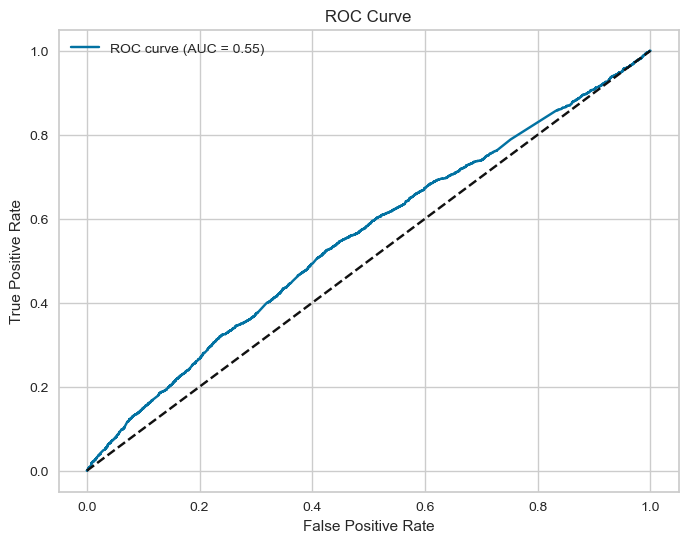

Area Under ROC (AUC): 0.5533


In [244]:
gb_model_f1 = grid_search_gb_f1.best_estimator_

evaluate_classification_model(gb_model_f1, X_test, y_test)

Despite achieving a weighted F1-Score of 0.78 and an expected good accuracy of 0.81, the model fails to achieve the same positive results for the Default predictions. The model lacks by not accounting for class imbalance, and focuses its efforts in performing well for the largest class - No Default Risk.

This results in a weak ROC curve, yielding an AUC of just 0.55

### XGBoost

Extreme Gradient Boost is a specific implementation of Gradient Boosting Trees that incorporates regularization techniques to prevent overfitting. Regularization penalizes complex models, encouraging simpler models that generalize better to unseen data.

The model also had to be run on a sample due to computational limitations.

In [245]:
# Define the hyperparameter grid
param_grid_xgb = {'n_estimators': [50, 100],
              'learning_rate': [0.1, 0.2, 0.3],
              'max_depth': [5, 10, 20],
              'subsample': [0.8, 1.0],
              'gamma': [0.01, 0.025, 0.05]} #Minimum loss reduction required to make a further partition on a leaf node of the tree

# Initialize GridSearchCV
grid_search_xgb_f1 = GridSearchCV(
    xgb.XGBClassifier(random_state=42),
    param_grid_xgb,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_xgb_f1.fit(X_sample, y_sample)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'gamma': [0.01, 0.025, 0.05],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [50, 100],
                         'subsample': [0.8, 1.0]},
             scoring='f1', verbose=1)

In [246]:
grid_search_xgb_f1.best_params_

{'gamma': 0.025,
 'learning_rate': 0.3,
 'max_depth': 10,
 'n_estimators': 100,
 'subsample': 0.8}

On our sample, the parameters that maximize the F1-Score of the model are a total of 100 estimators using an 80% subsample, 0.3 learning rate and 0.025 gamma (loss reduction parameter)

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      0.97      0.91     13498
   Default Risk       0.24      0.06      0.09      2382

       accuracy                           0.83     15880
      macro avg       0.55      0.51      0.50     15880
   weighted avg       0.76      0.83      0.79     15880

Log Loss: 0.5389
Recall Score: 0.0584


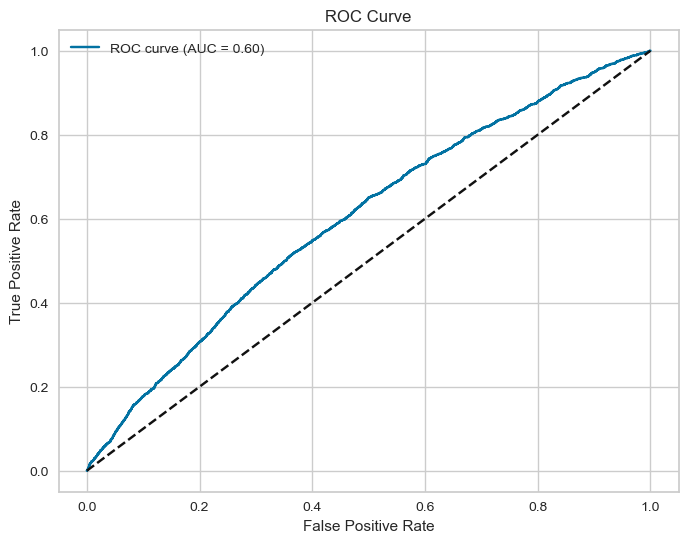

Area Under ROC (AUC): 0.6002


In [247]:
xgb_model_f1 = grid_search_xgb_f1.best_estimator_

evaluate_classification_model(xgb_model_f1, X_test, y_test)

Again, the model shows great bias towards the No Default Risk class. Despite its 0.79 weighted F1-Score and 0.83 accuracy, the model's recall was a 0.06 record low.

The model thus showed a weak ROC Curve, with 0.60 AUC.

### CatBoost

CatBoost is another powerful implementation of Gradient Boosting Trees, specifically designed to work well with categorical data. It is designed to be robust to overfitting by minimizing target leakage when dealing with these variables.

Let us first run the model on our one hot encoded data to compare results with non-encoded data. This model was also run on a sample and low number of estimators.

In [203]:
# Define the hyperparameter grid
param_grid_cbo = {'n_estimators': [2, 4],
              'learning_rate': [0.05, 0.1, 0.2, 0.3],
              'max_depth': [4, 8, 12, 16],
              'subsample': [0.8, 1.0],
              'auto_class_weights': ['Balanced']}

# Initialize GridSearchCV
grid_search_cat_onehot_f1 = GridSearchCV(
    CatBoostClassifier(random_state=42),
    param_grid_cbo,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_cat_onehot_f1.fit(X_sample, y_sample)

Fitting 5 folds for each of 64 candidates, totalling 320 fits
0:	learn: 0.6745046	total: 6.99ms	remaining: 21ms
1:	learn: 0.6591259	total: 13.1ms	remaining: 13.1ms
2:	learn: 0.6483489	total: 19.4ms	remaining: 6.47ms
3:	learn: 0.6423119	total: 24.7ms	remaining: 0us


GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001F20E811B20>,
             n_jobs=-1,
             param_grid={'auto_class_weights': ['Balanced'],
                         'learning_rate': [0.05, 0.1, 0.2, 0.3],
                         'max_depth': [4, 8, 12, 16], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='f1', verbose=1)

In [204]:
grid_search_cat_onehot_f1.best_params_

{'auto_class_weights': 'Balanced',
 'learning_rate': 0.3,
 'max_depth': 8,
 'n_estimators': 4,
 'subsample': 1.0}

The model's best parameters are both the largest learning rate and number of estimators provided, and using the entire dataset in each estimator

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.62      0.73     13498
   Default Risk       0.21      0.58      0.31      2382

       accuracy                           0.61     15880
      macro avg       0.55      0.60      0.52     15880
   weighted avg       0.79      0.61      0.67     15880

Log Loss: 0.6523
Recall Score: 0.5785


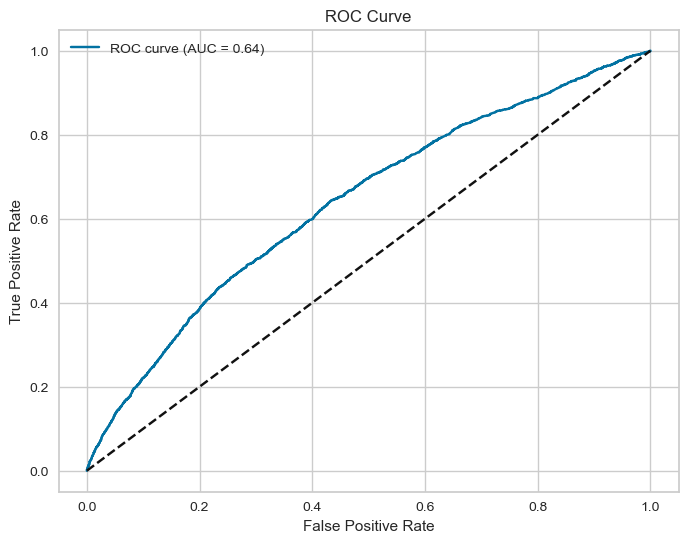

Area Under ROC (AUC): 0.6385


In [205]:
cat_onehot_model_f1 = grid_search_cat_onehot_f1.best_estimator_

evaluate_classification_model(cat_onehot_model_f1, X_test, y_test)

Now a more balanced model, CatBoost showed improvements in the Default Risk prediction scores. It achieved a 0.67 weighted F1-Score and a Recall of 0.58.

The ROC Curve showed improvements and the AUC was 0.64.

### CatBoost without one-hot encoding

Now running the model with the data previously to the one hot encoding.

In [202]:
# Features and Target without one-hot encoding
X_cat = data.drop('TARGET', axis=1)
y_cat = data['TARGET']

# Train-Test Split
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, test_size=0.1, random_state=42, stratify=y)

# Select categorical columns
cat_features = data.select_dtypes(include='object').columns.tolist()

# Define the hyperparameter grid
param_grid_cb = {'n_estimators': [2, 4],
              'learning_rate': [0.1, 0.2, 0.3],
              'max_depth': [4, 8, 12, 16],
              'subsample': [0.8, 1.0],
              'auto_class_weights': ['Balanced'],
              'cat_features': [cat_features]}

# Initialize GridSearchCV
grid_search_cat_f1 = GridSearchCV(
    CatBoostClassifier(random_state=42),
    param_grid_cb,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_cat_f1.fit(X_train_cat, y_train_cat)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
0:	learn: 0.6809341	total: 190ms	remaining: 569ms
1:	learn: 0.6732072	total: 230ms	remaining: 230ms
2:	learn: 0.6680555	total: 266ms	remaining: 88.8ms
3:	learn: 0.6636968	total: 307ms	remaining: 0us


GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001F20E7FCEF0>,
             n_jobs=-1,
             param_grid={'auto_class_weights': ['Balanced'],
                         'cat_features': [['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                           'NAME_EDUCATION_TYPE',
                                           'NAME_FAMILY_STATUS',
                                           'NAME_HOUSING_TYPE',
                                           'ORGANIZATION_TYPE']],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [4, 8, 12, 16], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='f1', verbose=1)

In [248]:
grid_search_cat_f1.best_params_

{'auto_class_weights': 'Balanced',
 'cat_features': ['NAME_CONTRACT_TYPE',
  'CODE_GENDER',
  'NAME_EDUCATION_TYPE',
  'NAME_FAMILY_STATUS',
  'NAME_HOUSING_TYPE',
  'ORGANIZATION_TYPE'],
 'learning_rate': 0.2,
 'max_depth': 8,
 'n_estimators': 4,
 'subsample': 0.8}

The optimization process converged on different arguments, this time with a 0.2 learning rate and using an 80% subsample, but maintaining the highest given number of estimators.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.62      0.73      1350
   Default Risk       0.20      0.56      0.30       238

       accuracy                           0.61      1588
      macro avg       0.55      0.59      0.51      1588
   weighted avg       0.79      0.61      0.66      1588

Log Loss: 0.6655
Recall Score: 0.5588


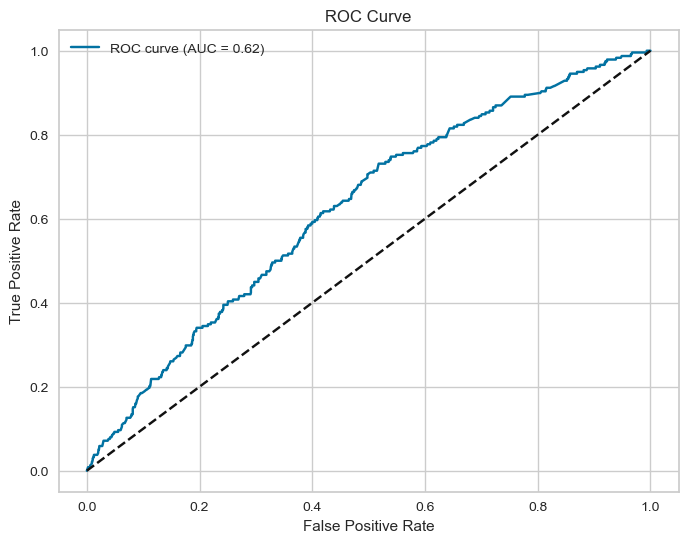

Area Under ROC (AUC): 0.6246


In [249]:
cat_model_f1 = grid_search_cat_f1.best_estimator_

evaluate_classification_model(cat_model_f1, X_test_cat, y_test_cat)

Indeed, when fed the categorical data before encoding, the model shows similar performance.

With a weighted F1-Score of 0.66, CatBoost achieved a 0.56 recall and 0.62 AUC.

### LightGBM

Finally, the last iteration of Gradient Boosting Classifiers is LightGBM. LightGBM introduces optimizations focusing on speed and memory efficiency, which can be particularly beneficial for large datasets.

In [213]:
# Set the hyperparameters
param_grid_lgb = {'n_estimators': [2, 4],
          'max_depth': [5, 10, 20],
          'subsample': [0.8, 1],
          'learning_rate': [0.1, 0.2, 0.3],
          'class_weight' : ['balanced']}

# Initialize GridSearchCV
grid_search_lgb_f1 = GridSearchCV(
    lgb.LGBMClassifier(random_state=42),
    param_grid_lgb,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1)

# Replace spaces, slashes, colons, and other special characters with underscores - these were created by one-hot encoding
X_train_lgb = X_train.copy()
X_train_lgb.columns = X_train_lgb.columns.str.replace('[^a-zA-Z0-9_]', '_', regex=True)

grid_search_lgb_f1.fit(X_train_lgb, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[LightGBM] [Info] Number of positive: 21436, number of negative: 121475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 839
[LightGBM] [Info] Number of data points in the train set: 142911, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1]},
             scoring='f1', verbose=1)

In [214]:
grid_search_lgb_f1.best_params_

{'class_weight': 'balanced',
 'learning_rate': 0.3,
 'max_depth': 10,
 'n_estimators': 4,
 'subsample': 0.8}

We see that to find the best F1-Score, the model uses the maximum learning rate and number of estimators given, and a subsample of 80% for each estimator.

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.63      0.74     13498
   Default Risk       0.23      0.61      0.33      2382

       accuracy                           0.63     15880
      macro avg       0.56      0.62      0.54     15880
   weighted avg       0.80      0.63      0.68     15880

Log Loss: 0.6566
Recall Score: 0.6138


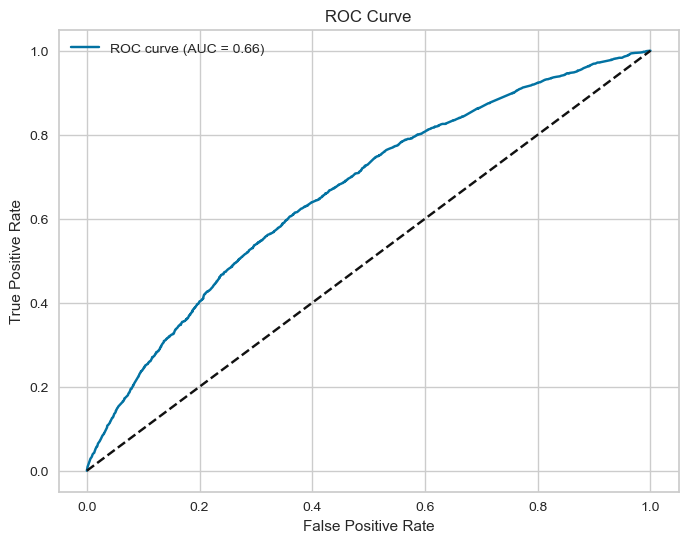

Area Under ROC (AUC): 0.6640


In [215]:
lgb_model_f1 = grid_search_lgb_f1.best_estimator_

evaluate_classification_model(lgb_model_f1, X_test, y_test)

With improvements across all metrics, LightGBM shows the best combination of Recall (0.61) and AUC (0.66) among decision tree-based classifiers.

The ROC Curve shows a standard shape and the weighted F1-Score was 0.68.

## Recall

The primary objective of our project is to develop a robust classification model capable of predicting whether a loan will be charged off.

Given this goal, the key metric to optimize is recall, as it measures the model's ability to correctly identify all relevant positive instances in the dataset. This ensures that the model minimizes false negatives, which is critical in scenarios like loan default prediction, where missing a potential charge-off could result in significant financial losses.

Unfortunately, the results across most models remain very similar to those obtained during F1 optimization, with no substantial improvement in recall. This lack of improvement is likely due to the parameters used in the Grid Search being too limited, failing to provide the models with the flexibility needed to effectively optimize for recall.

### Logistic Regression - Scaled

In [198]:
grid_search_lr_recall = GridSearchCV(LogisticRegression(random_state=42, max_iter=350),  
                            param_grid_lr,
                            scoring='recall',  
                            cv=5,  
                            verbose=1,  
                            n_jobs=-1)

grid_search_lr_recall.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=350, random_state=42),
             n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l2'], 'solver': ['lbfgs']},
                         {'class_weight': ['balanced'], 'penalty': [None],
                          'solver': ['lbfgs']},
                         {'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l1', 'l2'], 'solver': ['liblinear']}],
             scoring='recall', verbose=1)

In [250]:
grid_search_lr_recall.best_params_

{'C': 1, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.61      0.73     13498
   Default Risk       0.22      0.63      0.33      2382

       accuracy                           0.61     15880
      macro avg       0.56      0.62      0.53     15880
   weighted avg       0.80      0.61      0.67     15880

Log Loss: 0.6543
Recall Score: 0.6331


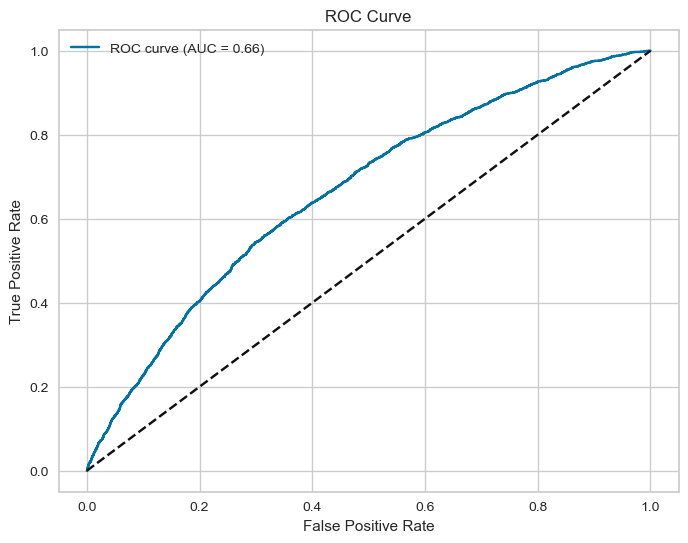

Area Under ROC (AUC): 0.6641


In [251]:
lr_model_recall_scaled = grid_search_lr_recall.best_estimator_

evaluate_classification_model(lr_model_recall_scaled, X_test_scaled, y_test)

Despite optimizing for recall, the limited number of arguments we give the grid search yields a similar model.

### Logistic Regression - Not Scaled


In [252]:
grid_search_lr_recall.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=350, random_state=42),
             n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l2'], 'solver': ['lbfgs']},
                         {'class_weight': ['balanced'], 'penalty': [None],
                          'solver': ['lbfgs']},
                         {'C': [0.1, 1, 10], 'class_weight': ['balanced'],
                          'penalty': ['l1', 'l2'], 'solver': ['liblinear']}],
             scoring='recall', verbose=1)

In [253]:
grid_search_lr_recall.best_params_

{'C': 10, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.61      0.73     13498
   Default Risk       0.22      0.63      0.33      2382

       accuracy                           0.61     15880
      macro avg       0.56      0.62      0.53     15880
   weighted avg       0.80      0.61      0.67     15880

Log Loss: 0.6543
Recall Score: 0.6331


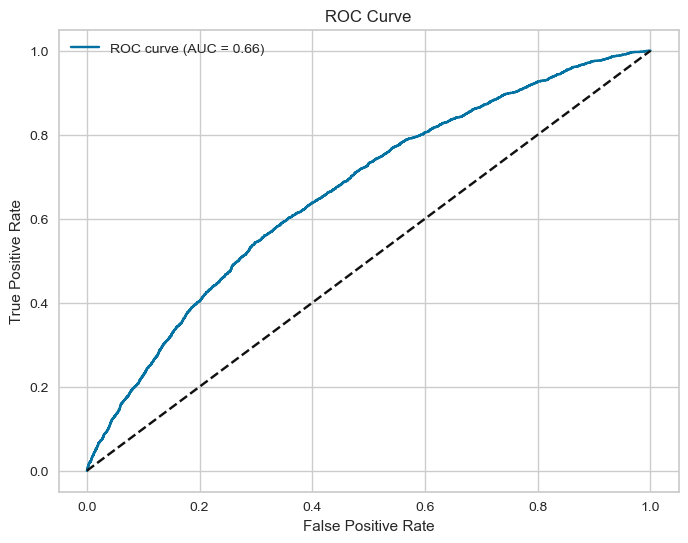

Area Under ROC (AUC): 0.6641


In [254]:
lr_model_recall_notscaled = grid_search_lr_recall.best_estimator_

evaluate_classification_model(lr_model_recall_notscaled, X_test, y_test)

When optimizing for recall, the grid search yields a slightly better model.

### Quadratic Discriminant Analysis

In [316]:
# Initialize GridSearchCV with QDA
grid_search_qda_recall = GridSearchCV(QuadraticDiscriminantAnalysis(), 
                               param_grid_qda, 
                               scoring='recall',
                               cv=5, 
                               verbose=1, 
                               n_jobs=-1)

# Fit the model
grid_search_qda_recall.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


GridSearchCV(cv=5, estimator=QuadraticDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'priors': [None, [0.85, 0.15], [0.75, 0.25],
                                    [0.65, 0.35]],
                         'reg_param': [0.0, 0.001, 0.01, 0.1, 0.5, 1.0]},
             scoring='recall', verbose=1)

In [317]:
grid_search_qda_recall.best_params_

{'priors': [0.65, 0.35], 'reg_param': 0.0}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      1.00      0.92     13498
   Default Risk       0.00      0.00      0.00      2382

       accuracy                           0.85     15880
      macro avg       0.42      0.50      0.46     15880
   weighted avg       0.72      0.85      0.78     15880

Log Loss: 5.4065
Recall Score: 0.0000


c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


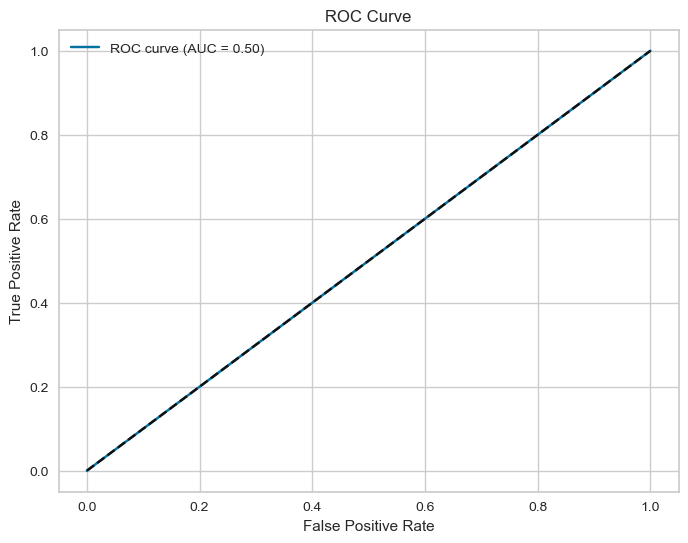

Area Under ROC (AUC): 0.5000


In [318]:
qda_model_recall = grid_search_qda_recall.best_estimator_

evaluate_classification_model(qda_model_recall, X_test, y_test)

Optimizing for recall, the model lost discretion and predicted every value as "No Default Risk".

This model will be discarded moving forward.

### Multinomial Naive Bayes

In [258]:
grid_search_mnb_recall = GridSearchCV(MultinomialNB(), 
                              param_grid_mnb, 
                              scoring='recall',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_mnb_recall.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=MultinomialNB(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
                         'class_prior': [None, [0.8, 0.2], [0.7, 0.3],
                                         [0.6, 0.4]]},
             scoring='recall', verbose=1)

In [259]:
grid_search_mnb_recall.best_params_

{'alpha': 5.0, 'class_prior': [0.6, 0.4]}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.41      0.57     13498
   Default Risk       0.18      0.72      0.29      2382

       accuracy                           0.46     15880
      macro avg       0.54      0.57      0.43     15880
   weighted avg       0.79      0.46      0.52     15880

Log Loss: 2.5656
Recall Score: 0.7238


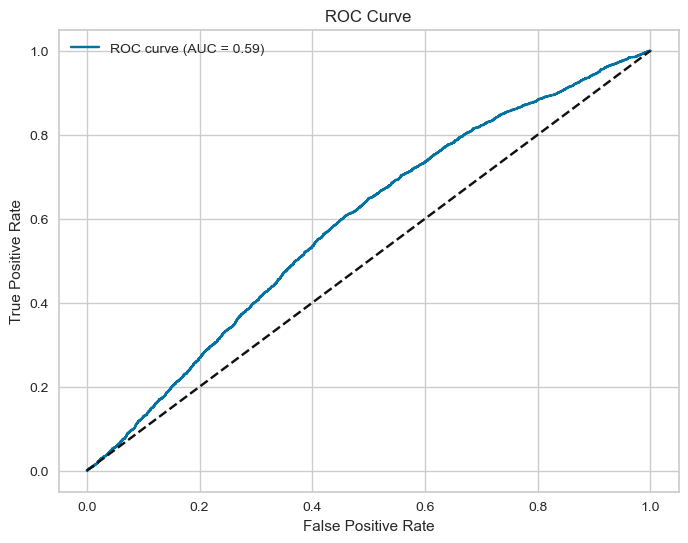

Area Under ROC (AUC): 0.5869


In [260]:
mnb_model_recall = grid_search_mnb_recall.best_estimator_

evaluate_classification_model(mnb_model_recall, X_test, y_test)

Again, the limited number of arguments we give the grid search yields the same model.

### Complement Naive Bayes

In [261]:
grid_search_cnb_recall = GridSearchCV(ComplementNB(), 
                              param_grid_cnb, 
                              scoring='recall',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_cnb_recall.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=ComplementNB(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
                         'class_prior': [None, [0.8, 0.2], [0.7, 0.3],
                                         [0.6, 0.4]]},
             scoring='recall', verbose=1)

In [262]:
grid_search_cnb_recall.best_params_

{'alpha': 5.0, 'class_prior': None}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.90      0.38      0.54     13498
   Default Risk       0.18      0.75      0.29      2382

       accuracy                           0.44     15880
      macro avg       0.54      0.57      0.41     15880
   weighted avg       0.79      0.44      0.50     15880

Log Loss: 2.7485
Recall Score: 0.7536


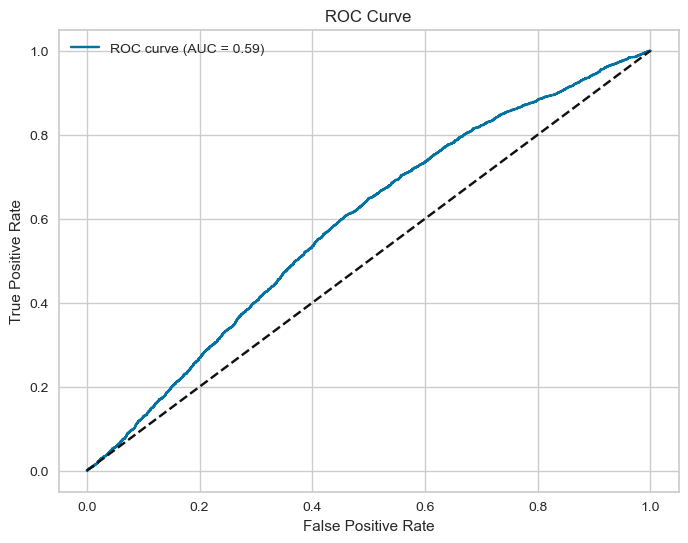

Area Under ROC (AUC): 0.5869


In [263]:
cnb_model_recall = grid_search_cnb_recall.best_estimator_

evaluate_classification_model(cnb_model_recall, X_test, y_test)

Again, the limited number of arguments we give the grid search yields the same model.

### Decision Tree

In [264]:
grid_search_dt_recall = GridSearchCV(DecisionTreeClassifier(random_state=42), 
                              param_grid_dt, 
                              scoring='recall_macro',
                              cv=5, 
                              verbose=1, 
                              n_jobs=-1)

grid_search_dt_recall.fit(X_sample, y_sample)

Fitting 5 folds for each of 540 candidates, totalling 2700 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20, 30],
                         'min_samples_leaf': [2, 10, 50],
                         'min_samples_split': [2, 10, 50],
                         'splitter': ['best', 'random']},
             scoring='recall_macro', verbose=1)

In [265]:
grid_search_dt_recall.best_params_

{'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'min_samples_split': 2,
 'splitter': 'random'}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.59      0.71     13498
   Default Risk       0.20      0.57      0.30      2382

       accuracy                           0.59     15880
      macro avg       0.54      0.58      0.50     15880
   weighted avg       0.78      0.59      0.65     15880

Log Loss: 0.6741
Recall Score: 0.5722


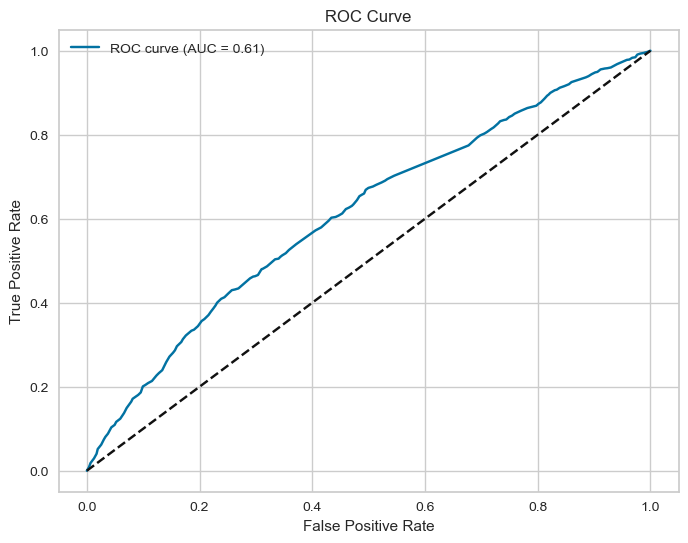

Area Under ROC (AUC): 0.6122


In [266]:
dt_model_recall = grid_search_dt_recall.best_estimator_

evaluate_classification_model(dt_model_recall, X_test, y_test)

Again, the limited number of arguments we give the grid search yields the same model.

### Random Forest (Bagging Method)

In [267]:
# Initialize GridSearchCV
grid_search_rf_recall = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid_rf,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_rf_recall.fit(X_sample, y_sample)

Fitting 5 folds for each of 320 candidates, totalling 1600 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy'], 'max_depth': [5, 10],
                         'min_samples_leaf': [2, 10],
                         'min_samples_split': [2, 10],
                         'n_estimators': [10, 20]},
             scoring='recall', verbose=1)

In [268]:
grid_search_rf_recall.best_params_

{'ccp_alpha': 0.0125,
 'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': 5,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 20}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.00      0.00      0.00     13498
   Default Risk       0.15      1.00      0.26      2382

       accuracy                           0.15     15880
      macro avg       0.07      0.50      0.13     15880
   weighted avg       0.02      0.15      0.04     15880

Log Loss: 0.6952
Recall Score: 1.0000


c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


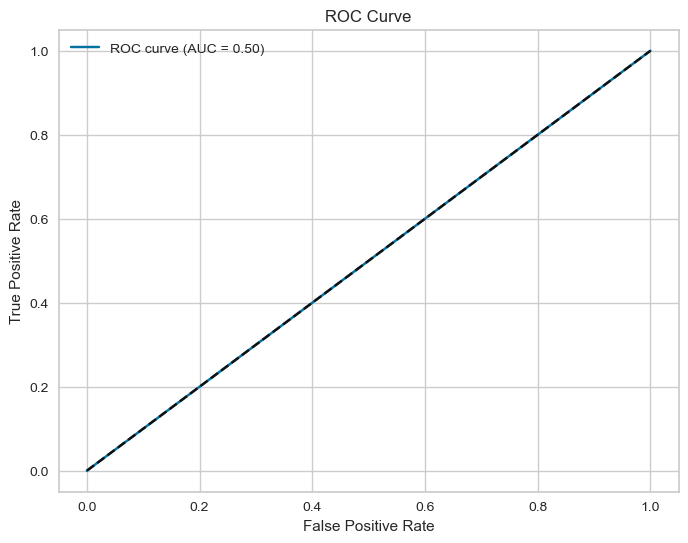

Area Under ROC (AUC): 0.5000


In [269]:
rf_model_recall = grid_search_rf_recall.best_estimator_

evaluate_classification_model(rf_model_recall, X_test, y_test)

Optimizing for recall, the model lost discretion and predicted every value as "Default Risk". Due to computanional limitations it was unfeasable to rerun with better parameters. 

The model will not be considered moving forward  

### Gradient Boosting Classifier

In [270]:
# Initialize GridSearchCV
grid_search_gb_recall = GridSearchCV(
    GradientBoostingClassifier(random_state=42),
    param_grid_gb,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_gb_recall.fit(X_sample, y_sample)

Fitting 5 folds for each of 180 candidates, totalling 900 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.    , 0.0125, 0.025 , 0.0375, 0.05  ]),
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='recall', verbose=1)

In [271]:
grid_search_gb_recall.best_params_

{'ccp_alpha': 0.0,
 'learning_rate': 0.3,
 'max_depth': 20,
 'n_estimators': 4,
 'subsample': 1.0}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      0.93      0.89     13498
   Default Risk       0.21      0.10      0.14      2382

       accuracy                           0.81     15880
      macro avg       0.53      0.52      0.51     15880
   weighted avg       0.76      0.81      0.78     15880

Log Loss: 0.4905
Recall Score: 0.1012


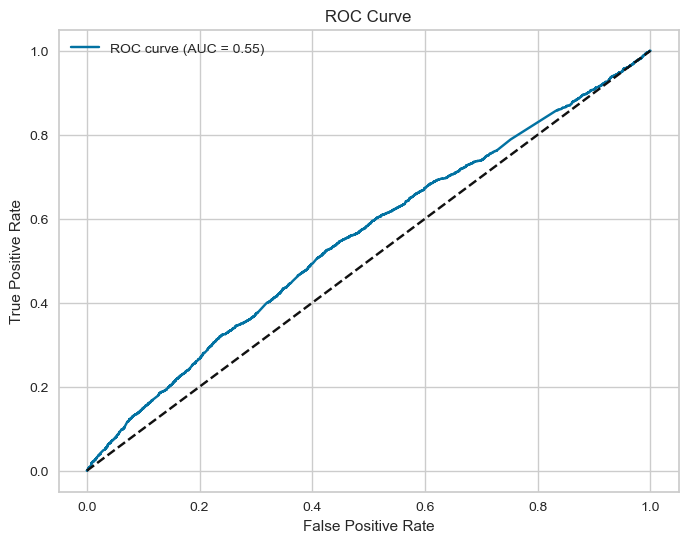

Area Under ROC (AUC): 0.5533


In [272]:
gb_model_recall = grid_search_gb_recall.best_estimator_

evaluate_classification_model(gb_model_recall, X_test, y_test)

The Gradient Boosting Classifier also yielded the same model.

### XGBoost

In [273]:
# Initialize GridSearchCV
grid_search_xgb_recall = GridSearchCV(
    xgb.XGBClassifier(random_state=42),
    param_grid_xgb,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_xgb_recall.fit(X_sample, y_sample)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'gamma': [0.01, 0.025, 0.05],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [50, 100],
                         'subsample': [0.8, 1.0]},
             scoring='recall', verbose=1)

In [274]:
grid_search_xgb_recall.best_params_

{'gamma': 0.025,
 'learning_rate': 0.3,
 'max_depth': 10,
 'n_estimators': 100,
 'subsample': 0.8}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.85      0.97      0.91     13498
   Default Risk       0.24      0.06      0.09      2382

       accuracy                           0.83     15880
      macro avg       0.55      0.51      0.50     15880
   weighted avg       0.76      0.83      0.79     15880

Log Loss: 0.5389
Recall Score: 0.0584


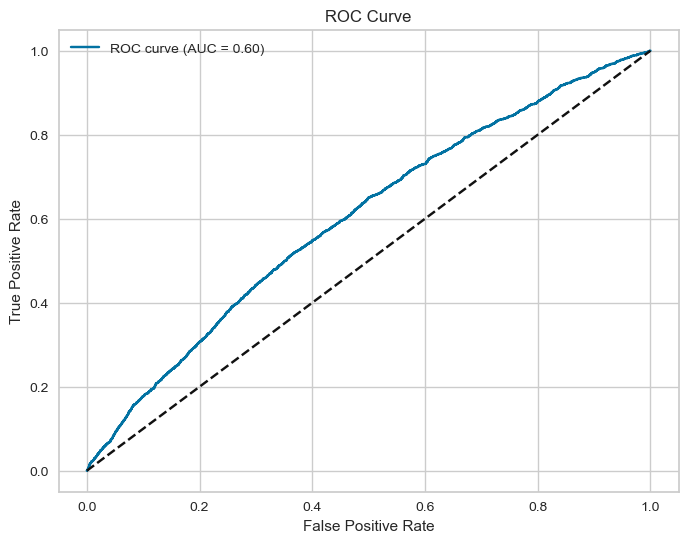

Area Under ROC (AUC): 0.6002


In [275]:
xgb_model_recall = grid_search_xgb_recall.best_estimator_

evaluate_classification_model(xgb_model_recall, X_test, y_test)

Again, XGBoost didn't suffer any changes.

### CatBoost

In [206]:
# Initialize GridSearchCV
grid_search_cat_onehot_recall = GridSearchCV(
    CatBoostClassifier(random_state=42),
    param_grid_cbo,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_cat_onehot_recall.fit(X_sample, y_sample)

Fitting 5 folds for each of 64 candidates, totalling 320 fits
0:	learn: 0.6745046	total: 6.07ms	remaining: 6.07ms
1:	learn: 0.6591259	total: 11.9ms	remaining: 0us


GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001F226AA2E70>,
             n_jobs=-1,
             param_grid={'auto_class_weights': ['Balanced'],
                         'learning_rate': [0.05, 0.1, 0.2, 0.3],
                         'max_depth': [4, 8, 12, 16], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='recall', verbose=1)

In [210]:
grid_search_cat_onehot_recall.best_params_

{'auto_class_weights': 'Balanced',
 'learning_rate': 0.3,
 'max_depth': 8,
 'n_estimators': 2,
 'subsample': 1.0}

Optimizing for recall, the model chose to use a smaller number of estimators

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.89      0.60      0.72     13498
   Default Risk       0.21      0.59      0.31      2382

       accuracy                           0.60     15880
      macro avg       0.55      0.60      0.52     15880
   weighted avg       0.79      0.60      0.66     15880

Log Loss: 0.6634
Recall Score: 0.5949


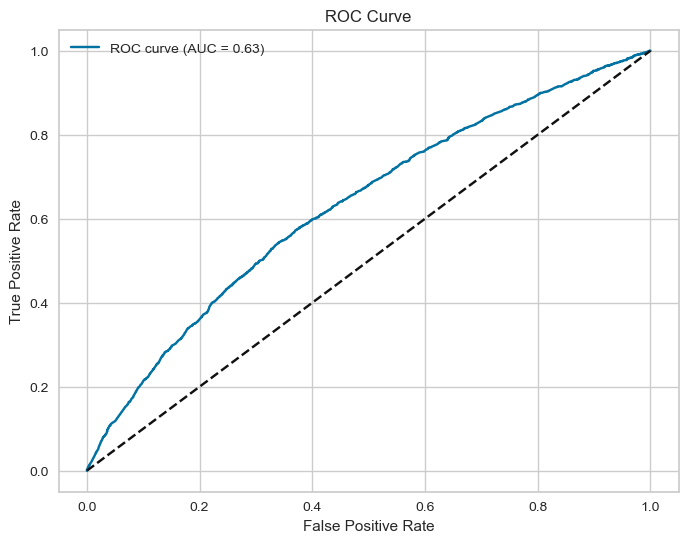

Area Under ROC (AUC): 0.6309


In [211]:
cat_onehot_model_recall = grid_search_cat_onehot_recall.best_estimator_

evaluate_classification_model(cat_onehot_model_recall, X_test, y_test)

The final model is not much different from when maximizing for F1-Score, but it did indeed increase recall to 0.59. The ROC Curve shows a similar shape.

### CatBoost without one-hot encoding

In [207]:
# Features and Target without one-hot encoding
X_cat = data.drop('TARGET', axis=1)
y_cat = data['TARGET']

# Train-Test Split
X_sample_cat, X_test_cat, y_sample_cat, y_test_cat = train_test_split(X_cat, y_cat, test_size=0.01, random_state=42, stratify=y)

# Select categorical columns
cat_features = data.select_dtypes(include='object').columns.tolist()

# Initialize GridSearchCV
grid_search_cat_recall = GridSearchCV(
    CatBoostClassifier(random_state=42),
    param_grid_cb,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

grid_search_cat_recall.fit(X_sample_cat, y_sample_cat)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
0:	learn: 0.6844097	total: 30.1ms	remaining: 30.1ms
1:	learn: 0.6784056	total: 60ms	remaining: 0us


GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001F20D74BC80>,
             n_jobs=-1,
             param_grid={'auto_class_weights': ['Balanced'],
                         'cat_features': [['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                           'NAME_EDUCATION_TYPE',
                                           'NAME_FAMILY_STATUS',
                                           'NAME_HOUSING_TYPE',
                                           'ORGANIZATION_TYPE']],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [4, 8, 12, 16], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1.0]},
             scoring='recall', verbose=1)

In [208]:
grid_search_cat_recall.best_params_

{'auto_class_weights': 'Balanced',
 'cat_features': ['NAME_CONTRACT_TYPE',
  'CODE_GENDER',
  'NAME_EDUCATION_TYPE',
  'NAME_FAMILY_STATUS',
  'NAME_HOUSING_TYPE',
  'ORGANIZATION_TYPE'],
 'learning_rate': 0.2,
 'max_depth': 4,
 'n_estimators': 2,
 'subsample': 0.8}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.88      0.59      0.71      1350
   Default Risk       0.19      0.55      0.29       238

       accuracy                           0.59      1588
      macro avg       0.54      0.57      0.50      1588
   weighted avg       0.78      0.59      0.65      1588

Log Loss: 0.6796
Recall Score: 0.5504


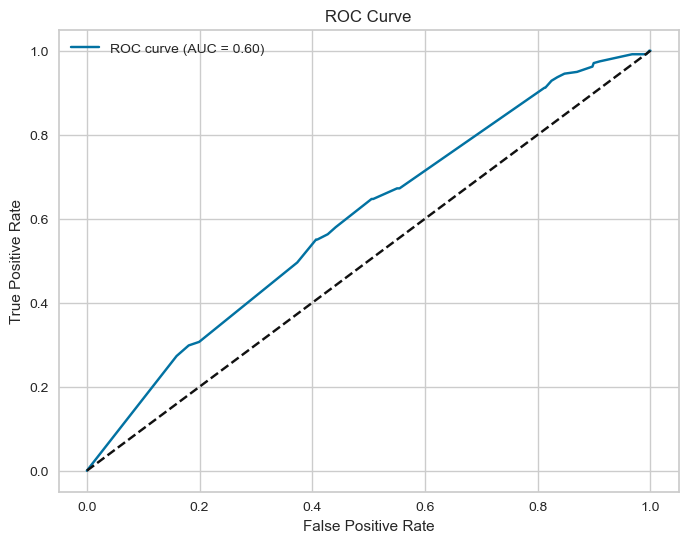

Area Under ROC (AUC): 0.5975


In [209]:
cat_model_recall = grid_search_cat_recall.best_estimator_

evaluate_classification_model(cat_model_recall, X_test_cat, y_test_cat)

Surprisingly, optimizing for recall yielded a worse recall score for CatBoost without encoding. Both the weighted F1 and AUC scores performed worse.

### LightGBM

In [216]:
# Initialize GridSearchCV
grid_search_lgb_recall = GridSearchCV(
    lgb.LGBMClassifier(random_state=42),
    param_grid_lgb,
    scoring='recall',
    cv=5,
    verbose=1,
    n_jobs=-1)

# Replace spaces, slashes, colons, and other special characters with underscores - these were created by one-hot encoding
X_train_lgb = X_train.copy()
X_train_lgb.columns = X_train_lgb.columns.str.replace('[^a-zA-Z0-9_]', '_', regex=True)

grid_search_lgb_recall.fit(X_train_lgb, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[LightGBM] [Info] Number of positive: 21436, number of negative: 121475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 839
[LightGBM] [Info] Number of data points in the train set: 142911, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [5, 10, 20], 'n_estimators': [2, 4],
                         'subsample': [0.8, 1]},
             scoring='recall', verbose=1)

In [217]:
grid_search_lgb_recall.best_params_

{'class_weight': 'balanced',
 'learning_rate': 0.1,
 'max_depth': 10,
 'n_estimators': 2,
 'subsample': 0.8}

Classification Report:
                 precision    recall  f1-score   support

No Default Risk       0.91      0.57      0.70     13498
   Default Risk       0.21      0.67      0.32      2382

       accuracy                           0.58     15880
      macro avg       0.56      0.62      0.51     15880
   weighted avg       0.80      0.58      0.64     15880

Log Loss: 0.6817
Recall Score: 0.6662


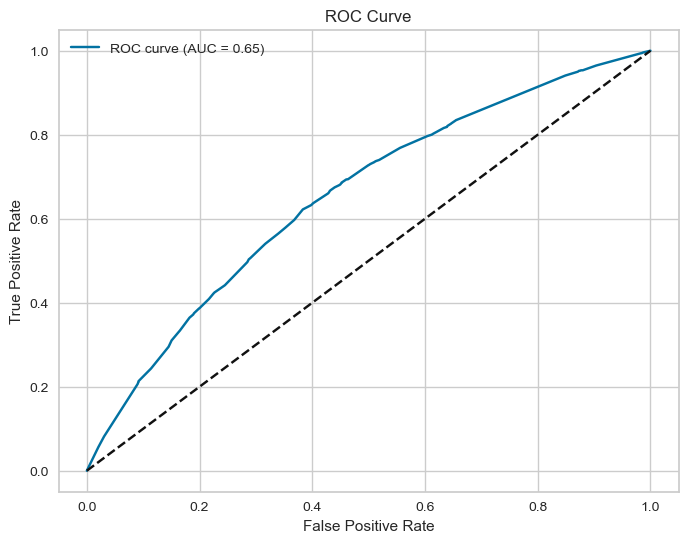

Area Under ROC (AUC): 0.6537


In [218]:
lgb_model_recall = grid_search_lgb_recall.best_estimator_

evaluate_classification_model(lgb_model_recall, X_test, y_test)

LightGBM did indeed change quite a bit. Optimizing for recall, the model was able to increase recall to 0.67, at the cost of a weighted f1 score, now of 0.64.

The ROC curve has one of the better shapes, and the AUC was 0.65

## Improve ability to identify default loans within reason

### First option: Lower Threshold 

In [292]:
def evaluate_threshold(model, X_test, y_test, threshold=0.3):
    probabilities = model.predict_proba(X_test)[:, 1]
    predictions = (probabilities >= threshold).astype(int)
    recall = recall_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    return recall, precision, f1

To enhance our ability to identify loans with potential payment issues, we implemented a threshold adjustment, making the models more sensitive to identifying this class.

By lowering the threshold to 30%, we adjusted the decision boundary, such that any loan with a predicted probability of 30% or higher for the default class would be classified as a default. This strategy shifts the focus towards minimizing false negatives, ensuring that more loans with a risk of default are captured by the model.

This adjustment increases the likelihood of identifying true positive cases (defaults), which is critical for our objective. However, it also introduces a trade-off, as the model becomes more prone to false positives, potentially reducing precision. Despite this, prioritizing recall aligns with our goal of proactively identifying loans at risk of payment issues, as missing potential defaults could result in significant financial implications.

By implementing this threshold change, we effectively made all models more attuned to the default class, thereby enhancing their sensitivity to identifying loans with potential payment problems.

In [323]:
# F1 models dictionary
f1_models = {
    "Logistic Regression Scaled F1": lr_model_f1_scaled,
    "Logistic Regression Not Scaled F1": lr_model_f1_notscaled,
    "Multinomial Naive Bayes F1": mnb_model_f1,
    "Complement Naive Bayes F1":cnb_model_f1,
    "Decision Tree F1": dt_model_f1,
    "Random Forest F1": rf_model_f1,
    "Gradient Boosting Classifier F1": gb_model_f1,
    "XG Boost F1": xgb_model_f1,
    "CatBoost w/ One Hot F1": cat_onehot_model_f1,
    #"CatBoost w/o One Hot F1": cat_model_f1, # This model uses pre-encoding data, thus it is not compatible with others
    "LightGBM F1": lgb_model_f1}

# Recall models dictionary
recall_models = {
    "Logistic Regression Scaled recall": lr_model_recall_scaled,
    "Logistic Regression Not Scaled recall": lr_model_recall_notscaled,
    "Multinomial Naive Bayes recall": mnb_model_recall,
    "Complement Naive Bayes recall": cnb_model_recall,
    "Decision Tree recall": dt_model_recall,
    "Gradient Boosting Classifier recall": gb_model_recall,
    "XG Boost recall": xgb_model_recall,
    "CatBoost w/ One Hot recall": cat_onehot_model_recall,
    #"CatBoost w/o One Hot recall": cat_model_recall,
    "LightGBM recall": lgb_model_recall}

### Optimized for F1

In [324]:
# Results
results = {}
for model_name, model in f1_models.items():
    recall, precision, f1 = evaluate_threshold(model, X_test, y_test, threshold=0.3)
    results[model_name] = {"Recall": recall, "Precision": precision, "F1 Score": f1}

# Print the results
for model_name, metrics in results.items():
    print(f"{model_name} (Threshold=0.3): Recall={metrics['Recall']:.2f}, Precision={metrics['Precision']:.2f}, F1 Score={metrics['F1 Score']:.2f}\n")

Logistic Regression Scaled F1 (Threshold=0.3): Recall=0.00, Precision=0.00, F1 Score=0.00

Logistic Regression Not Scaled F1 (Threshold=0.3): Recall=0.97, Precision=0.16, F1 Score=0.28

Multinomial Naive Bayes F1 (Threshold=0.3): Recall=0.78, Precision=0.18, F1 Score=0.29

Complement Naive Bayes F1 (Threshold=0.3): Recall=0.81, Precision=0.17, F1 Score=0.29

Decision Tree F1 (Threshold=0.3): Recall=0.90, Precision=0.16, F1 Score=0.27

Random Forest F1 (Threshold=0.3): Recall=1.00, Precision=0.15, F1 Score=0.26

Gradient Boosting Classifier F1 (Threshold=0.3): Recall=0.21, Precision=0.19, F1 Score=0.20

XG Boost F1 (Threshold=0.3): Recall=0.14, Precision=0.25, F1 Score=0.18

CatBoost w/ One Hot F1 (Threshold=0.3): Recall=0.98, Precision=0.15, F1 Score=0.27

LightGBM F1 (Threshold=0.3): Recall=1.00, Precision=0.15, F1 Score=0.26



c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


As expected, the recall metric increased across most models, with some achieving 100%. Precision behaved as anticipated, demonstrating a trade-off with recall.

In terms of results, the Decision Tree appears to be a strong candidate, achieving a recall of 90% while maintaining relatively good precision compared to other trade-offs.

The Naive Bayes model delivered the highest F1 score, with a recall of 80%. However, since our primary objective is to maximize recall, other models may be more suitable for this goal.

Two models did not perform well, suggesting that the threshold adjustment introduced some issues affecting their performance.

### Optimized for Recall

In [325]:
# Results
results = {}
for model_name, model in recall_models.items():
    recall, precision, f1 = evaluate_threshold(model, X_test, y_test, threshold=0.3)
    results[model_name] = {"Recall": recall, "Precision": precision, "F1 Score": f1}

# Print the results
for model_name, metrics in results.items():
    print(f"{model_name} (Threshold=0.3): Recall={metrics['Recall']:.2f}, Precision={metrics['Precision']:.2f}, F1 Score={metrics['F1 Score']:.2f}\n")

Logistic Regression Scaled recall (Threshold=0.3): Recall=0.00, Precision=0.00, F1 Score=0.00

Logistic Regression Not Scaled recall (Threshold=0.3): Recall=0.97, Precision=0.16, F1 Score=0.28

Multinomial Naive Bayes recall (Threshold=0.3): Recall=0.78, Precision=0.18, F1 Score=0.29

Complement Naive Bayes recall (Threshold=0.3): Recall=0.81, Precision=0.17, F1 Score=0.29

Decision Tree recall (Threshold=0.3): Recall=0.90, Precision=0.16, F1 Score=0.27

Gradient Boosting Classifier recall (Threshold=0.3): Recall=0.21, Precision=0.19, F1 Score=0.20

XG Boost recall (Threshold=0.3): Recall=0.14, Precision=0.25, F1 Score=0.18

CatBoost w/ One Hot recall (Threshold=0.3): Recall=0.99, Precision=0.15, F1 Score=0.26

LightGBM recall (Threshold=0.3): Recall=1.00, Precision=0.15, F1 Score=0.26



c:\Users\afcas\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Again, the recall metric increased across most models, with some achieving 100%. Precision behaved as anticipated, demonstrating a trade-off with recall, as expected.

In terms of results, the Decision Tree appears to be a strong candidate, achieving a recall of 90% while maintaining relatively good precision compared to other trade-offs.

The Naive Bayes model delivered the highest F1 score, with a recall of 80%. However, since our primary objective is to maximize recall, other models may be more suitable for this goal.

Two models did not perform well, suggesting that the threshold adjustment introduced some issues affecting their performance.

### Second option: Ensemble methods

Ensemble function for Max and Average

In [310]:
# Function to ensemble probabilities
def ensemble_probabilities(models, X_test, strategy="max"):
    if strategy == "max":
        # Take the maximum probability across models for each instance
        probabilities = np.max([model.predict_proba(X_test)[:, 1] for model in models.values()], axis=0)
    elif strategy == "average":
        # Take the average probability across models for each instance
        probabilities = np.mean([model.predict_proba(X_test)[:, 1] for model in models.values()], axis=0)
    else:
        raise ValueError("Invalid strategy. Use 'max' or 'average'.")
    return probabilities

For the Ensemble method, we combined multiple models and calculated two aggregation strategies: the maximum probability across models and the average probability (performed for both F1 and recall optimizations).

During this process, certain models were excluded for the following reasons:

- QDA: Recall was 0%, making it unsuitable for inclusion.
- Random Forest: Recall was 100%, indicating a heavy bias towards default.
- CatBoost without OHE: Unable to compute due to incompatible data parameters.

Maximization improved recall, as it prioritizes identifying positives by taking the highest probability from any model.

Averaging reduced recall significantly, as it smooths out probabilities and is more influenced by models with lower recall scores, such as XGBoost.

### Optimized for F1 

In [326]:
# Ensemble probabilities for F1 models
f1_max_probabilities = ensemble_probabilities(f1_models, X_test, strategy="max")
f1_avg_probabilities = ensemble_probabilities(f1_models, X_test, strategy="average")

# Result for max
f1_max_predictions = (f1_max_probabilities >= 0.5).astype(int)
f1_max_recall = recall_score(y_test, f1_max_predictions)
f1_max_precision = precision_score(y_test, f1_max_predictions)
f1_max_f1 = f1_score(y_test, f1_max_predictions)

# Result for average
f1_avg_predictions = (f1_avg_probabilities >= 0.5).astype(int)
f1_avg_recall = recall_score(y_test, f1_avg_predictions)
f1_avg_precision = precision_score(y_test, f1_avg_predictions)
f1_avg_f1 = f1_score(y_test, f1_avg_predictions)

# Display
print("F1 Models Ensemble Results:")
print(f"Max Ensemble: Recall={f1_max_recall:.2f}, Precision={f1_max_precision:.2f}, F1 Score={f1_max_f1:.2f}")
print(f"Average Ensemble: Recall={f1_avg_recall:.2f}, Precision={f1_avg_precision:.2f}, F1 Score={f1_avg_f1:.2f}")

F1 Models Ensemble Results:
Max Ensemble: Recall=0.88, Precision=0.17, F1 Score=0.29
Average Ensemble: Recall=0.33, Precision=0.27, F1 Score=0.30


### Optimized for Recall

In [327]:
# Ensemble probabilities for recall models
recall_max_probabilities = ensemble_probabilities(recall_models, X_test, strategy="max")
recall_avg_probabilities = ensemble_probabilities(recall_models, X_test, strategy="average")

# Result for max
recall_max_predictions = (recall_max_probabilities >= 0.5).astype(int)
recall_max_recall = recall_score(y_test, recall_max_predictions)
recall_max_precision = precision_score(y_test, recall_max_predictions)
recall_max_f1 = f1_score(y_test, recall_max_predictions)

# Result for average
recall_avg_predictions = (recall_avg_probabilities >= 0.5).astype(int)
recall_avg_recall = recall_score(y_test, recall_avg_predictions)
recall_avg_precision = precision_score(y_test, recall_avg_predictions)
recall_avg_f1 = f1_score(y_test, recall_avg_predictions)

# Display
print("\nRecall Models Ensemble Results:")
print(f"Max Ensemble: Recall={recall_max_recall:.2f}, Precision={recall_max_precision:.2f}, F1 Score={recall_max_f1:.2f}")
print(f"Average Ensemble: Recall={recall_avg_recall:.2f}, Precision={recall_avg_precision:.2f}, F1 Score={recall_avg_f1:.2f}")


Recall Models Ensemble Results:
Max Ensemble: Recall=0.88, Precision=0.17, F1 Score=0.28
Average Ensemble: Recall=0.27, Precision=0.28, F1 Score=0.27


### Combining the two approaches

This can only be achieved on the average ensemble, as the maximum ensemble is already looking for ways to predict default.

In [373]:
# Set the threshold to a lower value, e.g., 0.3
threshold = 0.3

# Result for average with modified threshold
f1_avg_predictions = (f1_avg_probabilities >= threshold).astype(int)
f1_avg_recall = recall_score(y_test, f1_avg_predictions)
f1_avg_precision = precision_score(y_test, f1_avg_predictions)
f1_avg_f1 = f1_score(y_test, f1_avg_predictions)

# Result for average with modified threshold
recall_avg_predictions = (recall_avg_probabilities >= threshold).astype(int)
recall_avg_recall = recall_score(y_test, recall_avg_predictions)
recall_avg_precision = precision_score(y_test, recall_avg_predictions)
recall_avg_f1 = f1_score(y_test, recall_avg_predictions)

# Display
print(f"Average F1 Ensemble with Threshold={threshold}: Recall={f1_avg_recall:.2f}, Precision={f1_avg_precision:.2f}, F1 Score={f1_avg_f1:.2f}")
print(f"Average Recall Ensemble with Threshold={threshold}: Recall={recall_avg_recall:.2f}, Precision={recall_avg_precision:.2f}, F1 Score={recall_avg_f1:.2f}")

Average F1 Ensemble with Threshold=0.3: Recall=0.81, Precision=0.18, F1 Score=0.29
Average Recall Ensemble with Threshold=0.3: Recall=0.80, Precision=0.18, F1 Score=0.29


Following the implementation of the threshold adjustment and the Ensemble technique, two models emerged as the strongest candidates for addressing the optimization problem:

- F1 Max Ensemble: This model achieved a recall of 88% and an F1 score of 0.29, indicating a slightly better balance between precision and recall. 
- Decision Tree with Threshold Adjustment: This model delivered a recall of 90% and an F1 score of 0.27, showcasing a higher recall but a marginally lower precision. 

Both models demonstrate comparable metrics, with one emphasizing higher recall (Decision Tree) and the other offering a modestly better precision-recall trade-off (F1 Max Ensemble). These differences reflect slightly varied priorities: one model is more aggressive in identifying defaults, while the other balances recall and precision more conservatively.

Given the similarities in performance, either model could serve as a strong, conservative choice for this optimization problem.

# Unsupervised Learning

In [125]:
import yellowbrick
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

For Unsupervised Learning tasks, there is no need for splitting the data into training and testing, as the idea is to find clusters of variables, not make predictions on a target variable. Additionally, most unsupervised models work best with scaled data, to avoid variables dominating eachother due to their scale.

As such, the entire dataset was scaled, the target was variable dropped, and outliers were removed.

In [377]:
scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(final_df), columns=final_df.columns)

# Remove outliers
scaled_data = scaled_data[(scaled_data > -3) & (scaled_data < 3)].dropna()
scaled_data = scaled_data.drop('TARGET', axis=1) 

scaled_data.describe()

,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REG_CITY_NOT_WORK_CITY,FLAG_ASSET,ANNUITY_PERCENT_INCOME,CREDIT_PERCENT_INCOME,HOUSING_INFO,INCOME_BAND,...,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_XNA,ORGANIZATION_TYPE_infrequent_sklearn,FLAG_CONT_MOBILE,FLAG_CONT_MOBILE
count,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,80831.000000,...,8.083100e+04,8.083100e+04,8.083100e+04,8.083100e+04,80831.000000,8.083100e+04,80831.000000,80831.000000,8.083100e+04,8.083100e+04
mean,-0.091982,-0.050121,0.076203,0.053447,-0.005581,0.073172,0.027953,0.016376,-0.023712,0.039350,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,0.105450,-1.630259e-01,0.080943,0.132661,4.343421e-02,4.343421e-02
std,0.782535,0.705092,0.855316,0.928316,0.996511,0.976234,0.866409,0.877931,0.998041,0.980528,...,2.809714e-13,1.392783e-13,1.631483e-13,1.417486e-13,1.107155,1.601229e-13,1.063711,1.061587,3.840008e-14,3.840008e-14
min,-1.473237,-0.454728,-1.265290,-2.076384,-0.555510,-1.661008,-1.914991,-1.473388,-0.978024,-2.139598,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,-0.380638,-1.630259e-01,-0.461536,-0.593965,4.343421e-02,4.343421e-02
25%,-0.782692,-0.454728,-0.172853,-0.117747,-0.555510,-0.696801,-0.622352,-0.654164,-0.978024,-0.700628,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,-0.380638,-1.630259e-01,-0.461536,-0.593965,4.343421e-02,4.343421e-02
50%,-0.137998,-0.454728,-0.172853,-0.117747,-0.555510,0.267407,-0.096425,-0.175885,-0.978024,-0.220972,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,-0.380638,-1.630259e-01,-0.461536,-0.593965,4.343421e-02,4.343421e-02
75%,0.411786,0.210934,0.919584,-0.117747,-0.555510,1.231614,0.557287,0.515149,1.118859,0.738341,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,-0.380638,-1.630259e-01,-0.461536,1.683601,4.343421e-02,4.343421e-02
max,1.857171,2.984529,2.012021,1.840891,1.800148,1.231614,2.999995,2.996482,1.118859,2.177311,...,-1.869252e-01,-1.933088e-01,-2.390708e-01,-1.710723e-01,2.627169,-1.630259e-01,2.166678,1.683601,4.343421e-02,4.343421e-02


Let us first look at the results of our clustering algorithms before any further feature treatment or selection, which might improve our results.

## K-Means Clustering

The Elbow Visualizer and the Silhouette Scores help us assess our choice of k

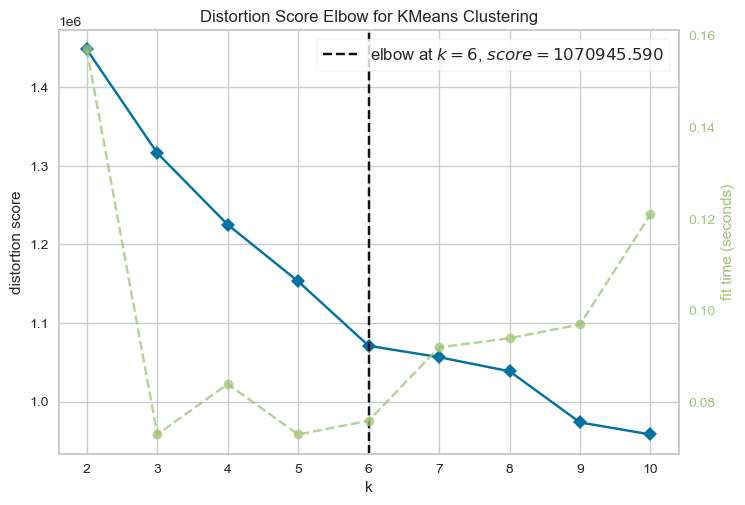

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [127]:
# We used elbow method for finding the optimal number of clusters (k), the best number of clusters is 6 according to elbow method. 

KEV = KElbowVisualizer(KMeans(random_state=42), k=10)
KEV.fit(scaled_data)
KEV.show()

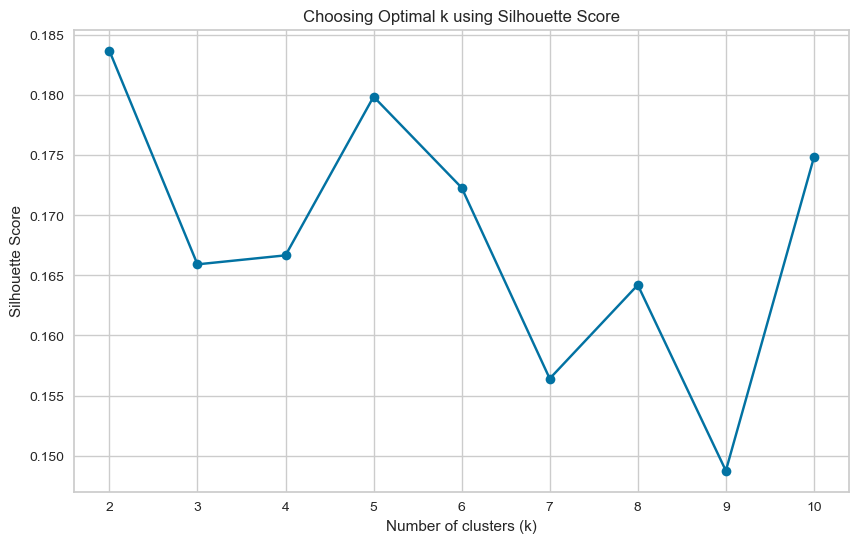

Optimal K: 2 with score 0.183705282593954


In [128]:
# In the Silhouette method we evaluate the quality of the clustering. 

# List to store the silhouette scores
silhouette_scores = []

# Range of k values to try
k_range = range(2, 11)
# Compute silhouette scores for different k values
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(scaled_data)  # Exclude the 'Cluster_Labels' column for fitting
    labels = kmeans.labels_
    score = silhouette_score(scaled_data, labels)
    silhouette_scores.append(score)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Choosing Optimal k using Silhouette Score')
plt.grid(True)
plt.show()

# Find the optimal k (where silhouette score is maximum)
optimal_k = k_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal K: {optimal_k} with score {max(silhouette_scores)}")

Between the two plots, we decided to select a total of 5 clusters.

In [329]:
km5 = KMeans(n_clusters=5, random_state=42)
km5.fit(scaled_data)
labels = km5.labels_

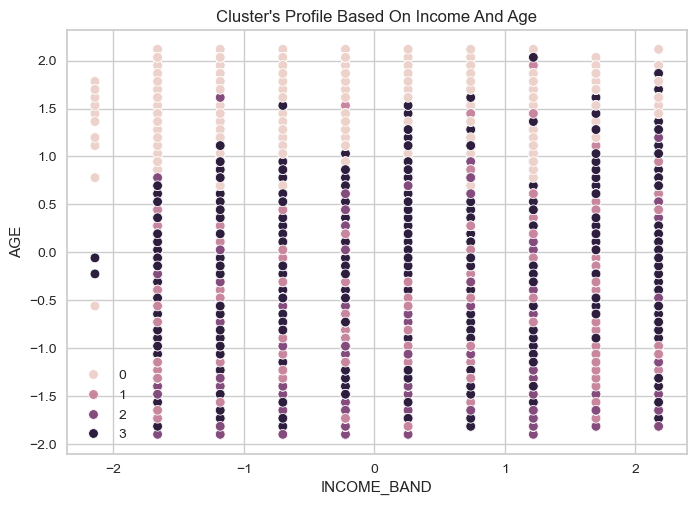

In [130]:
# Here we have a scatter plot showing the relationship between the Income and age for different clusters. We can observe that at a higher age there is a group forming. 

pl = sns.scatterplot(data = scaled_data, x="INCOME_BAND", y="AGE", hue=labels)
pl.set_title("Cluster's Profile Based On Income And Age")
plt.legend()
plt.show()

An initial look into the clustered data indicates a cluster with higher-aged individuals.

In [131]:
def plot_3d_clusters(data, labels, feature_names, colors=None, markers=None):
    """
    Plots a 3D scatter plot for clustering data with up to 10 different clusters.
    """
    if len(feature_names) != 3:
        raise ValueError("Three feature names must be provided for x, y, and z axes.")

    # Default color and marker arrays for up to 10 clusters
    default_colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
    default_markers = ['o', '^', 's', 'P', '*', 'D', 'x', '+', 'H', '1']

    # Use default colors and markers if none are provided
    if colors is None:
        colors = default_colors
    if markers is None:
        markers = default_markers

    # Check if there are enough colors and markers for the number of clusters
    unique_labels = np.unique(labels)
    if len(unique_labels) > len(colors) or len(unique_labels) > len(markers):
        raise ValueError("Not enough colors or markers for the number of clusters.")

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    for label, color, marker in zip(unique_labels, colors, markers):
        idx = (labels == label)
        ax.scatter(data.loc[idx, feature_names[0]], data.loc[idx, feature_names[1]], data.loc[idx, feature_names[2]], label=f'Cluster {label}', c=color, marker=marker)

    ax.set_xlabel(feature_names[0])
    ax.set_ylabel(feature_names[1])
    ax.set_zlabel(feature_names[2])
    ax.legend()
    ax.set_title('3D Cluster Plot with Distinct Colors and Markers')

    plt.show()

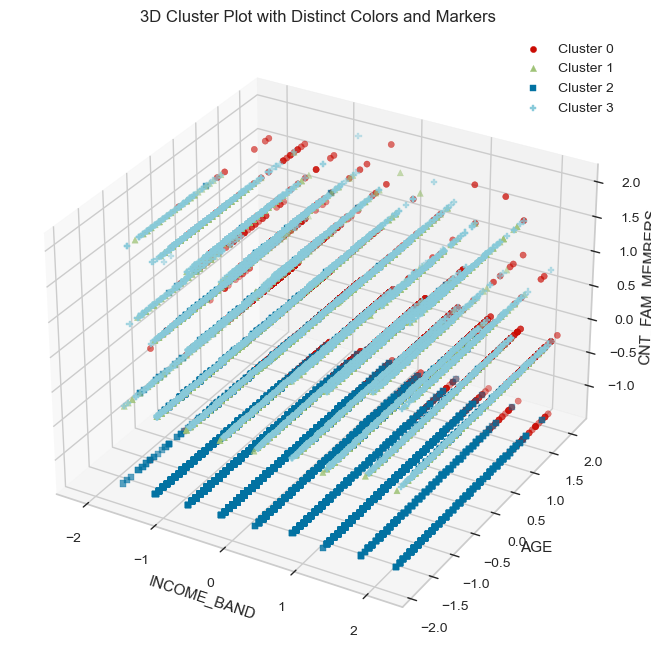

In [132]:
# Here we also tried to observe relationships using a more complex 3D cluster plot 

plot_3d_clusters(scaled_data, labels, ["INCOME_BAND", "AGE", "CNT_FAM_MEMBERS"])

There is a clear distinction between clusters having different family sizes

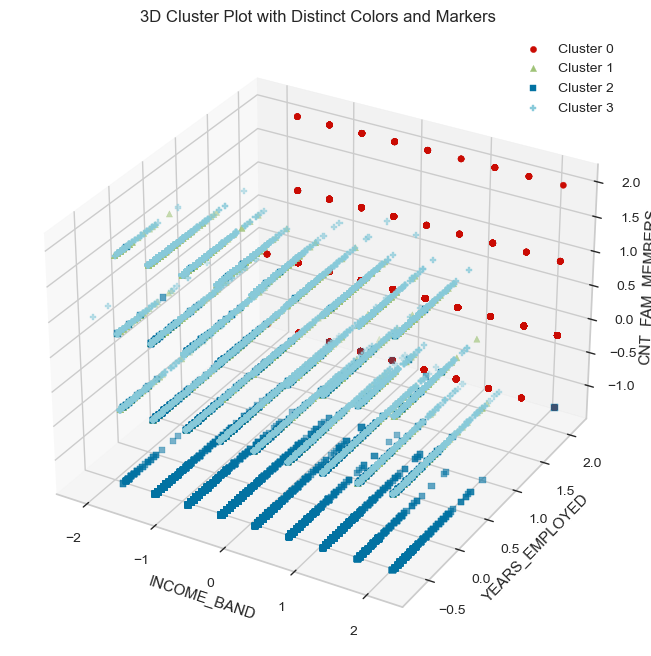

In [133]:
plot_3d_clusters(scaled_data, labels, ["INCOME_BAND", "YEARS_EMPLOYED", "CNT_FAM_MEMBERS"])

Another cluster emerges as years employed increase - our pensioners.

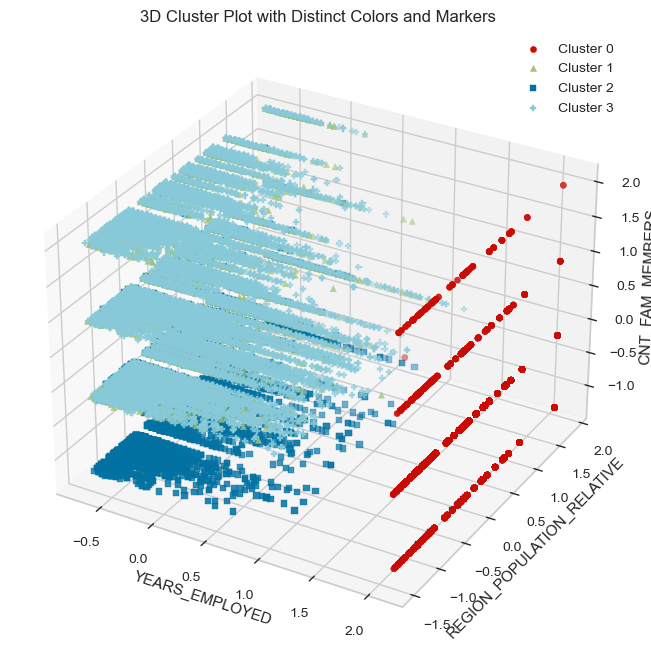

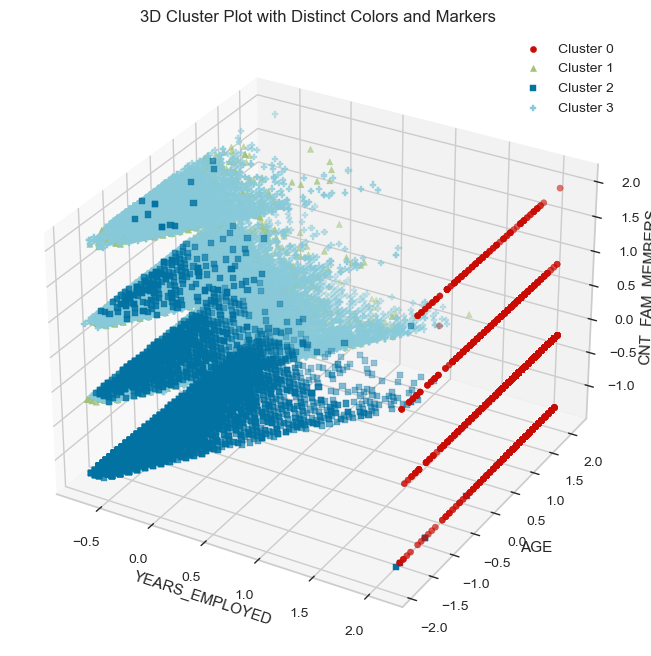

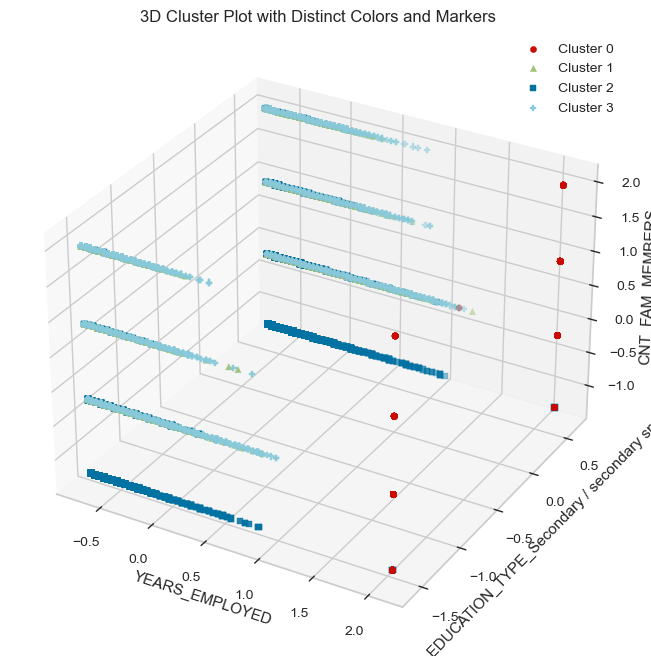

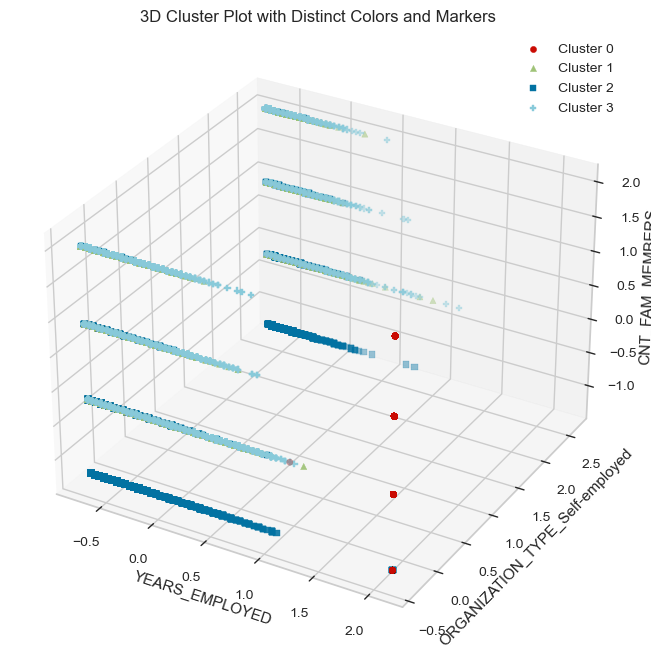

In [134]:
for i in ["REGION_POPULATION_RELATIVE", "AGE", "NAME_EDUCATION_TYPE_Secondary / secondary special", "ORGANIZATION_TYPE_Self-employed"]:
    plot_3d_clusters(scaled_data, labels, ["YEARS_EMPLOYED", i, "CNT_FAM_MEMBERS"])

Looking around more variables, we see there is a distinction where the pensioners are clustered seperately to self-employed clients

<Figure size 1500x600 with 0 Axes>

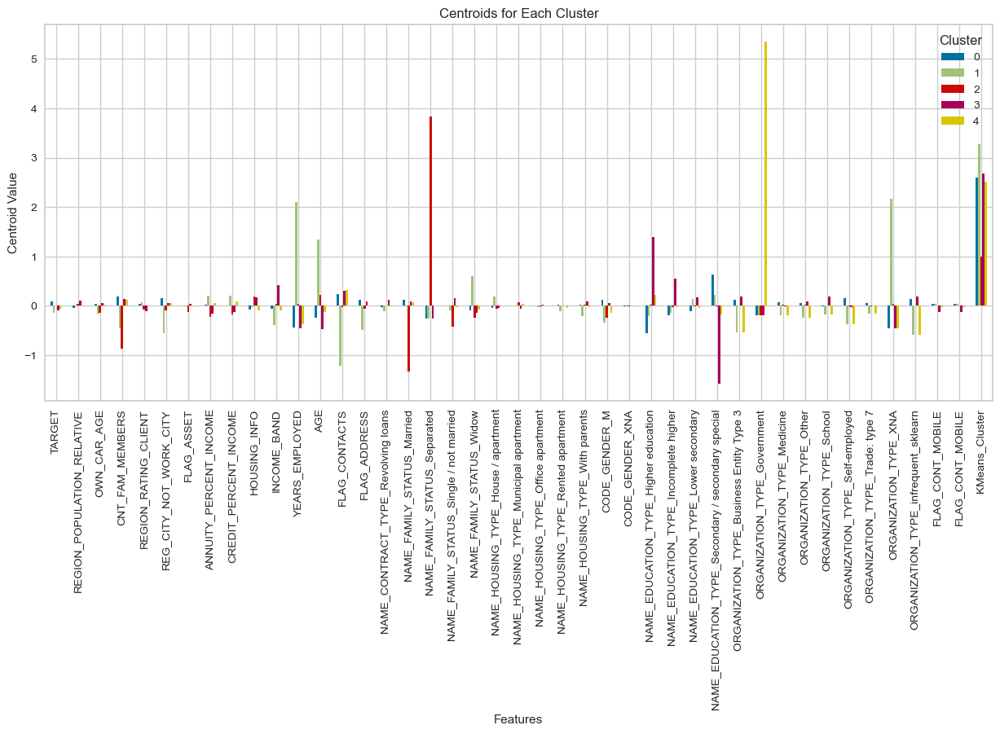

In [ ]:
# Here we bar plotted the comparison between centroids values of features for each cluster. Different colours represent different clusters.

centroids = km5.cluster_centers_ 

centroid_df = pd.DataFrame(centroids, columns=scaled_data.columns)

# Plot centroids
plt.figure(figsize=(15, 6))
centroid_df.T.plot(kind='bar', figsize=(15, 6), legend=True)
plt.title('Centroids for Each Cluster')
plt.ylabel('Centroid Value')
plt.xlabel('Features')
plt.legend(title='Cluster')
plt.xticks(rotation=90)
plt.show()

Looking at the cluster Centroids, we understand better what the composition of the clusters are. While the first cluster is people with secondary education and smaller careers, the second is composed of widowed pensioners that did not provide great contact or address information. The third cluster is composed of seperated people with small families, the fourth is young people with higher education and higher income, and the fifth is mostly defined by government workers 

## Hierarchical Clustering

For plotting suitability, the model was applied on a sample

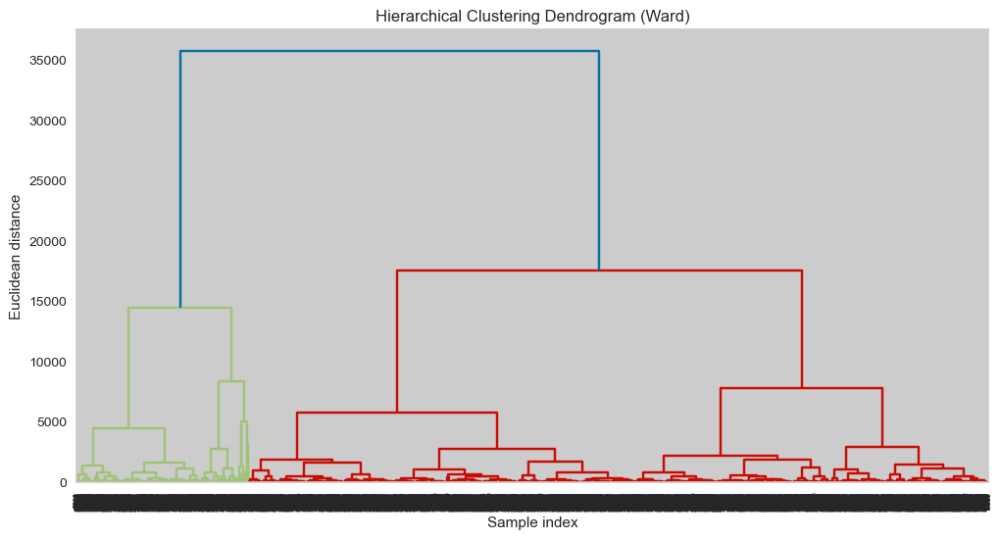

In [ ]:
# Visualization of the hierarchical clustering process by merging clusters step by step

# Sample plit
_, X_sample, _, y_sample = train_test_split(X_train, y_train, test_size=0.1, random_state=42, stratify=y_train)

linkage = linkage(X_sample, method="ward")

# Create a dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage)
plt.title('Hierarchical Clustering Dendrogram (Ward)')
plt.xlabel('Sample index')
plt.ylabel('Euclidean distance')
plt.show()

The dendogram gives us insight into the different cluster selections that would make sense

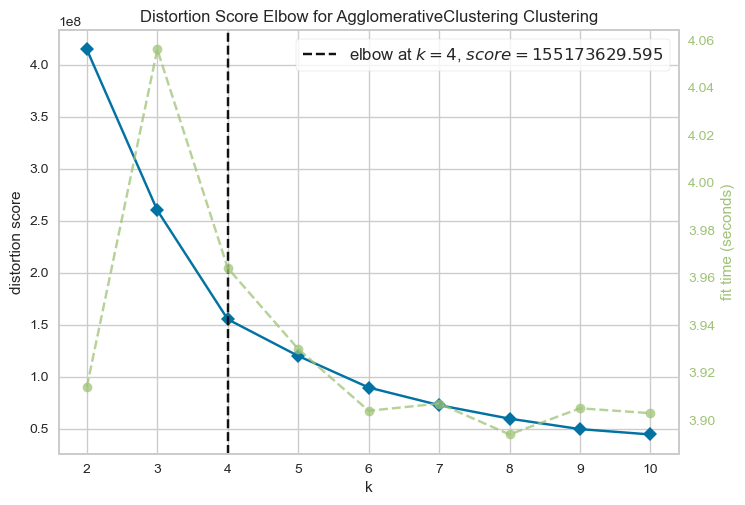

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [143]:
# Similar to the KMeans elbow plot but for Agglomerative Clustering. with 4 Klusters being the optimal number

KEV_ag = KElbowVisualizer(AgglomerativeClustering(), k=10)
KEV_ag.fit(X_sample)
KEV_ag.show()

## DBSCAN

In [374]:
# here we runned DBSCAN (Density-Based Spatial Clustering of Applications with Noise) to identify the clusters close to another, thus identifying noise. 
# the model can be controled by setting epsilon (maximmum distance between observations) and the minimum number of samples required in a neighborhood to be considered

dbs = DBSCAN(eps=4, min_samples=100)
dbs.fit(scaled_data)

DBSCAN(eps=4, min_samples=100)

In [375]:
dbscan_labels = dbs.labels_

# Count the number of unique clusters and noise points
clusters, counts = np.unique(dbscan_labels, return_counts=True)

# Number of unique clusters (excluding noise)
num_clusters = len(clusters) - (1 if -1 in clusters else 0)
print(f'Number of unique clusters: {num_clusters}')

# Create a DataFrame to display the cluster IDs and their corresponding counts
cluster_summary_df = pd.DataFrame({
    'Cluster_ID': clusters,
    'Number_of_Points': counts
})

# Highlight the noise points (-1)
cluster_summary_df['Type'] = ['Noise' if id == -1 else 'Cluster' for id in clusters]

cluster_summary_df

Number of unique clusters: 24


,Cluster_ID,Number_of_Points,Type
0,-1,17567,Noise
1,0,96041,Cluster
2,1,2594,Cluster
3,2,2896,Cluster
4,3,6182,Cluster
5,4,6566,Cluster
6,5,6175,Cluster
7,6,1789,Cluster
8,7,3291,Cluster
9,8,4175,Cluster


DBSCAN found 24 clusters, and returned 17,567 noisy points (points that did not belong to any cluster)

## PCA for Dimensionality Reduction

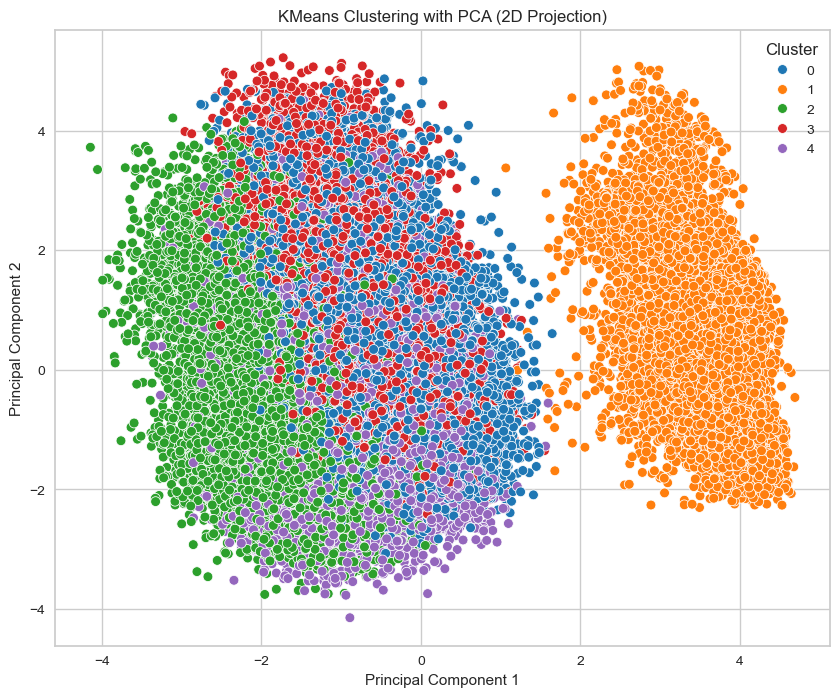

Performing PCA for Dimensionality Reduction...


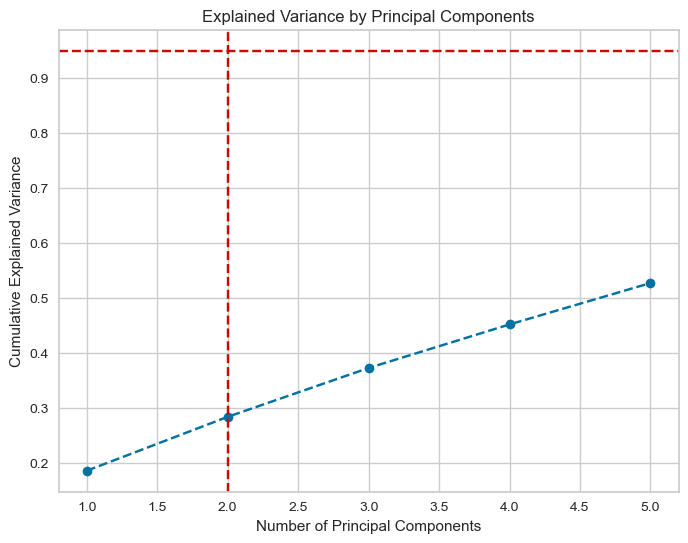

In [148]:
from sklearn.decomposition import PCA
# Visualize KMeans Clustering Results
pca = PCA(n_components=5)
pca_result = pca.fit_transform(scaled_data)
plt.figure(figsize=(10, 8))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=labels, palette='tab10', s=50)
plt.title('KMeans Clustering with PCA (2D Projection)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

# PCA for Dimensionality Reduction
print("Performing PCA for Dimensionality Reduction...")
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.axvline(x=2, color='r', linestyle='--')  # Adjust based on desired variance explained
plt.show()

Despite an informative PCA 2D Projection, where most clusters are well defined, we see that the cumulative explained variance by principal components shows small increases with component additions. Even with 5 principal components, we are only able to explain a little more than 50% of the data's variance

## Cluster visualization

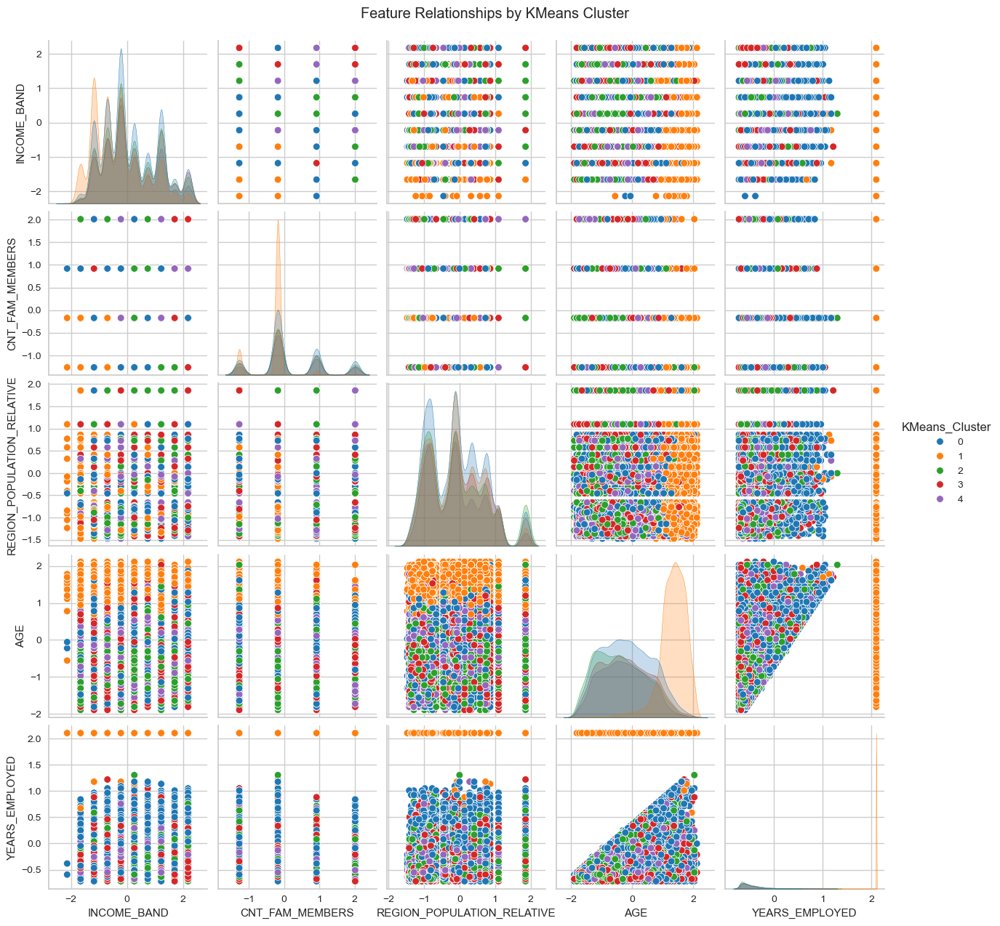

In [150]:
scaled_data['KMeans_Cluster'] = labels
important_features = ['INCOME_BAND', 'CNT_FAM_MEMBERS', 'REGION_POPULATION_RELATIVE', 'AGE', 'YEARS_EMPLOYED']
sns.pairplot(scaled_data, vars=important_features, hue='KMeans_Cluster', palette='tab10', diag_kind='kde', height=2.5)
plt.suptitle('Feature Relationships by KMeans Cluster', y=1.02)
plt.show()

Visualizing the clusters across diferent features lets us retrieve more information about their characteristics. The most notable cluster is the pensioner cluster.

## TSNE

Like PCA, TSNE is a method to represent high-dimensional data in lower dimensions. However, TSNE is non-linear and uses conditional probabilities, allowing for a different cluster visualization

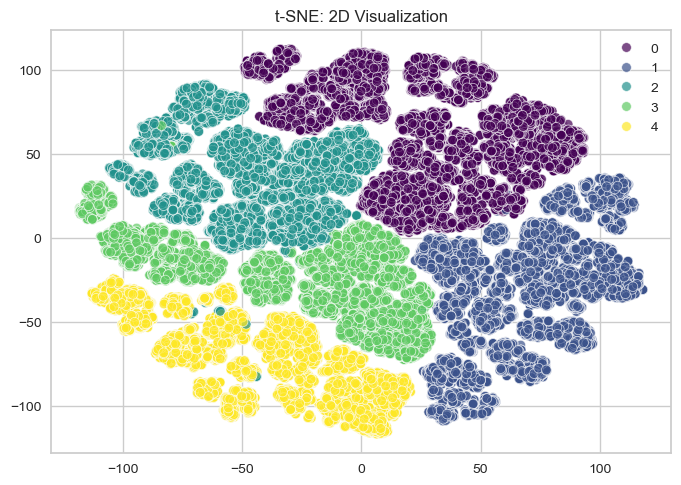

In [152]:
from sklearn.manifold import TSNE
# t-SNE Visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_data = tsne.fit_transform(scaled_data)
sns.scatterplot(x=tsne_data[:, 0], y=tsne_data[:, 1], hue=labels, palette='viridis', alpha=0.7)
plt.title("t-SNE: 2D Visualization")
plt.show()

Interestingly, TSNE seems to do a great job at capturing the five clusters, which become clearly defined

Let us try to select features that could be most useful for these models. Some features could be highly correlated or be representing very similar information. Removing these could prove benefitial.

## Feature selection

Returning to the original dataset, one column which was excluded for leakage can now return to the data, especially given the potential for these clustering algorithms to be used for marketing campaigns. FLAG_CONT_MOBILE referred to whether customers picked up their phones, and this could be useful information.

In [164]:
data_copy = pd.read_csv('project_data.csv')
final_df = pd.concat([final_df, data_copy['FLAG_CONT_MOBILE']], axis=1)
scaled_data = pd.DataFrame(scaler.fit_transform(final_df), columns=final_df.columns)

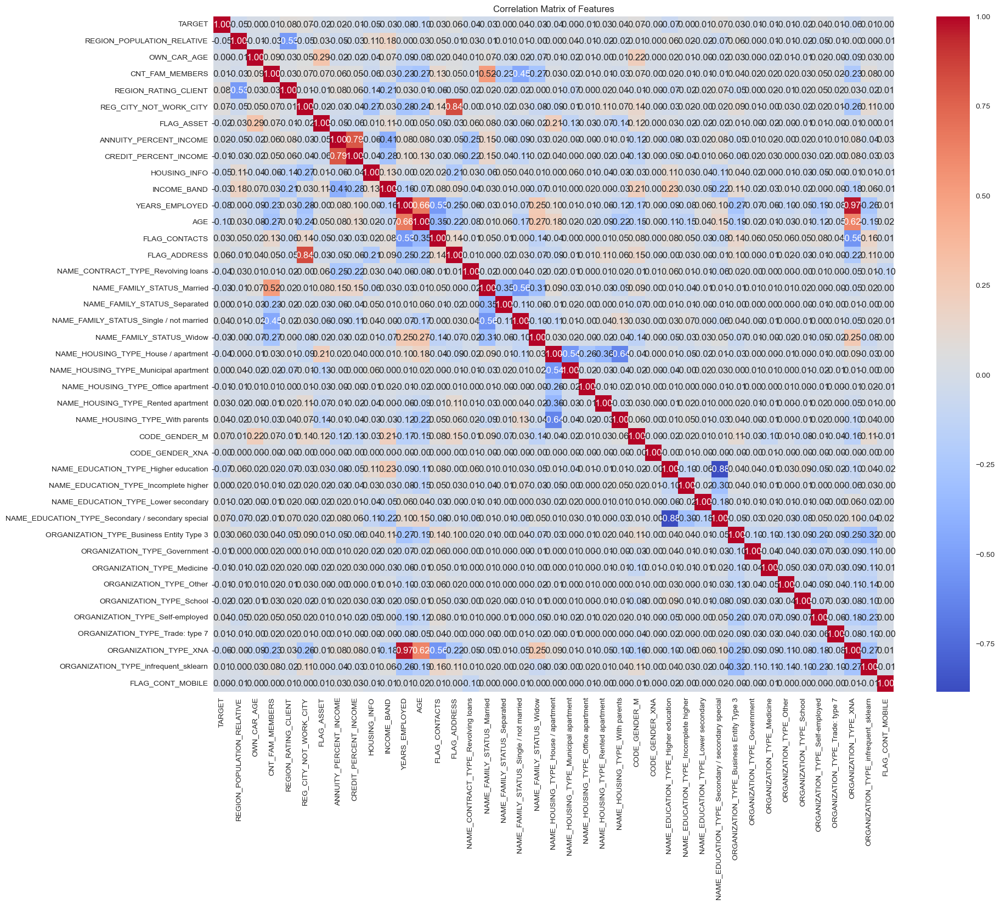

In [154]:
correlation_matrix = scaled_data.corr()

# Plotting the correlation matrix using a heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features')
plt.show()

The correlation matrix between the features shows us ORGANIZATION_TYPE_XNA (Pensioners) and YEARS_EMPLOYED are very correlated, as expected, as well as REG_CITY_NOT_WORK_CITY and FLAG_ADDRESS. We also see very low correlation between higher education and secondary education.

For the one hot encoded variables we decided to keep only the most common observation in each, as well as the top three for Organization Type. This allows us to reduce the number of features that display similar information, especially given the imbalance in these variables.

Finally, CREDIT_PERCENT_INCOME and HOUSING_INFO were also removed. The former shows similar information to ANNUITY_PERCENT_INCOME, and we expect the latter (related to how much housing information each client provided) to not provide useful information for cluster formation.

In [378]:
features_drop = [
    'NAME_FAMILY_STATUS_Separated','NAME_FAMILY_STATUS_Single / not married', 'NAME_FAMILY_STATUS_Widow','NAME_HOUSING_TYPE_Municipal apartment',
    'NAME_HOUSING_TYPE_Office apartment','NAME_HOUSING_TYPE_Rented apartment','NAME_HOUSING_TYPE_With parents',
    'CODE_GENDER_XNA',
    'NAME_EDUCATION_TYPE_Higher education','NAME_EDUCATION_TYPE_Incomplete higher','NAME_EDUCATION_TYPE_Lower secondary',
    'ORGANIZATION_TYPE_Government','ORGANIZATION_TYPE_Medicine','ORGANIZATION_TYPE_Other','ORGANIZATION_TYPE_School','ORGANIZATION_TYPE_Trade: type 7','ORGANIZATION_TYPE_infrequent_sklearn',
    'CREDIT_PERCENT_INCOME',
    'REG_CITY_NOT_WORK_CITY',
    'YEARS_EMPLOYED',
    'HOUSING_INFO']

scaled_data = scaled_data.drop(features_drop, axis=1) 

## K-Means Clustering

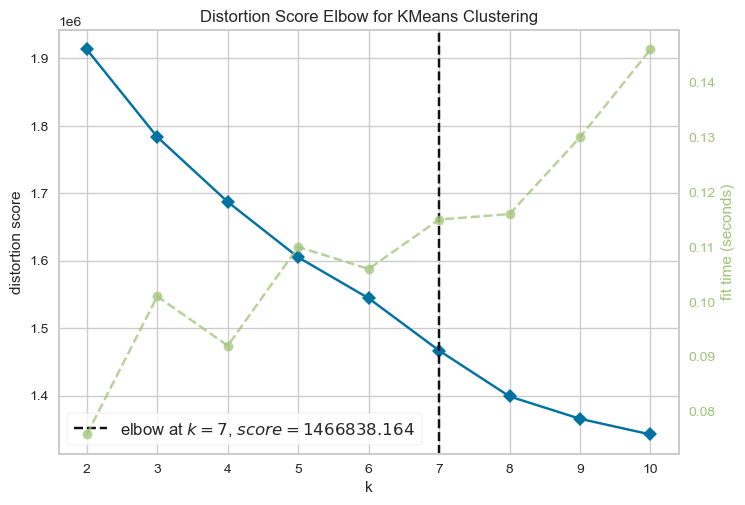

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [156]:
KEV = KElbowVisualizer(KMeans(random_state=42), k=10)
KEV.fit(scaled_data)
KEV.show()

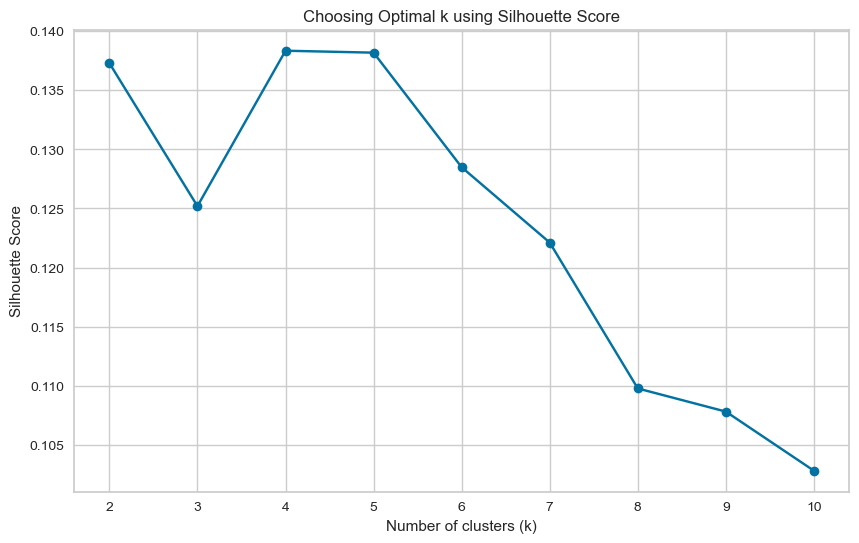

Optimal K: 4 with score 0.13833950342823623


In [157]:
# List to store the silhouette scores
silhouette_scores = []

# Range of k values to try
k_range = range(2, 11)
# Compute silhouette scores for different k values
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(scaled_data)  # Exclude the 'Cluster_Labels' column for fitting
    labels = kmeans.labels_
    score = silhouette_score(scaled_data, labels)
    silhouette_scores.append(score)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Choosing Optimal k using Silhouette Score')
plt.grid(True)
plt.show()

# Find the optimal k (where silhouette score is maximum)
optimal_k = k_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal K: {optimal_k} with score {max(silhouette_scores)}")

Balancing the information from both the Elbow and Silhouette methods, we decided to cluster the reduced dataset into 4 different clusters

In [158]:
km4 = KMeans(n_clusters=4, random_state=42) 
km4.fit(scaled_data)
labels = km4.labels_

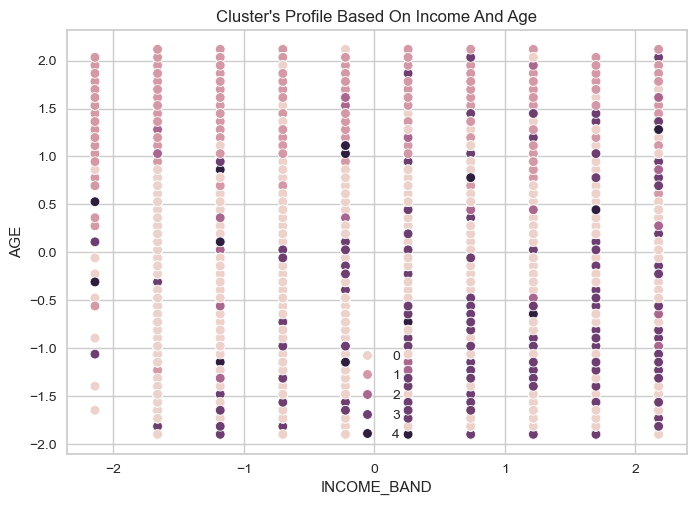

In [354]:
pl = sns.scatterplot(data = scaled_data, x= "INCOME_BAND", y="AGE", hue=labels) 
pl.set_title("Cluster's Profile Based On Income And Age")
plt.legend()
plt.show()

Again, a cluster of pensioners stands out

<Figure size 1500x600 with 0 Axes>

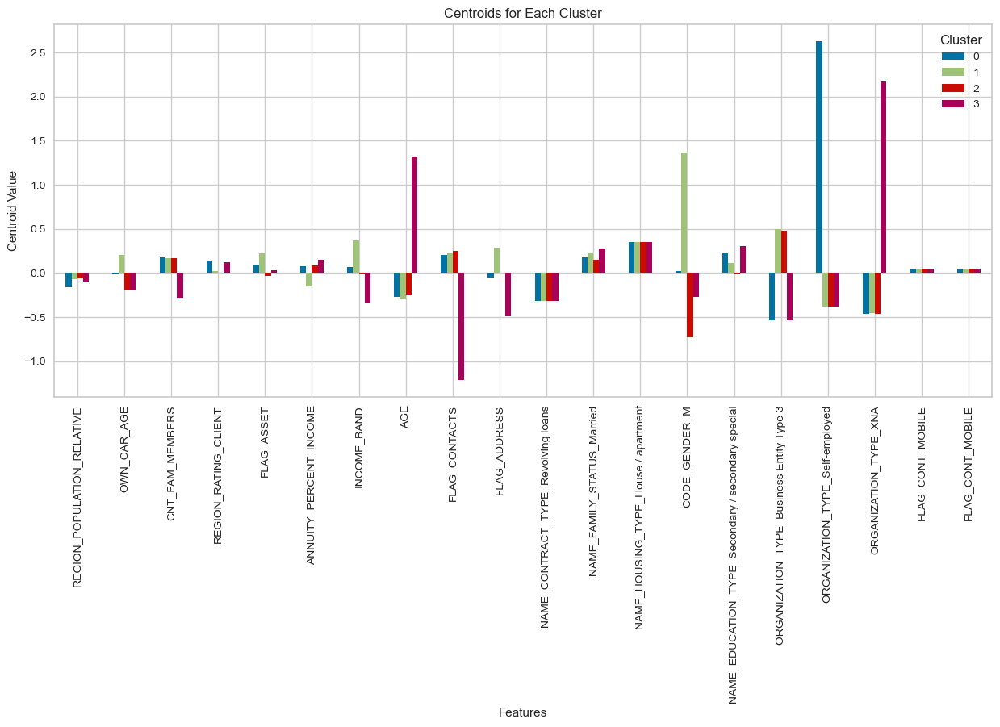

In [381]:
centroids = km4.cluster_centers_ 

centroid_df = pd.DataFrame(centroids, columns=scaled_data.columns)

# Plot centroids
plt.figure(figsize=(15, 6))
centroid_df.T.plot(kind='bar', figsize=(15, 6), legend=True)
plt.title('Centroids for Each Cluster')
plt.ylabel('Centroid Value')
plt.xlabel('Features')
plt.legend(title='Cluster')
plt.xticks(rotation=90)
plt.show()

From the Centroids of each cluster we are able to detect patterns in the different segments. 

If we had to explain and name these to management:

-> 0: The Entrepreneurs - Self-employed, Younger

-> 1: The Business Man - Male, Higher Income, Older Cars, Asset Holder, Works in Business

-> 2: The Modern Woman - Female, Newer Cars, Works in Business

-> 3: The Pensioner - Older, Not Working, Smaller Households, Lower Income, Bad Contact and Address Info

## Hierarchical Clustering

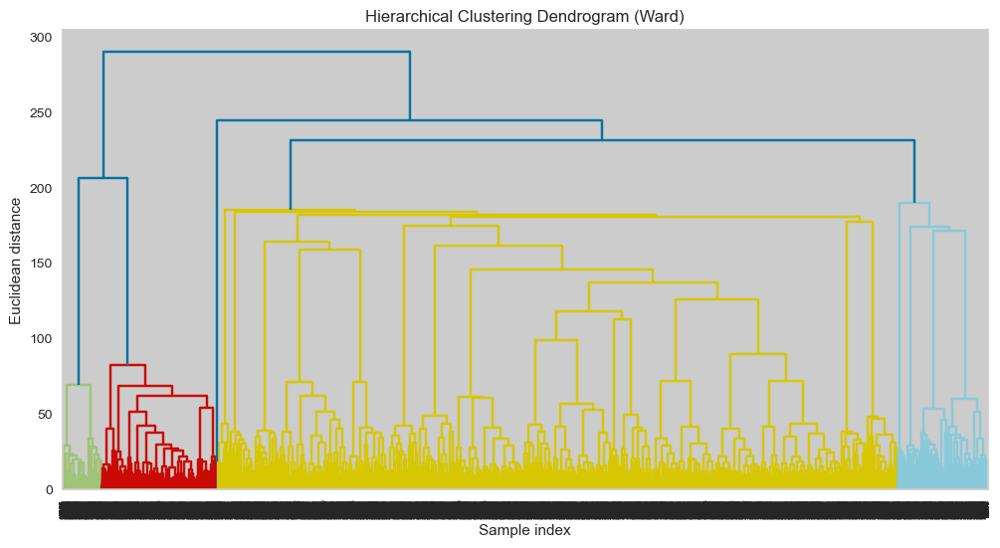

In [361]:
# Train-Test Split
_, X_sample, _, _ = train_test_split(scaled_data, y, test_size=0.1, random_state=42)

linkage = linkage(X_sample, method="ward")

# Create a dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage)
plt.title('Hierarchical Clustering Dendrogram (Ward)')
plt.xlabel('Sample index')
plt.ylabel('Euclidean distance')
plt.show()

c:\Users\afcas\anaconda3\Lib\site-packages\yellowbrick\utils\kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
c:\Users\afcas\anaconda3\Lib\site-packages\yellowbrick\cluster\elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


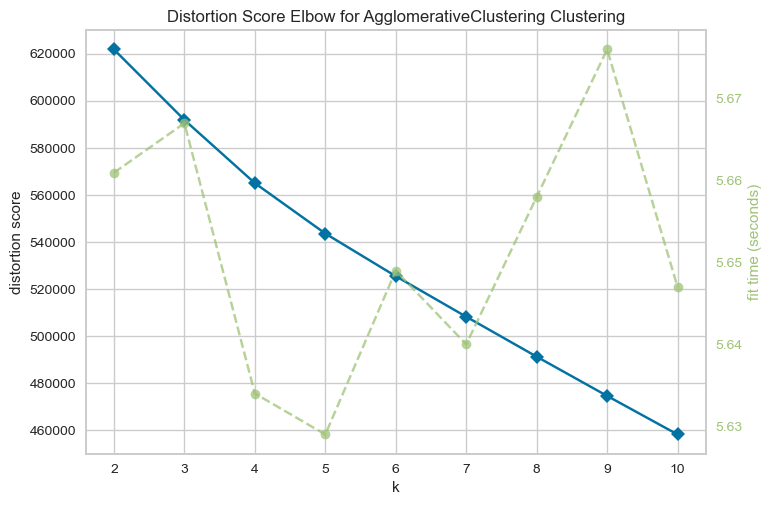

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [362]:
KEV_ag = KElbowVisualizer(AgglomerativeClustering(), k=10)
KEV_ag.fit(X_sample)
KEV_ag.show()

Both the Dendogram and the Elbow plot show the different number of cluster implications on our new data.

## DBSCAN

In [363]:
dbs = DBSCAN(eps=4, min_samples=100)
dbs.fit(scaled_data)

DBSCAN(eps=4, min_samples=100)

In [364]:
dbscan_labels = dbs.labels_

# Count the number of unique clusters and noise points
clusters, counts = np.unique(dbscan_labels, return_counts=True)

# Number of unique clusters (excluding noise)
num_clusters = len(clusters) - (1 if -1 in clusters else 0)
print(f'Number of unique clusters: {num_clusters}')

# Create a DataFrame to display the cluster IDs and their corresponding counts
cluster_summary_df = pd.DataFrame({
    'Cluster_ID': clusters,
    'Number_of_Points': counts
})

# Highlight the noise points (-1)
cluster_summary_df['Type'] = ['Noise' if id == -1 else 'Cluster' for id in clusters]

cluster_summary_df

Number of unique clusters: 22


,Cluster_ID,Number_of_Points,Type
0,-1,17386,Noise
1,0,96064,Cluster
2,1,2598,Cluster
3,2,2914,Cluster
4,3,6188,Cluster
5,4,6563,Cluster
6,5,6181,Cluster
7,6,2529,Cluster
8,7,3312,Cluster
9,8,4184,Cluster


Despite feature selection, DBSCAN performed similarly to before, creating 22 clusters with 17,386 being considered noise (not finding clusters).

## PCA for Dimensionality Reduction

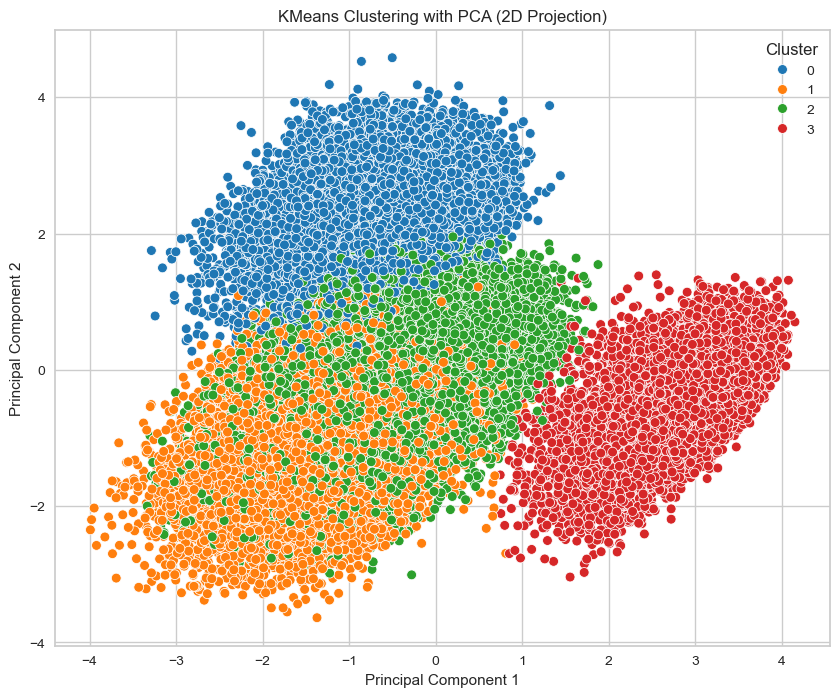

Performing PCA for Dimensionality Reduction...


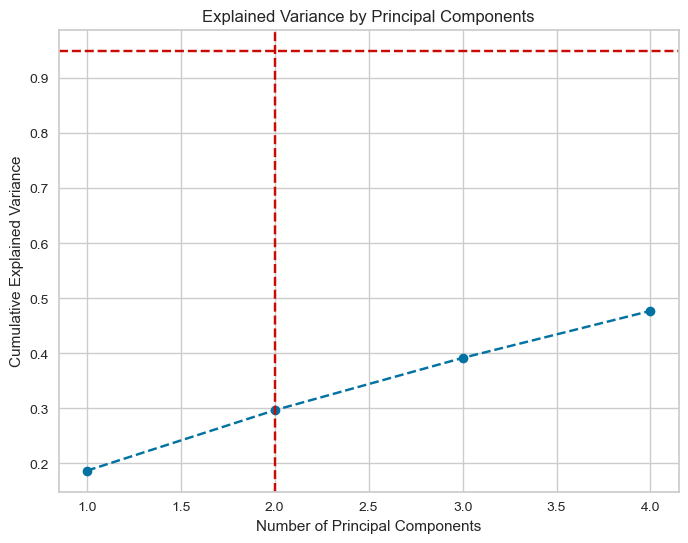

In [382]:
# Visualize KMeans Clustering Results
pca = PCA(n_components=4)
pca_result = pca.fit_transform(scaled_data)
plt.figure(figsize=(10, 8))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=labels, palette='tab10', s=50)
plt.title('KMeans Clustering with PCA (2D Projection)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

# PCA for Dimensionality Reduction
print("Performing PCA for Dimensionality Reduction...")
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.axvline(x=2, color='r', linestyle='--')  # Adjust based on desired variance explained
plt.show()

Our PCA 2D projection did indeed improve with our feature selection, more distinctly showing the different clusters.

Nonetheless, the impact of adding new components on the cumulative explained variance remains small.

## TSNE

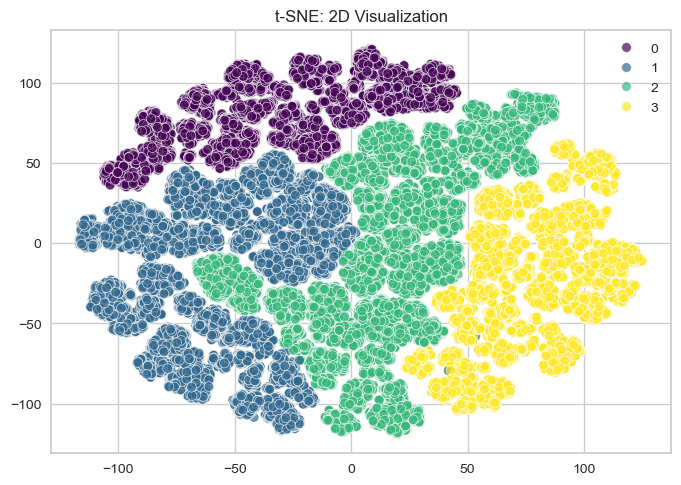

In [383]:
# t-SNE Visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_data = tsne.fit_transform(scaled_data)
sns.scatterplot(x=tsne_data[:, 0], y=tsne_data[:, 1], hue=labels, palette='viridis', alpha=0.7)
plt.title("t-SNE: 2D Visualization")
plt.show()

Finally, the non-linear nature of the T-SNE 2D Visualization once again showed great results in demonstrating cluster seperation, with the four clusters being distinctly different.